In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import statistics
import math
import seaborn as sns
from scipy import stats
import statsmodels.api as sm
import pandas as pd
import matplotlib as mpl
from sklearn.cluster import KMeans


In [2]:
#Model Data
ECearth_ds = xr.open_dataset('/share/pech2273/ECEarthProcessed.nc')
NorESM_ds = xr.open_dataset('/share/pech2273/NorESMProcessed.nc')
#Droplet Data from PARSEC
ECCDNC_ds = xr.open_dataset('/share/pech2273/ECCDNCParsec.nc')
NorCDNC_ds = xr.open_dataset('/share/pech2273/NorCDNCParsec.nc')


In [3]:
#EC-Earth Activation Radius from PARSEC
ECActR = [np.float64(361.54046296644844), 
 np.float64(203.16583101639702),
 np.float64(141.33523429255584),
 np.float64(251.5108263233402),
 np.float64(304.7839531499037),
 np.float64(141.33523429255584),
 np.float64(268.14425005353365),
 np.float64(124.34457265169122),
 np.float64(92.22282316159196),
 np.float64(160.6475298965127),
 np.float64(203.16583101639702),
 np.float64(96.24531891583946),
 np.float64(207.54929878718698),
 np.float64(98.3218898207321),
 np.float64(76.1032141604749),
 np.float64(121.71839935273819),
 np.float64(157.25463349130524),
 np.float64(81.13622616582478)]
ECActRdf = np.array(ECActR).reshape(3, 6)

ECActR_df = pd.DataFrame(ECActRdf, columns=["Cluster 1", "Cluster 2", "Cluster 3","Cluster 4", "Cluster 5", "Cluster 6"], index =['Updraft 1', 'Updraft2', 'Updraft 3'])
ECActR_df

,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5,Cluster 6
Updraft 1,361.540463,203.165831,141.335234,251.510826,304.783953,141.335234
Updraft2,268.144250,124.344573,92.222823,160.647530,203.165831,96.245319
Updraft 3,207.549299,98.321890,76.103214,121.718399,157.254633,81.136226


In [4]:
#EC-Earth Activation Radius from PARSEC with Co-Condensation

ECActR_CC = [np.nan,
 np.float64(190.56312424898383),
 np.float64(127.02740777196964),
 np.float64(240.99913346981475),
 np.float64(285.87770907458366),
 np.float64(127.02740777196964),
 np.float64(207.54929878718698),
 np.float64(102.61040941702),
 np.float64(72.92254148679628),
 np.float64(141.33523429255584),
 np.float64(186.53840665982455),
 np.float64(77.74520280028237),
 np.float64(144.38465673381506),
 np.float64(74.49590453102621),
 np.float64(57.66139958192239),
 np.float64(98.3218898207321),
 np.float64(132.5679799526813),
 np.float64(64.15613419567872)]
ECActR_CCdf = np.array(ECActR_CC).reshape(3, 6)

ECActR_CC_df = pd.DataFrame(ECActR_CCdf, columns=["Cluster 1", "Cluster 2", "Cluster 3","Cluster 4", "Cluster 5", "Cluster 6"], index =['Updraft 1', 'Updraft2', 'Updraft 3'])
ECActR_CC_df

,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5,Cluster 6
Updraft 1,NaN,190.563124,127.027408,240.999133,285.877709,127.027408
Updraft2,207.549299,102.610409,72.922541,141.335234,186.538407,77.745203
Updraft 3,144.384657,74.495905,57.661400,98.321890,132.567980,64.156134


In [5]:
#Calculating the increase of Droplet Numbers of EC-Earth with Co-condensation

for i in range(6):
    if i == 0:
        mask = ECearth_ds['label'] == i  
        ECearth_ds['DropletsCCUp1'] = xr.where( mask, np.nan, ECearth_ds['DropletsCCUp1'])
        continue
    mask = ECearth_ds['label'] == i  
    ECearth_ds['DropletsCCUp1'] = xr.where( mask, ECearth_ds['Droplets']*(1+ECCDNC_ds['Percentage_Increase'][i]/100), ECearth_ds['DropletsCCUp1'])
for i in range(6):
    if i == 0:
        mask = ECearth_ds['label'] == i  
        ECearth_ds['DropletsCCUp2'] = xr.where( mask, np.nan, ECearth_ds['DropletsCCUp2'])
        continue
    mask = ECearth_ds['label'] == i  
    ECearth_ds['DropletsCCUp2'] = xr.where(mask, ECearth_ds['Droplets']* (1+ECCDNC_ds['Percentage_Increase'][i+6]/100), ECearth_ds['DropletsCCUp2'])
for i in range(6):
    if i == 0:
        mask = ECearth_ds['label'] == i  
        ECearth_ds['DropletsCCUp3'] = xr.where( mask, np.nan, ECearth_ds['DropletsCCUp3'])
        continue
    mask = ECearth_ds['label'] == i  
    ECearth_ds['DropletsCCUp3'] = xr.where(mask, ECearth_ds['Droplets']* (1+ECCDNC_ds['Percentage_Increase'][i+12]/100), ECearth_ds['DropletsCCUp3'])

In [6]:

x = xr.DataArray(np.logspace(-0.5,4, num=200), dims =['D'], coords= {'D':np.logspace(-0.5,4, num=200)})

dx = xr.DataArray(np.logspace(-0.5,4, num=200), dims =['D'], coords= {'D':np.logspace(-0.5,4, num=200)})
for i in range (1,len(dx)):
    dx[i]= np.log10(x[i]/x[i-1])
dx[0] =dx[1]

In [7]:
#Calculating the Number of Activated Aerosols Based on the Activation Diameter From PARSEC
for i in range(6):
    if i == 0:
        mask = ECearth_ds['label'] == i  
        ECearth_ds['ActivatedNumberUpdraft1'] = xr.where( mask, ECearth_ds['Tot_dis'].where(ECearth_ds['D']>ECActR[i]).sum('D')*dx[0], ECearth_ds['ActivatedNumberUpdraft1'])
        ECearth_ds['ActivatedNumberUpdraft1CC'] = xr.where( mask, np.nan, ECearth_ds['ActivatedNumberUpdraft1CC']) 
        continue
    mask = ECearth_ds['label'] == i 
    ECearth_ds['ActivatedNumberUpdraft1'] = xr.where( mask, ECearth_ds['Tot_dis'].where(ECearth_ds['D']>ECActR[i]).sum('D')*dx[0], ECearth_ds['ActivatedNumberUpdraft1'])
    ECearth_ds['ActivatedNumberUpdraft1CC'] = xr.where( mask, ECearth_ds['Tot_dis'].where(ECearth_ds['D']>ECActR_CC[i]).sum('D')*dx[0], ECearth_ds['ActivatedNumberUpdraft1CC'])

for i in range(6):
    mask = ECearth_ds['label'] == i  
    ECearth_ds['ActivatedNumberUpdraft2'] = xr.where( mask, ECearth_ds['Tot_dis'].where(ECearth_ds['D']>ECActR[i+6]).sum('D')*dx[0], ECearth_ds['ActivatedNumberUpdraft2'])
    ECearth_ds['ActivatedNumberUpdraft2CC'] = xr.where( mask, ECearth_ds['Tot_dis'].where(ECearth_ds['D']>ECActR_CC[i+6]).sum('D')*dx[0], ECearth_ds['ActivatedNumberUpdraft2CC'])

for i in range(6):
    mask = ECearth_ds['label'] == i  
    ECearth_ds['ActivatedNumberUpdraft3'] = xr.where( mask, ECearth_ds['Tot_dis'].where(ECearth_ds['D']>ECActR[i+12]).sum('D')*dx[0], ECearth_ds['ActivatedNumberUpdraft3'])
    ECearth_ds['ActivatedNumberUpdraft3CC'] = xr.where( mask, ECearth_ds['Tot_dis'].where(ECearth_ds['D']>ECActR_CC[i+12]).sum('D')*dx[0], ECearth_ds['ActivatedNumberUpdraft3CC'])

In [8]:
#Group the Data by K-means Cluster
NorGroup = NorESM_ds.groupby(NorESM_ds['label'])
ECGroup = ECearth_ds.groupby(ECearth_ds['label'])

In [9]:
# For the Histograms
minimum = 1
maximum = 4


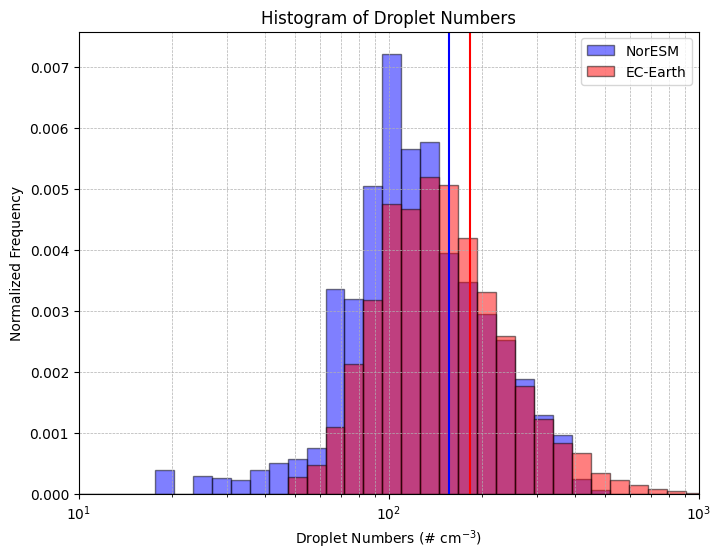

In [10]:
bins = np.logspace(minimum, maximum, 50)

plt.figure(figsize=(8, 6))
plt.hist(NorESM_ds['Droplets'].isel(lev = -1), bins=bins, alpha=0.5, label='NorESM', color='blue', edgecolor='black', density=True)
plt.hist(ECearth_ds['Droplets'].isel(lev = 0), bins=bins, alpha=0.5, label='EC-Earth', color='red', edgecolor='black', density=True)
plt.axvline(ECearth_ds['Droplets'].isel(lev = 0).median(), color = 'red')
plt.axvline(NorESM_ds['Droplets'].isel(lev = -1).median(), color = 'blue')

plt.xlim([10,10**3])
plt.xscale('log')
plt.ylabel('Normalized Frequency')
plt.xlabel(r'$\text{Droplet Numbers } (\#\ \text{cm}^{-3})$')
plt.title('Histogram of Droplet Numbers')
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()

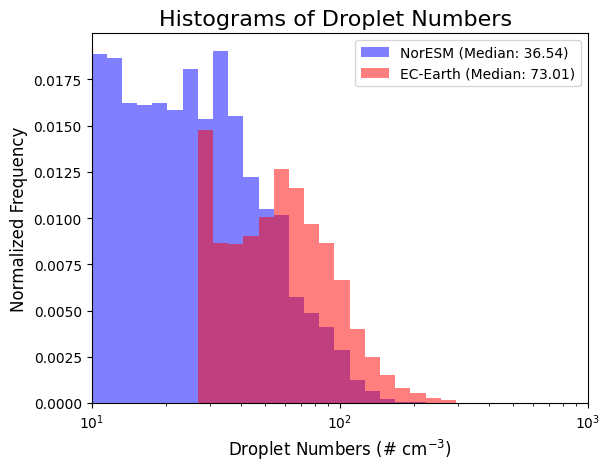

In [202]:

bins = np.logspace(minimum, maximum, 50)
data1 = NorESM_ds['Droplets'].isel(lev = -7)
data2 = ECearth_ds['Droplets'].isel(lev = 6)  
median1 = np.median(data1.dropna('time'))
median2 = np.median(data2.dropna('time'))
fig, ax = plt.subplots()
ax.hist(data1, bins=bins, alpha=0.5, label=f"NorESM (Median: {median1:.2f})", color="blue", density = True)
ax.hist(data2, bins=bins, alpha=0.5, label=f"EC-Earth (Median: {median2:.2f})", color="red", density = True)
plt.xscale('log')
legend = ax.legend(loc="upper right", frameon=True)
plt.xlim([10,1E3])
plt.xlabel(r'$\text{Droplet Numbers } (\#\ \text{cm}^{-3})$', fontsize = 12)
plt.ylabel("Normalized Frequency", fontsize = 12)
plt.title("Histograms of Droplet Numbers ", fontsize = 16)
plt.show()


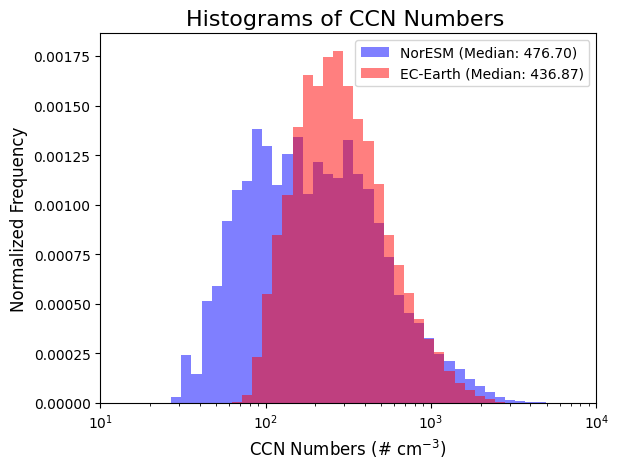

In [12]:

bins = np.logspace(minimum, maximum, 50)
data1 = NorESM_ds['TotN70'].isel(lev = -1)
data2 = ECearth_ds['TotN70'].isel(lev = 0)/1E6 
median1 = np.median(data1.dropna('time'))
median2 = np.median(data2.dropna('time'))
fig, ax = plt.subplots()
ax.hist(data1, bins=bins, alpha=0.5, label=f"NorESM (Median: {median1:.2f})", color="blue", density = True)
ax.hist(data2, bins=bins, alpha=0.5, label=f"EC-Earth (Median: {median2:.2f})", color="red", density = True)
plt.xscale('log')
legend = ax.legend(loc="upper right", frameon=True)
plt.xlim([10,1E4])
plt.xlabel(r'$\text{CCN Numbers } (\#\ \text{cm}^{-3})$', fontsize = 12)
plt.ylabel("Normalized Frequency", fontsize = 12)
plt.title("Histograms of CCN Numbers ", fontsize = 16)
plt.show()


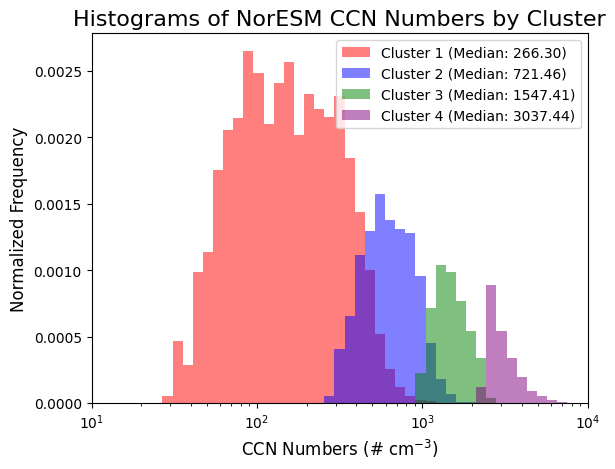

In [55]:
fig, ax = plt.subplots()
NorClusters = [3,1,0,2]
#NorClusters = [0,1,2,3]
bins = np.logspace(minimum, maximum, 50)
Norcolors = ['red','blue','green','purple']
for i in range(4):
    data = NorESM_ds['TotN70'].isel(lev = -1).where(NorESM_ds['label'] == NorClusters[i])
    median = np.median(data.dropna('time'))
    ax.hist(data, bins=bins, alpha=0.5, label=f"Cluster {i +1} (Median: {median:.2f})", color=Norcolors[i], density = True)

plt.xscale('log')
legend = ax.legend(loc="upper right", frameon=True)
plt.xlim([10,1E4])
plt.xlabel(r'$\text{CCN Numbers } (\#\ \text{cm}^{-3})$' ,fontsize = 12)
plt.ylabel("Normalized Frequency" ,fontsize = 12)
plt.title("Histograms of NorESM CCN Numbers by Cluster" ,fontsize = 16)
plt.show()


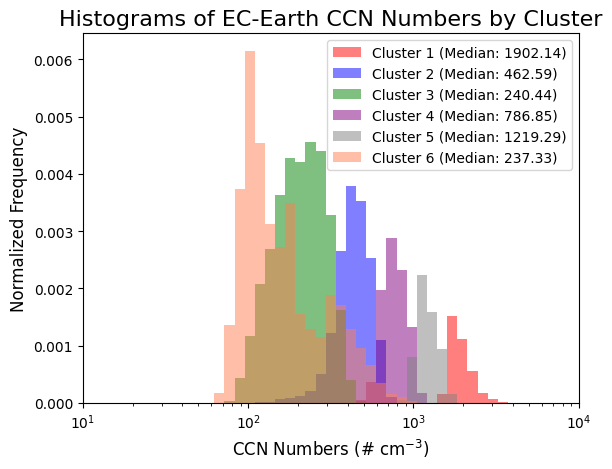

In [14]:
ECClusters = [5,2,1,3,4,0]
ECClusters = range(6)
bins = np.logspace(minimum, maximum, 50)
fig, ax = plt.subplots()
ECcolors = ['red','blue','green','purple','gray', 'coral']
for i in range(6):
    data = ECearth_ds['TotN70'].isel(lev = 0).where(ECearth_ds['label'] == ECClusters[i])/1E6
    median = np.median(data.dropna('time'))
    ax.hist(data, bins=bins, alpha=0.5, label=f"Cluster {i+1} (Median: {median:.2f})", color=ECcolors[i], density = True)

plt.xscale('log')
legend = ax.legend(loc="upper right", frameon=True)
plt.xlim([10,1E4])
plt.xlabel(r'$\text{CCN Numbers } (\#\ \text{cm}^{-3})$', fontsize = 12)
plt.ylabel("Normalized Frequency", fontsize = 12)
plt.title("Histograms of EC-Earth CCN Numbers by Cluster", fontsize = 16)
plt.show()


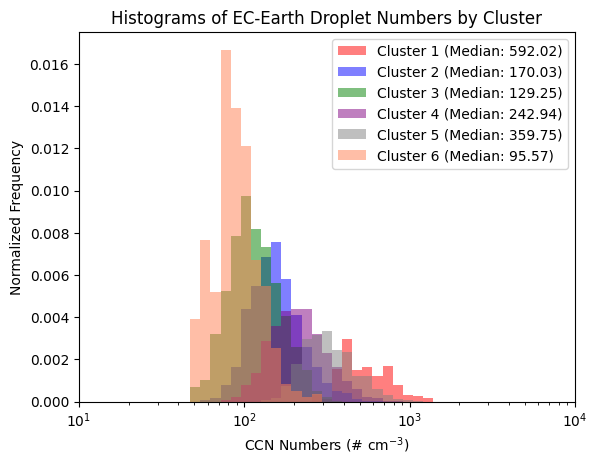

In [15]:

bins = np.logspace(minimum, maximum, 50)
fig, ax = plt.subplots()
ECcolors = ['red','blue','green','purple','gray', 'coral']
for i in range(6):
    data = ECearth_ds['Droplets'].isel(lev = 0).where(ECearth_ds['label'] == i)
    median = np.median(data.dropna('time'))
    ax.hist(data, bins=bins, alpha=0.5, label=f"Cluster {i+1} (Median: {median:.2f})", color=ECcolors[i], density = True)

plt.xscale('log')
legend = ax.legend(loc="upper right", frameon=True)
plt.xlim([10,1E4])
plt.xlabel(r'$\text{CCN Numbers } (\#\ \text{cm}^{-3})$')
plt.ylabel("Normalized Frequency")
plt.title("Histograms of EC-Earth Droplet Numbers by Cluster")
plt.show()


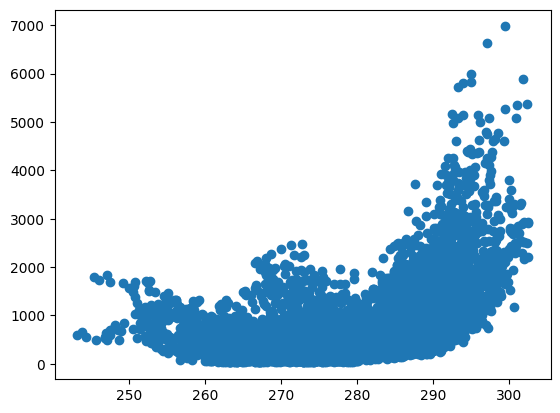

In [16]:
plt.scatter(NorESM_ds['T'].isel(lev = -1), NorESM_ds['TotN70'].isel(lev = -1))

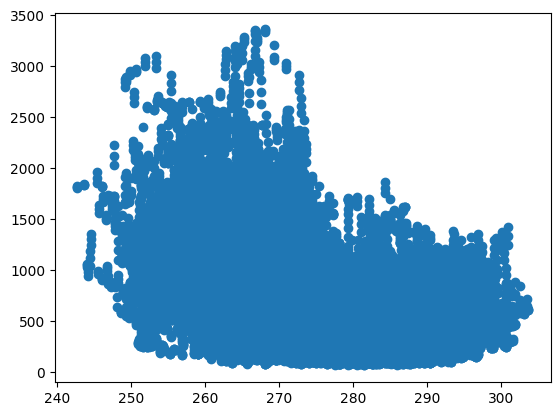

In [17]:
plt.scatter(ECearth_ds['T'].isel(lev = 0), ECearth_ds['TotN70'].isel(lev = 0)/1E6)

/home/pech2273/.local/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/pech2273/.local/lib/python3.12/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
/home/pech2273/.local/lib/python3.12/site-packages/matplotlib/axes/_axes.py:7096: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
/home/pech2273/.local/lib/python3.12/site-packages/matplotlib/axes/_axes.py:7097: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))
/home/pech2273/.local/lib/python3.12/site-packages/numpy/lib/_histograms_impl.py:901: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


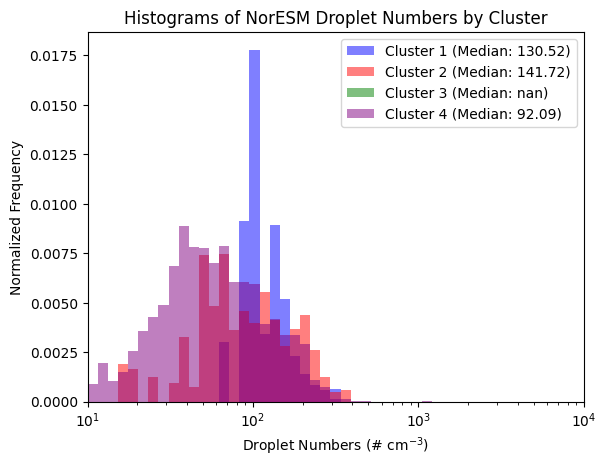

In [19]:

bins = np.logspace(minimum, maximum, 50)
data1 = NorESM_ds['Droplets'].isel(lev = -3).where(NorESM_ds['label'] == 0)
data2 = NorESM_ds['Droplets'].isel(lev = -3).where(NorESM_ds['label'] == 1)
data3 = NorESM_ds['Droplets'].isel(lev = -1).where(NorESM_ds['label'] == 2)
data4 = NorESM_ds['Droplets'].isel(lev = -3).where(NorESM_ds['label'] == 3)
median1 = np.median(data1.dropna('time'))
median2 = np.median(data2.dropna('time'))
median3 = np.median(data3.dropna('time'))
median4 = np.median(data4.dropna('time'))
fig, ax = plt.subplots()
ax.hist(data1, bins=bins, alpha=0.5, label=f"Cluster 1 (Median: {median1:.2f})", color="blue", density = True)
ax.hist(data2, bins=bins, alpha=0.5, label=f"Cluster 2 (Median: {median2:.2f})", color="red", density = True)
ax.hist(data3, bins=bins, alpha=0.5, label=f"Cluster 3 (Median: {median3:.2f})", color="green", density = True)
ax.hist(data4, bins=bins, alpha=0.5, label=f"Cluster 4 (Median: {median4:.2f})", color="purple", density = True)
plt.xscale('log')
legend = ax.legend(loc="upper right", frameon=True)
plt.xlim([10,1E4])
plt.xlabel(r'$\text{Droplet Numbers } (\#\ \text{cm}^{-3})$')
plt.ylabel("Normalized Frequency")
plt.title("Histograms of NorESM Droplet Numbers by Cluster")
plt.show()


In [20]:
from scipy.stats import bootstrap

data_tuple = (ECearth_ds['Droplets'].isel(lev=0).dropna('time'),)
data_tuple1 = (NorESM_ds['Droplets'].isel(lev=-1).dropna('time'),)

bootstrap_ci1 = bootstrap(data_tuple, np.median, confidence_level=0.95,random_state=1, method='percentile')
bootstrap_ci2 = bootstrap(data_tuple1, np.median, confidence_level=0.95,random_state=1, method='percentile')
print(bootstrap_ci1.confidence_interval)
print(bootstrap_ci2.confidence_interval)


ConfidenceInterval(low=np.float32(180.5274), high=np.float32(186.2163))
ConfidenceInterval(low=np.float32(148.14381), high=np.float32(164.3857))


In [21]:
from scipy.stats import bootstrap

data_tuple = (ECearth_ds['TotN70'].isel(lev=0).dropna('time')/1E6,)
data_tuple1 = (NorESM_ds['TotN70'].isel(lev=-1).dropna('time'),)

bootstrap_ci1 = bootstrap(data_tuple, np.median, confidence_level=0.95,random_state=1, method='percentile')
bootstrap_ci2 = bootstrap(data_tuple1, np.median, confidence_level=0.95,random_state=1, method='percentile')
print(bootstrap_ci1.confidence_interval)
print(bootstrap_ci2.confidence_interval)


ConfidenceInterval(low=np.float64(433.64699781588814), high=np.float64(439.7956263914833))
ConfidenceInterval(low=np.float64(464.5299223743908), high=np.float64(489.051731923769))


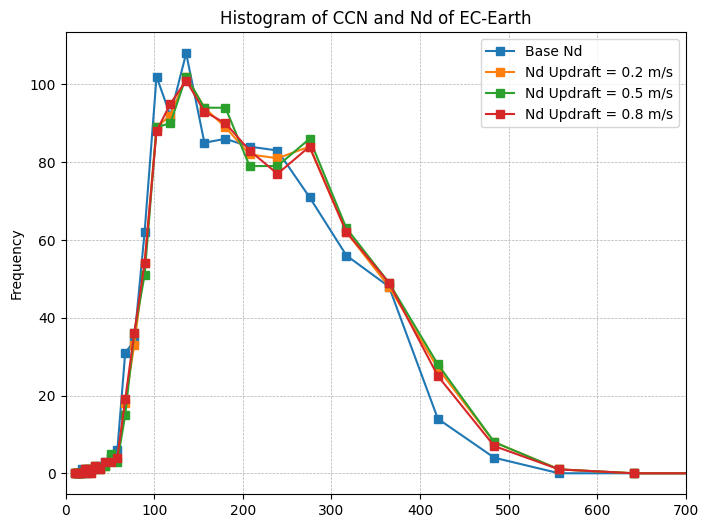

In [22]:
bins = np.logspace(minimum, maximum, 50)
hist_Droplets, bin_edges = np.histogram( NorESM_ds['Droplets'].isel(lev=-1), bins=bins)
hist_Droplets1, bin_edges = np.histogram( NorESM_ds['DropletsCCUp1'].isel(lev=-1), bins=bins)
hist_Droplets2, bin_edges = np.histogram( NorESM_ds['DropletsCCUp2'].isel(lev=-1), bins=bins)
hist_Droplets3, bin_edges = np.histogram( NorESM_ds['DropletsCCUp3'].isel(lev=-1), bins=bins)

bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, hist_Droplets, marker='s', linestyle='-', label='Base Nd')
plt.plot(bin_centers, hist_Droplets1, marker='s', linestyle='-', label='Nd Updraft = 0.2 m/s')
plt.plot(bin_centers, hist_Droplets2, marker='s', linestyle='-', label='Nd Updraft = 0.5 m/s')
plt.plot(bin_centers, hist_Droplets3, marker='s', linestyle='-', label='Nd Updraft = 0.8 m/s')

plt.xlim([0,700])
plt.ylabel('Frequency')
plt.title('Histogram of CCN and Nd of EC-Earth')
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()

In [25]:
NorActR = [np.float64(212.0273434344203),
 np.float64(174.96712605504354),
 np.float64(273.9296799762329),
 np.float64(119.14769117018751),
 np.float64(164.11363079662692),
 np.float64(124.34457265169122),
 np.float64(226.04956544882387),
 np.float64(81.13622616582478),
 np.float64(141.33523429255584),
 np.float64(102.61040941702),
 np.float64(194.67467838811976),
 np.float64(66.95444125855037)]
NorActR_CC = [np.float64(207.54929878718698),
 np.float64(171.27179794508717),
 np.float64(262.4810091517297),
 np.float64(114.16800917360587),
 np.float64(164.11363079662692),
 np.float64(119.14769117018751),
 np.float64(216.60200553100083),
 np.float64(74.49590453102621),
 np.float64(138.3502160437893),
 np.float64(96.24531891583946),
 np.float64(190.56312424898383),
 np.float64(60.17642489833283)]

NorActRno14 = [np.float64(171.27179794508717),
 np.float64(129.7681272383768),
 np.float64(226.04956544882387),
 np.float64(82.88680612635326),
 np.float64(127.02740777196964),
 np.float64(92.22282316159196),
 np.float64(174.96712605504354),
 np.float64(60.17642489833283),
 np.float64(107.08598197131427),
 np.float64(79.42261867825579),
 np.float64(147.49987294031467),
 np.float64(50.72961548053402)]
NorActR= np.array(NorActR).reshape(3, 4)

NorActR_df = pd.DataFrame(NorActR, columns=["Cluster 1", "Cluster 2", "Cluster 3","Cluster 4"], index =['Updraft 1', 'Updraft2', 'Updraft 3'])

In [26]:
NorActR_CCno14 = [np.float64(167.65451563806593),
 np.float64(121.71839935273819),
 np.float64(221.2753696768497),
 np.float64(74.49590453102621),
 np.float64(119.14769117018751),
 np.float64(82.88680612635326),
 np.float64(171.27179794508717),
 np.float64(54.08456923060725),
 np.float64(98.3218898207321),
 np.float64(68.39903769437733),
 np.float64(138.3502160437893),
 np.float64(46.57782066434512)]
NorActR_CC= np.array(NorActR_CC).reshape(3, 4)

NorActR_CC_df = pd.DataFrame(NorActR_CC, columns=["Cluster 1", "Cluster 2", "Cluster 3","Cluster 4"], index =['Updraft 1', 'Updraft2', 'Updraft 3'])

In [27]:
VarNamesReOrder = ['Lev1Up1NoCC','Lev2Up1NoCC','Lev3Up1NoCC',\
                   'Lev1Up1CC','Lev2Up1CC','Lev3Up1CC',\
                   'Lev1Up2NoCC','Lev2Up2NoCC','Lev3Up2NoCC',\
                   'Lev1Up2CC','Lev2Up2CC','Lev3Up2CC',\
                   'Lev1Up3NoCC','Lev2Up3NoCC','Lev3Up3NoCC',\
                   'Lev1Up3CC','Lev2Up3CC','Lev3Up3CC']
VarLev3 = ['Lev3Up1NoCC','Lev3Up1CC','Lev3Up2NoCC','Lev3Up2CC','Lev3Up3NoCC','Lev3Up3CC']

In [28]:
NorDiameterUp1NoCC = []
NorDiameterUp2NoCC = []
NorDiameterUp3NoCC = []
NorDiameterUp1CC = []
NorDiameterUp2CC = []
NorDiameterUp3CC = []

ListVarNor = [NorDiameterUp1NoCC,NorDiameterUp2NoCC,NorDiameterUp3NoCC,NorDiameterUp1CC,NorDiameterUp2CC,NorDiameterUp3CC]
for z in [-1,-2,-3]:
    ClusterWeight = []
    for i in range(4):
        ClusterWeight.append(len(NorGroup[i]['Droplets'].isel(lev = z).dropna('time'))/len(NorESM_ds['Droplets'].isel(lev = z).dropna('time')))
    print(ClusterWeight)
    for i in range(3):
        ListVarNor[i].append(sum(ClusterWeight*NorActR_df.values[i]))
        ListVarNor[i+3].append(sum(ClusterWeight*NorActR_CC_df.values[i]))


[0.009183673469387756, 0.04897959183673469, 0.0, 0.9418367346938775]
[0.012802275960170697, 0.09957325746799431, 0.0, 0.887624466571835]
[0.020242914979757085, 0.13128976286871025, 0.0, 0.8484673221515326]


In [29]:
NorDiameterUp1NoCC = []
NorDiameterUp2NoCC = []
NorDiameterUp3NoCC = []
NorDiameterUp1CC = []
NorDiameterUp2CC = []
NorDiameterUp3CC = []

ListVarNor = [NorDiameterUp1NoCC,NorDiameterUp2NoCC,NorDiameterUp3NoCC,NorDiameterUp1CC,NorDiameterUp2CC,NorDiameterUp3CC]
for z in [-1,-2,-3]:
    ClusterWeight = []
    for i in range(4):
        ClusterWeight.append(len(NorGroup[i]['Droplets'].isel(lev = z).dropna('time'))/len(NorESM_ds['Droplets'].isel(lev = z).dropna('time')))
    print(ClusterWeight)
    for i in range(3):
        ListVarNor[i].append(sum(ClusterWeight*NorActR_df.values[i]))
        ListVarNor[i+3].append(sum(ClusterWeight*NorActR_CC_df.values[i]))



[0.009183673469387756, 0.04897959183673469, 0.0, 0.9418367346938775]
[0.012802275960170697, 0.09957325746799431, 0.0, 0.887624466571835]
[0.020242914979757085, 0.13128976286871025, 0.0, 0.8484673221515326]


In [30]:
ECDiameterUp1NoCC = []
ECDiameterUp2NoCC = []
ECDiameterUp3NoCC = []
ECDiameterUp1CC = []
ECDiameterUp2CC = []
ECDiameterUp3CC = []
ListVarEC = [ECDiameterUp1NoCC,ECDiameterUp2NoCC,ECDiameterUp3NoCC,ECDiameterUp1CC,ECDiameterUp2CC,ECDiameterUp3CC]

for z in [0,1,2]:
    ClusterWeight = []
    for i in range(6):
        ClusterWeight.append(len(ECGroup[i]['Droplets'].isel(lev = z).dropna('time'))/len(ECearth_ds['Droplets'].isel(lev = z).dropna('time')))
    if z == 0:
        print(ClusterWeight[5],ClusterWeight[2],ClusterWeight[1],ClusterWeight[3],ClusterWeight[4],ClusterWeight[0])
    for i in range(3):
        if i == 0:
            ListVarEC[i].append(sum(ClusterWeight*ECActR_df.values[i]))
            ListVarEC[i+3].append(sum(ClusterWeight[1:]*ECActR_CC_df.iloc[0][1:]))
            continue
        ListVarEC[i].append(sum(ClusterWeight*ECActR_df.values[i]))
        ListVarEC[i+3].append(sum(ClusterWeight*ECActR_CC_df.values[i]))



0.020155038759689922 0.2897815362931642 0.3386892177589852 0.22212825933756167 0.10429880197322058 0.024947145877378434


In [31]:
ListNames = ['Lev1Up1NoCC','Lev2Up1NoCC','Lev3Up1NoCC','Lev1Up2NoCC','Lev2Up2NoCC','Lev3Up2NoCC','Lev1Up3NoCC','Lev2Up3NoCC','Lev3Up3NoCC',\
             'Lev1Up1CC','Lev2Up1CC','Lev3Up1CC','Lev1Up2CC','Lev2Up2CC','Lev3Up2CC','Lev1Up3CC','Lev2Up3CC','Lev3Up3CC']
for i in range(0,18,3):
    NorESM_ds[ListNames[i]] = NorESM_ds['Tot_dis'].isel(lev = -1).where(NorESM_ds['D']>ListVarNor[int(i/3)][0]).sum('D')*dx[0]
    NorESM_ds[ListNames[i+1]] = NorESM_ds['Tot_dis'].isel(lev = -2).where(NorESM_ds['D']>ListVarNor[int(i/3)][1]).sum('D')*dx[0]
    NorESM_ds[ListNames[i+2]] = NorESM_ds['Tot_dis'].isel(lev = -3).where(NorESM_ds['D']>ListVarNor[int(i/3)][2]).sum('D')*dx[0]
for i in range(0,18,3):
    ECearth_ds[ListNames[i]] = ECearth_ds['Tot_dis'].isel(lev = 0).where(ECearth_ds['D']>ListVarEC[int(i/3)][0]).sum('D')*dx[0]
    ECearth_ds[ListNames[i+1]] = ECearth_ds['Tot_dis'].isel(lev = 1).where(ECearth_ds['D']>ListVarEC[int(i/3)][1]).sum('D')*dx[0]
    ECearth_ds[ListNames[i+2]] = ECearth_ds['Tot_dis'].isel(lev = 2).where(ECearth_ds['D']>ListVarEC[int(i/3)][2]).sum('D')*dx[0]

In [32]:
def NdtoCCNGraph(x,y):
    
    x = x.to_numpy()
    y = y.to_numpy()
    Y = np.log10(y)
    X = np.log10(x)
    X = sm.add_constant(X)
    model = sm.OLS(Y,X).fit()
    res = stats.linregress(np.log10(x),np.log10(y))
    lims = [1,10000]
    fig = plt.hexbin(x,y,gridsize=50, bins= 'log', xscale='log', yscale='log',edgecolors = 'face', cmap ='inferno',extent = [0,4,0,4], mincnt = 1)
    plt.xlim(lims)
    plt.ylim(lims)
    plt.plot([1,10000],[10**res.intercept*1**res.slope,10**res.intercept*10000**res.slope])
    plt.plot(lims,lims)
    plt.colorbar()
    
    return fig
    
def Susceptibility(x,y):
    x = x.to_numpy()
    y = y.to_numpy()
    Y = np.log10(y)
    X = np.log10(x)
    X = sm.add_constant(X)
    model = sm.OLS(Y,X).fit()
    parameters = model.params
    sterrs = model.bse
    S = parameters[1]
    Sterr = sterrs[1]
    return S, Sterr
    
def SusceptibilityGraph(model):

    parameters = model.params
    sterrs = model.bse
    S = parameters[1]
    Sterr = sterrs[1]
    return S, Sterr

In [33]:
SensitivityEC = []
YerrEC= []
BaseCaselev1EC = Susceptibility(ECearth_ds['TotN70'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev = 0)>0).dropna('time')/1E6,ECearth_ds['Droplets'].isel(lev = 0).dropna('time'))
BaseCaselev2EC = Susceptibility(ECearth_ds['TotN70'].isel(lev = 1).where(ECearth_ds['Droplets'].isel(lev = 1)>0).dropna('time')/1E6,ECearth_ds['Droplets'].isel(lev = 1).dropna('time'))
BaseCaselev3EC = Susceptibility(ECearth_ds['TotN70'].isel(lev = 2).where(ECearth_ds['Droplets'].isel(lev = 2)>0).dropna('time')/1E6,ECearth_ds['Droplets'].isel(lev = 2).dropna('time'))

for name in [BaseCaselev1EC,BaseCaselev2EC, BaseCaselev3EC]:
    SensitivityEC.append(name[0])
    YerrEC.append(name[1]*1.96)
    
for i in range (18):
    z = [0,1, 2][i % 3]
    if i in [3,4,5]:
        SensitivityEC.append(Susceptibility(ECearth_ds[VarNamesReOrder[i]].where(ECearth_ds['DropletsCCUp1'].isel(lev = z)>0).dropna('time')/1E6,ECearth_ds['DropletsCCUp1'].isel(lev = z).dropna('time'))[0])
        YerrEC.append(Susceptibility(ECearth_ds[VarNamesReOrder[i]].where(ECearth_ds['DropletsCCUp1'].isel(lev = z)>0).dropna('time')/1E6,ECearth_ds['DropletsCCUp1'].isel(lev = z).dropna('time'))[1]*1.96)
        continue
    if i in [9,10,11]:
        SensitivityEC.append(Susceptibility(ECearth_ds[VarNamesReOrder[i]].where(ECearth_ds['DropletsCCUp2'].isel(lev = z)>0).dropna('time')/1E6,ECearth_ds['DropletsCCUp2'].isel(lev = z).dropna('time'))[0])
        YerrEC.append(Susceptibility(ECearth_ds[VarNamesReOrder[i]].where(ECearth_ds['DropletsCCUp2'].isel(lev = z)>0).dropna('time')/1E6,ECearth_ds['DropletsCCUp2'].isel(lev = z).dropna('time'))[1]*1.96)
        continue
    if i in [15,16,17]:
        SensitivityEC.append(Susceptibility(ECearth_ds[VarNamesReOrder[i]].where(ECearth_ds['DropletsCCUp3'].isel(lev = z)>0).dropna('time')/1E6,ECearth_ds['DropletsCCUp3'].isel(lev = z).dropna('time'))[0])
        YerrEC.append(Susceptibility(ECearth_ds[VarNamesReOrder[i]].where(ECearth_ds['DropletsCCUp3'].isel(lev = z)>0).dropna('time')/1E6,ECearth_ds['DropletsCCUp3'].isel(lev = z).dropna('time'))[1]*1.96)
        continue   
    SensitivityEC.append(Susceptibility(ECearth_ds[VarNamesReOrder[i]].where(ECearth_ds['Droplets'].isel(lev = z)>0).dropna('time')/1E6,ECearth_ds['Droplets'].isel(lev = z).dropna('time'))[0])
    YerrEC.append(Susceptibility(ECearth_ds[VarNamesReOrder[i]].where(ECearth_ds['Droplets'].isel(lev = z)>0).dropna('time')/1E6,ECearth_ds['Droplets'].isel(lev = z).dropna('time'))[1]*1.96)

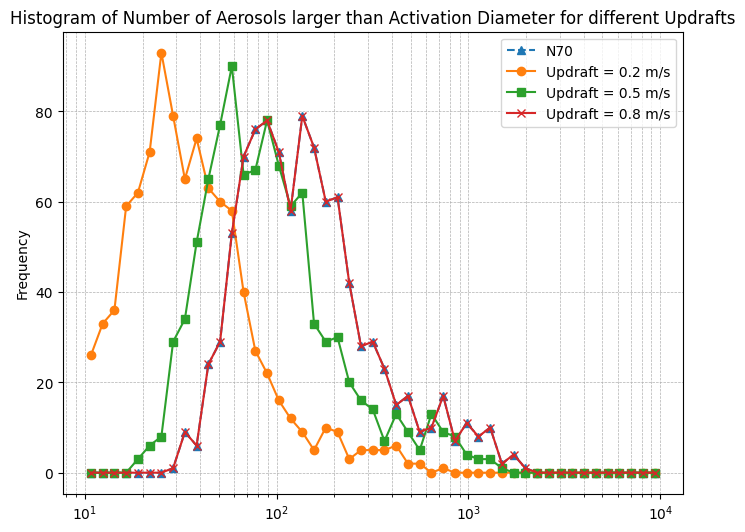

In [34]:
bins = np.logspace(minimum, maximum, 50)
hist_n70, bin_edges = np.histogram(NorESM_ds['TotN70'].isel(lev=-1).where(NorESM_ds['Droplets'].isel(lev=-1) > 0),bins=bins)
hist_Activated1, bin_edges = np.histogram(NorESM_ds['Lev1Up1NoCC'].where(NorESM_ds['Droplets'].isel(lev=-1) > 0),bins=bins)
hist_Activated2, bin_edges = np.histogram(NorESM_ds['Lev1Up2NoCC'].where(NorESM_ds['Droplets'].isel(lev=-1) > 0),bins=bins)
hist_Activated3, bin_edges = np.histogram(NorESM_ds['Lev1Up3NoCC'].where(NorESM_ds['Droplets'].isel(lev=-1) > 0),bins=bins)

bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, hist_n70, marker='^', linestyle='--', label='N70')
plt.plot(bin_centers, hist_Activated1, marker='o', linestyle='-', label='Updraft = 0.2 m/s')
plt.plot(bin_centers, hist_Activated2, marker='s', linestyle='-', label='Updraft = 0.5 m/s')
plt.plot(bin_centers, hist_Activated3, marker='x', linestyle='-', label='Updraft = 0.8 m/s')

plt.xscale('log')
plt.ylabel('Frequency')
plt.title('Histogram of Number of Aerosols larger than Activation Diameter for different Updrafts')
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()

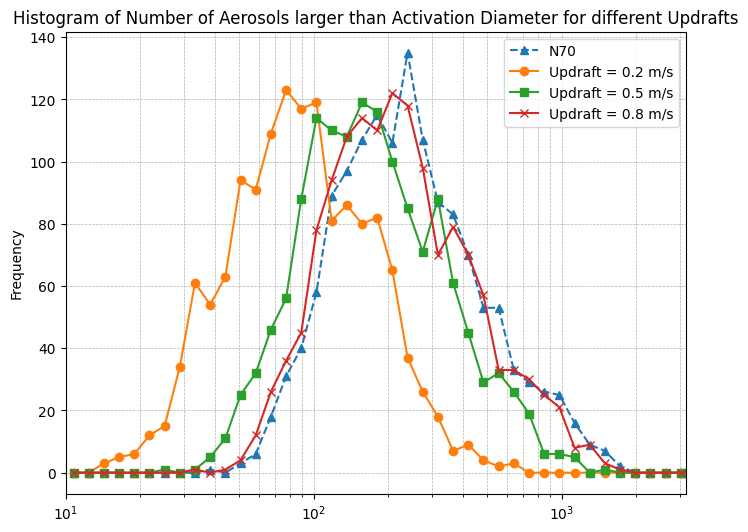

In [35]:
bins = np.logspace(minimum, maximum, 50)
hist_n70, bin_edges = np.histogram(NorESM_ds['TotN70'].isel(lev=-2).where(NorESM_ds['Droplets'].isel(lev=-2) > 0),bins=bins)
hist_Activated1, bin_edges = np.histogram(NorESM_ds['Lev2Up1NoCC'].where(NorESM_ds['Droplets'].isel(lev=-2) > 0),bins=bins)
hist_Activated2, bin_edges = np.histogram(NorESM_ds['Lev2Up2NoCC'].where(NorESM_ds['Droplets'].isel(lev=-2) > 0),bins=bins)
hist_Activated3, bin_edges = np.histogram(NorESM_ds['Lev2Up3NoCC'].where(NorESM_ds['Droplets'].isel(lev=-2) > 0),bins=bins)

bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, hist_n70, marker='^', linestyle='--', label='N70')
plt.plot(bin_centers, hist_Activated1, marker='o', linestyle='-', label='Updraft = 0.2 m/s')
plt.plot(bin_centers, hist_Activated2, marker='s', linestyle='-', label='Updraft = 0.5 m/s')
plt.plot(bin_centers, hist_Activated3, marker='x', linestyle='-', label='Updraft = 0.8 m/s')

plt.xscale('log')
plt.xlim([1E1,10**3.5])
plt.ylabel('Frequency')
plt.title('Histogram of Number of Aerosols larger than Activation Diameter for different Updrafts')
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()

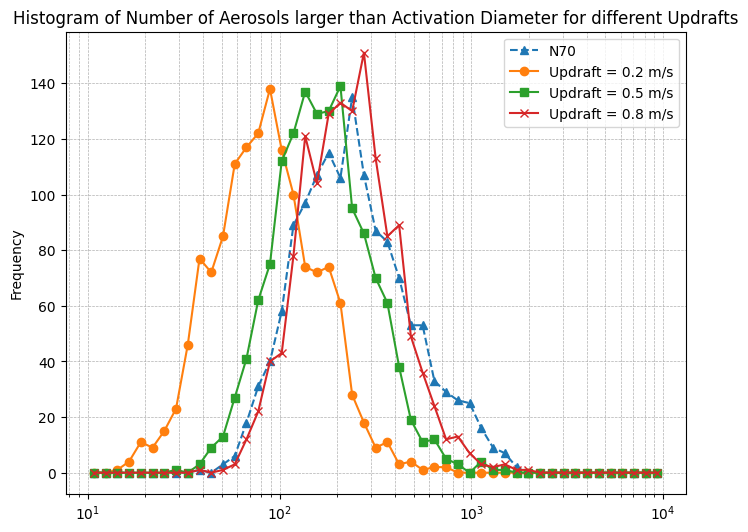

In [36]:
bins = np.logspace(minimum, maximum, 50)
hist_n70, bin_edges = np.histogram(NorESM_ds['TotN70'].isel(lev=-2).where(NorESM_ds['Droplets'].isel(lev=-2) > 0),bins=bins)
hist_Activated1, bin_edges = np.histogram(NorESM_ds['ActivatedNumberUpdraft1'].isel(lev=-2).where(NorESM_ds['Droplets'].isel(lev=-2) > 0),bins=bins)
hist_Activated2, bin_edges = np.histogram(NorESM_ds['ActivatedNumberUpdraft2'].isel(lev=-2).where(NorESM_ds['Droplets'].isel(lev=-2) > 0),bins=bins)
hist_Activated3, bin_edges = np.histogram(NorESM_ds['ActivatedNumberUpdraft3'].isel(lev=-2).where(NorESM_ds['Droplets'].isel(lev=-2) > 0),bins=bins)

bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, hist_n70, marker='^', linestyle='--', label='N70')
plt.plot(bin_centers, hist_Activated1, marker='o', linestyle='-', label='Updraft = 0.2 m/s')
plt.plot(bin_centers, hist_Activated2, marker='s', linestyle='-', label='Updraft = 0.5 m/s')
plt.plot(bin_centers, hist_Activated3, marker='x', linestyle='-', label='Updraft = 0.8 m/s')

plt.xscale('log')
plt.ylabel('Frequency')
plt.title('Histogram of Number of Aerosols larger than Activation Diameter for different Updrafts')
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()

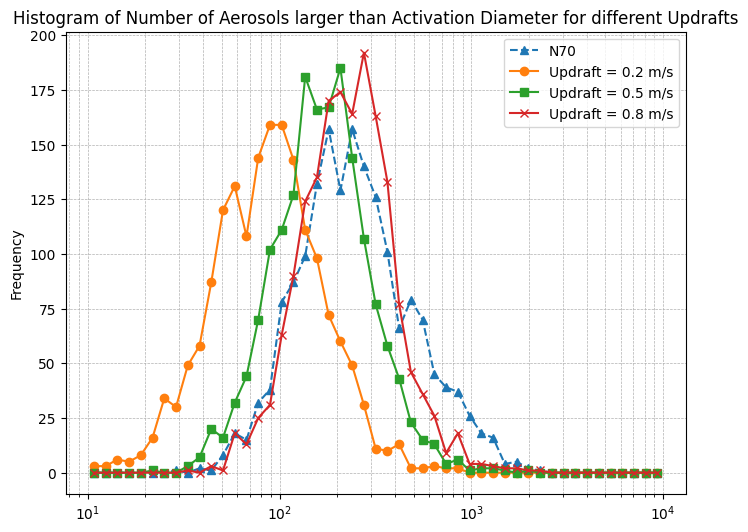

In [37]:
bins = np.logspace(minimum, maximum, 50)
hist_n70, bin_edges = np.histogram(NorESM_ds['TotN70'].isel(lev=-3).where(NorESM_ds['Droplets'].isel(lev=-3) > 0),bins=bins)
hist_Activated1, bin_edges = np.histogram(NorESM_ds['ActivatedNumberUpdraft1'].isel(lev=-3).where(NorESM_ds['Droplets'].isel(lev=-3) > 0),bins=bins)
hist_Activated2, bin_edges = np.histogram(NorESM_ds['ActivatedNumberUpdraft2'].isel(lev=-3).where(NorESM_ds['Droplets'].isel(lev=-3) > 0),bins=bins)
hist_Activated3, bin_edges = np.histogram(NorESM_ds['ActivatedNumberUpdraft3'].isel(lev=-3).where(NorESM_ds['Droplets'].isel(lev=-3) > 0),bins=bins)

bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, hist_n70, marker='^', linestyle='--', label='N70')
plt.plot(bin_centers, hist_Activated1, marker='o', linestyle='-', label='Updraft = 0.2 m/s')
plt.plot(bin_centers, hist_Activated2, marker='s', linestyle='-', label='Updraft = 0.5 m/s')
plt.plot(bin_centers, hist_Activated3, marker='x', linestyle='-', label='Updraft = 0.8 m/s')

plt.xscale('log')
plt.ylabel('Frequency')
plt.title('Histogram of Number of Aerosols larger than Activation Diameter for different Updrafts')
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()

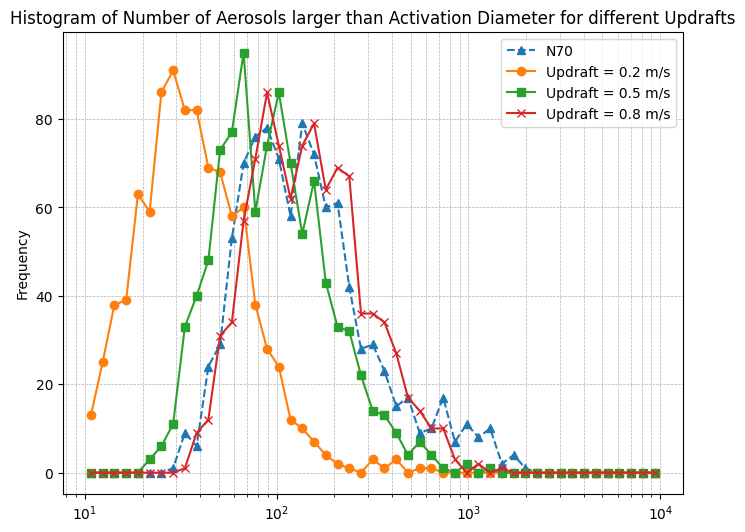

In [38]:
bins = np.logspace(minimum, maximum, 50)
hist_n70, bin_edges = np.histogram(NorESM_ds['TotN70'].isel(lev=-1).where(NorESM_ds['Droplets'].isel(lev=-1) > 0),bins=bins)
hist_Activated1, bin_edges = np.histogram(NorESM_ds['ActivatedNumberUpdraft1'].isel(lev=-1).where(NorESM_ds['Droplets'].isel(lev=-1) > 0),bins=bins)
hist_Activated2, bin_edges = np.histogram(NorESM_ds['ActivatedNumberUpdraft2'].isel(lev=-1).where(NorESM_ds['Droplets'].isel(lev=-1) > 0),bins=bins)
hist_Activated3, bin_edges = np.histogram(NorESM_ds['ActivatedNumberUpdraft3'].isel(lev=-1).where(NorESM_ds['Droplets'].isel(lev=-1) > 0),bins=bins)

bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, hist_n70, marker='^', linestyle='--', label='N70')
plt.plot(bin_centers, hist_Activated1, marker='o', linestyle='-', label='Updraft = 0.2 m/s')
plt.plot(bin_centers, hist_Activated2, marker='s', linestyle='-', label='Updraft = 0.5 m/s')
plt.plot(bin_centers, hist_Activated3, marker='x', linestyle='-', label='Updraft = 0.8 m/s')

plt.xscale('log')
plt.ylabel('Frequency')
plt.title('Histogram of Number of Aerosols larger than Activation Diameter for different Updrafts')
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()

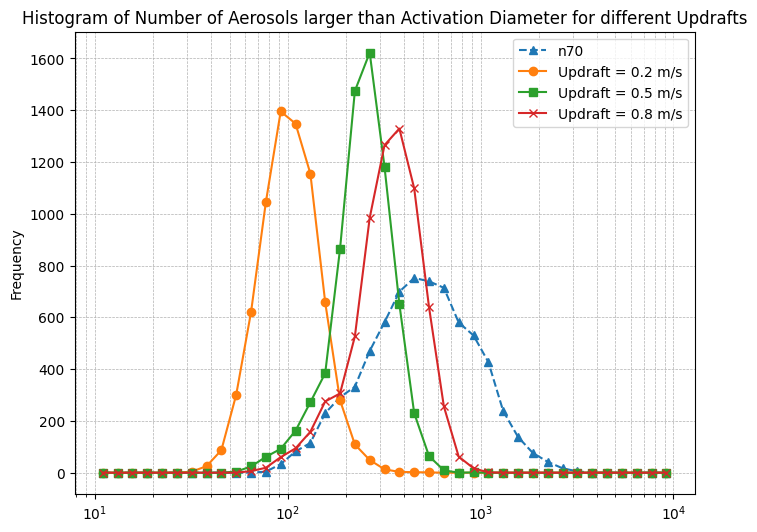

In [39]:
bins = np.logspace(minimum, maximum, 40)
hist_n70, bin_edges = np.histogram(ECearth_ds['TotN70'].isel(lev=0).where(ECearth_ds['Droplets'].isel(lev=0)> 0)/1E6,bins=bins)

hist_Activated1, bin_edges = np.histogram(ECearth_ds['ActivatedNumberUpdraft1'].isel(lev=0).where(ECearth_ds['Droplets'].isel(lev=0) > 0)/1E6,bins=bins)
hist_Activated2, bin_edges = np.histogram(ECearth_ds['ActivatedNumberUpdraft2'].isel(lev=0).where(ECearth_ds['Droplets'].isel(lev=0) > 0)/1E6,bins=bins)
hist_Activated3, bin_edges = np.histogram(ECearth_ds['ActivatedNumberUpdraft3'].isel(lev=0).where(ECearth_ds['Droplets'].isel(lev=0) > 0)/1E6,bins=bins)

bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, hist_n70, marker='^', linestyle='--', label='n70')
plt.plot(bin_centers, hist_Activated1, marker='o', linestyle='-', label='Updraft = 0.2 m/s')
plt.plot(bin_centers, hist_Activated2, marker='s', linestyle='-', label='Updraft = 0.5 m/s')
plt.plot(bin_centers, hist_Activated3, marker='x', linestyle='-', label='Updraft = 0.8 m/s')

plt.xscale('log')
plt.ylabel('Frequency')
plt.title('Histogram of Number of Aerosols larger than Activation Diameter for different Updrafts')
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()

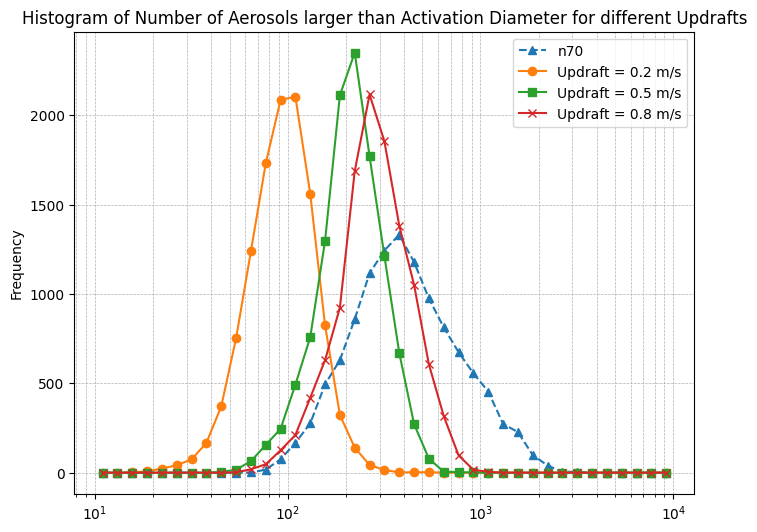

In [40]:
bins = np.logspace(minimum, maximum, 40)
hist_n70, bin_edges = np.histogram(ECearth_ds['TotN70'].isel(lev=1).where(ECearth_ds['Droplets'].isel(lev=1)> 0)/1E6,bins=bins)

hist_Activated1, bin_edges = np.histogram(ECearth_ds['ActivatedNumberUpdraft1'].isel(lev=1).where(ECearth_ds['Droplets'].isel(lev=1) > 0)/1E6,bins=bins)
hist_Activated2, bin_edges = np.histogram(ECearth_ds['ActivatedNumberUpdraft2'].isel(lev=1).where(ECearth_ds['Droplets'].isel(lev=1) > 0)/1E6,bins=bins)
hist_Activated3, bin_edges = np.histogram(ECearth_ds['ActivatedNumberUpdraft3'].isel(lev=1).where(ECearth_ds['Droplets'].isel(lev=1) > 0)/1E6,bins=bins)

bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, hist_n70, marker='^', linestyle='--', label='n70')
plt.plot(bin_centers, hist_Activated1, marker='o', linestyle='-', label='Updraft = 0.2 m/s')
plt.plot(bin_centers, hist_Activated2, marker='s', linestyle='-', label='Updraft = 0.5 m/s')
plt.plot(bin_centers, hist_Activated3, marker='x', linestyle='-', label='Updraft = 0.8 m/s')

plt.xscale('log')
plt.ylabel('Frequency')
plt.title('Histogram of Number of Aerosols larger than Activation Diameter for different Updrafts')
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()

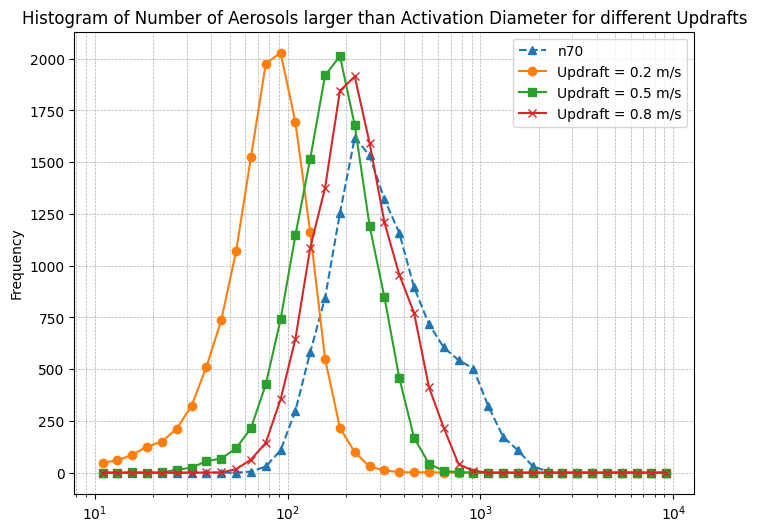

In [41]:
bins = np.logspace(minimum, maximum, 40)
hist_n70, bin_edges = np.histogram(ECearth_ds['TotN70'].isel(lev=2).where(ECearth_ds['Droplets'].isel(lev=2)> 0)/1E6,bins=bins)

hist_Activated1, bin_edges = np.histogram(ECearth_ds['ActivatedNumberUpdraft1'].isel(lev=2).where(ECearth_ds['Droplets'].isel(lev=2) > 0)/1E6,bins=bins)
hist_Activated2, bin_edges = np.histogram(ECearth_ds['ActivatedNumberUpdraft2'].isel(lev=2).where(ECearth_ds['Droplets'].isel(lev=2) > 0)/1E6,bins=bins)
hist_Activated3, bin_edges = np.histogram(ECearth_ds['ActivatedNumberUpdraft3'].isel(lev=2).where(ECearth_ds['Droplets'].isel(lev=2) > 0)/1E6,bins=bins)

bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, hist_n70, marker='^', linestyle='--', label='n70')
plt.plot(bin_centers, hist_Activated1, marker='o', linestyle='-', label='Updraft = 0.2 m/s')
plt.plot(bin_centers, hist_Activated2, marker='s', linestyle='-', label='Updraft = 0.5 m/s')
plt.plot(bin_centers, hist_Activated3, marker='x', linestyle='-', label='Updraft = 0.8 m/s')

plt.xscale('log')
plt.ylabel('Frequency')
plt.title('Histogram of Number of Aerosols larger than Activation Diameter for different Updrafts')
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()

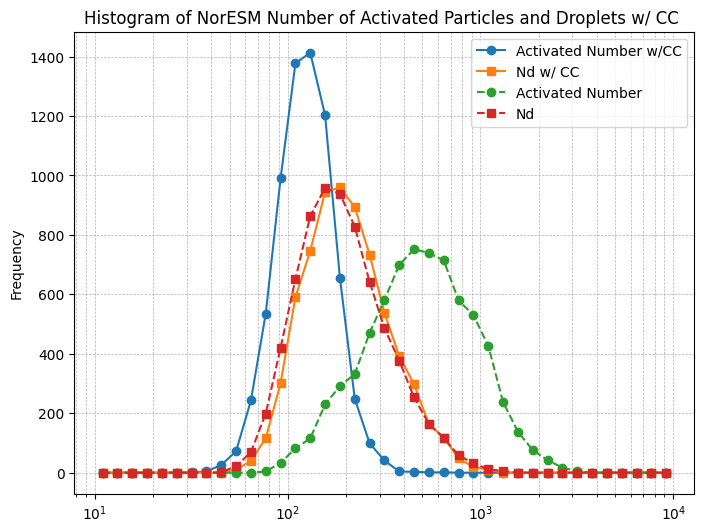

In [42]:
bins = np.logspace(minimum, maximum, 40)
hist_Act, bin_edges = np.histogram(ECearth_ds['ActivatedNumberUpdraft1CC'].isel(lev=0).where(ECearth_ds['DropletsCCUp1'].isel(lev=0) > 0)/1E6,bins=bins)
hist_DropletsCC, _ = np.histogram( ECearth_ds['DropletsCCUp1'].isel(lev=0), bins=bins)
hist_TotN70, bin_edges = np.histogram(ECearth_ds['TotN70'].isel(lev=0).where(ECearth_ds['Droplets'].isel(lev=0) > 0)/1E6,bins=bins)
hist_Droplets, _ = np.histogram( ECearth_ds['Droplets'].isel(lev=0), bins=bins)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, hist_Act, marker='o', linestyle='-', label='Activated Number w/CC')
plt.plot(bin_centers, hist_DropletsCC, marker='s', linestyle='-', label='Nd w/ CC')
plt.plot(bin_centers, hist_TotN70, marker='o', linestyle='--', label='Activated Number')
plt.plot(bin_centers, hist_Droplets, marker='s', linestyle='--', label='Nd')
plt.xscale('log')
plt.ylabel('Frequency')
plt.title('Histogram of NorESM Number of Activated Particles and Droplets w/ CC ')
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()

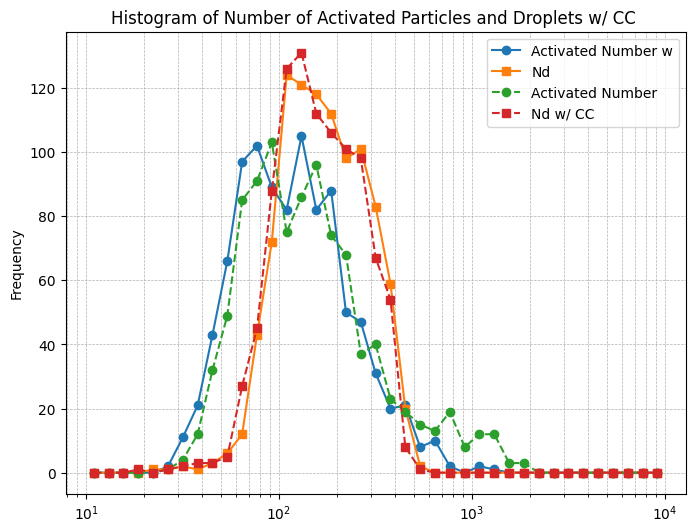

In [43]:
bins = np.logspace(minimum, maximum, 40)
hist_Act, bin_edges = np.histogram(NorESM_ds['ActivatedNumberUpdraft2CC'].isel(lev=-1).where(NorESM_ds['DropletsCCUp2'].isel(lev=-1) > 0),bins=bins)
hist_DropletsCC, _ = np.histogram( NorESM_ds['DropletsCCUp2'].isel(lev=-1), bins=bins)
hist_TotN70, bin_edges = np.histogram(NorESM_ds['TotN70'].isel(lev=-1).where(NorESM_ds['Droplets'].isel(lev=-1) > 0),bins=bins)
hist_Droplets, _ = np.histogram( NorESM_ds['Droplets'].isel(lev=-1), bins=bins)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, hist_Act, marker='o', linestyle='-', label='Activated Number w')
plt.plot(bin_centers, hist_DropletsCC, marker='s', linestyle='-', label='Nd')
plt.plot(bin_centers, hist_TotN70, marker='o', linestyle='--', label='Activated Number')
plt.plot(bin_centers, hist_Droplets, marker='s', linestyle='--', label='Nd w/ CC')
plt.xscale('log')
plt.ylabel('Frequency')
plt.title('Histogram of Number of Activated Particles and Droplets w/ CC ')
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()

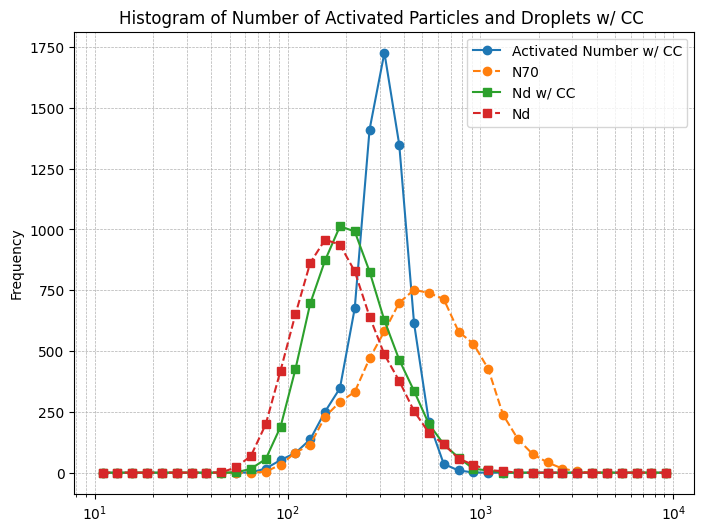

In [44]:
bins = np.logspace(minimum, maximum, 40)
hist_Act, bin_edges = np.histogram(ECearth_ds['ActivatedNumberUpdraft2CC'].isel(lev=0).where(ECearth_ds['DropletsCCUp2'].isel(lev=0) > 0)/1E6,bins=bins)
hist_DropletsCC, _ = np.histogram( ECearth_ds['DropletsCCUp2'].isel(lev=0), bins=bins)
hist_TotN70, bin_edges = np.histogram(ECearth_ds['TotN70'].isel(lev=0).where(ECearth_ds['Droplets'].isel(lev=0) > 0)/1E6,bins=bins)
hist_Droplets, _ = np.histogram( ECearth_ds['Droplets'].isel(lev=0), bins=bins)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, hist_Act, marker='o', linestyle='-', label='Activated Number w/ CC')
plt.plot(bin_centers, hist_TotN70, marker='o', linestyle='--', label='N70')
plt.plot(bin_centers, hist_DropletsCC, marker='s', linestyle='-', label='Nd w/ CC')
plt.plot(bin_centers, hist_Droplets, marker='s', linestyle='--', label='Nd')
plt.xscale('log')
plt.ylabel('Frequency')
plt.title('Histogram of Number of Activated Particles and Droplets w/ CC ')
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()

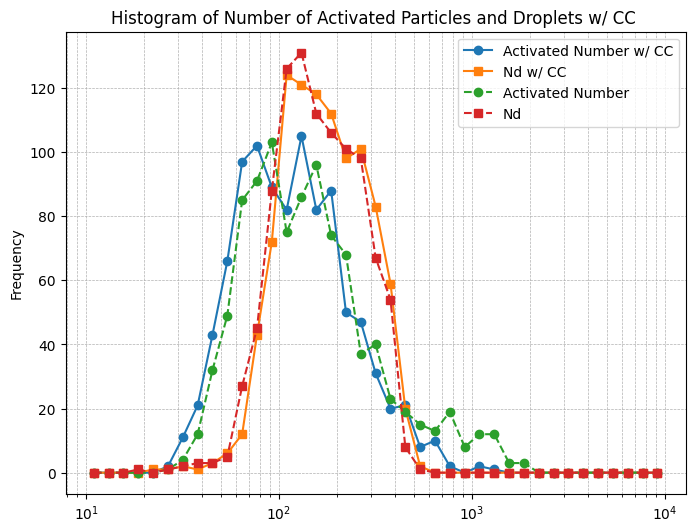

In [45]:
bins = np.logspace(minimum, maximum, 40)
hist_Act, bin_edges = np.histogram(NorESM_ds['ActivatedNumberUpdraft2CC'].isel(lev=-1).where(NorESM_ds['DropletsCCUp2'].isel(lev=-1) > 0),bins=bins)
hist_DropletsCC, _ = np.histogram( NorESM_ds['DropletsCCUp2'].isel(lev=-1), bins=bins)
hist_TotN70, bin_edges = np.histogram(NorESM_ds['TotN70'].isel(lev=-1).where(NorESM_ds['Droplets'].isel(lev=-1) > 0),bins=bins)
hist_Droplets, _ = np.histogram( NorESM_ds['Droplets'].isel(lev=-1), bins=bins)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, hist_Act, marker='o', linestyle='-', label='Activated Number w/ CC')
plt.plot(bin_centers, hist_DropletsCC, marker='s', linestyle='-', label='Nd w/ CC')
plt.plot(bin_centers, hist_TotN70, marker='o', linestyle='--', label='Activated Number')
plt.plot(bin_centers, hist_Droplets, marker='s', linestyle='--', label='Nd')
plt.xscale('log')
plt.ylabel('Frequency')
plt.title('Histogram of Number of Activated Particles and Droplets w/ CC ')
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()

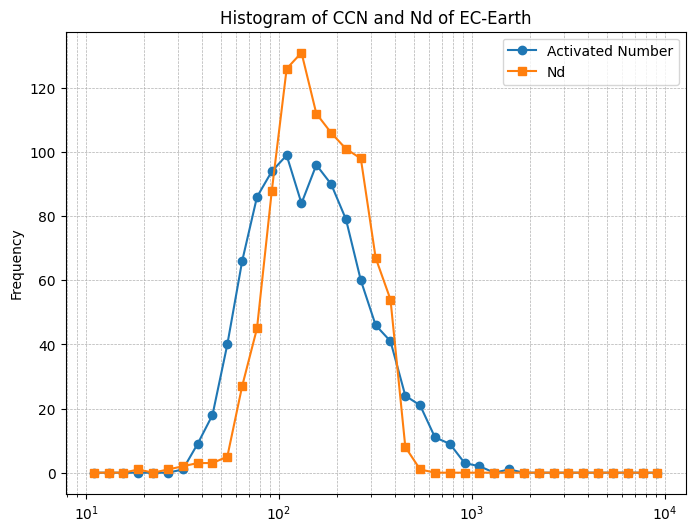

In [46]:
bins = np.logspace(minimum, maximum, 40)
hist_TotN70, bin_edges = np.histogram(NorESM_ds['ActivatedNumberUpdraft3'].isel(lev=-1).where(NorESM_ds['Droplets'].isel(lev=-1) > 0),bins=bins)
hist_Droplets, _ = np.histogram( NorESM_ds['Droplets'].isel(lev=-1), bins=bins)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, hist_TotN70, marker='o', linestyle='-', label='Activated Number')
plt.plot(bin_centers, hist_Droplets, marker='s', linestyle='-', label='Nd')
plt.xscale('log')
plt.ylabel('Frequency')
plt.title('Histogram of CCN and Nd of EC-Earth')
plt.legend()
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()

In [47]:
def TripleGraph(Cluster, level, GroupedData, CC = False, NorESM = True):

    fig, ax = plt.subplots(1, 3, figsize=(12, 4)) 
    for n in range (1,4):
        i = Cluster-1
        if NorESM == True:
            
            if CC == False:
                x = GroupedData[i][f'ActivatedNumberUpdraft{n}'].isel(lev = level).where(GroupedData[i]['Droplets'].isel(lev = level)>0).dropna('time')
                y = GroupedData[i]['Droplets'].isel(lev = level).dropna('time')
            else:
                x = GroupedData[i][f'ActivatedNumberUpdraft{n}CC'].isel(lev = level).where(GroupedData[i][f'DropletsCCUp{n}'].isel(lev = level)>0).dropna('time')
                y = GroupedData[i][f'DropletsCCUp{n}'].isel(lev = level).dropna('time')
        else:
            if CC == False:
                x = GroupedData[i][f'ActivatedNumberUpdraft{n}'].isel(lev = level).where(GroupedData[i]['Droplets'].isel(lev = level)>0).dropna('time')*1E-6
                y = GroupedData[i]['Droplets'].isel(lev = level).dropna('time')
            else:
                x = GroupedData[i][f'ActivatedNumberUpdraft{n}CC'].isel(lev = level).where(GroupedData[i][f'DropletsCCUp{n}'].isel(lev = level)>0).dropna('time')*1E-6
                y = GroupedData[i][f'DropletsCCUp{n}'].isel(lev = level).dropna('time')
        x = x.to_numpy()
        y = y.to_numpy()
        Y = np.log10(y)
        X = np.log10(x)
        X = sm.add_constant(X)
        model = sm.OLS(Y,X).fit()
        Sensitivity = SusceptibilityGraph(model)
        res = stats.linregress(np.log10(x),np.log10(y))
        lims = [1,10000]
        ax[n-1].hexbin(x,y,gridsize=50, bins= 'log', xscale='log', yscale='log',edgecolors = 'face', cmap ='inferno',extent = [0,4,0,4], mincnt = 1)
        plt.xlim(lims)
        plt.ylim(lims)
        ax[n-1].plot([1,10000],[10**res.intercept*1**res.slope,10**res.intercept*10000**res.slope])
        ax[n-1].plot(lims,lims)
        if CC == False:
            if NorESM == True:
                ax[n-1].set_title(f'NorESM Cluster {Cluster}, Updraft {n}, No CC')
            else:
                ax[n-1].set_title(f'EC-Earth Cluster {Cluster}, Updraft {n}, No CC')
        else:
            if NorESM == True:
                ax[n-1].set_title(f'NorESM Cluster {Cluster}, Updraft {n}, With CC')
            else:
                ax[n-1].set_title(f'EC-Earth Cluster {Cluster}, Updraft {n}, With CC')          
        if NorESM == True:
            ax[n-1].text(lims[1],lims[0], f'Level {abs(level)}',ha="right", va="bottom")
        else:
            ax[n-1].text(lims[1],lims[0],  f'Level {level+1}',ha="right", va="bottom")
        if NorESM == True and CC == False:
            ax[n-1].text(2,5000, f'Activation Diameter = {NorActR_df.iloc[n-1].values[i]:.2f} nm')
        if NorESM == True and CC == True:
            ax[n-1].text(2,5000, f'Activation Diameter = {NorActR_CC_df.iloc[n-1].values[i]:.2f} nm')
        if NorESM == False and CC == False:
            ax[n-1].text(2,5000, f'Activation Diameter = {ECActR_df.iloc[n-1].values[i]:.2f} nm')
        if NorESM == False and CC == True:   
            ax[n-1].text(2,5000, f'Activation Diameter = {ECActR_CC_df.iloc[n-1].values[i]:.2f} nm')
            
        ax[n-1].text(2,2500,f'Susceptibility = {Sensitivity[0]:.3f} +/- {Sensitivity[1]:.3f}')     
    plt.tight_layout()

In [48]:
for i in range(0,4):
    print(len(NorGroup[i]['Droplets'].isel(lev = -1).dropna('time'))/len(NorGroup[i]['T'].isel(lev = -1).dropna('time')))
print('BREAK')
for i in range(0,6):
    print(len(ECGroup[i]['Droplets'].isel(lev = 0).dropna('time'))/len(ECGroup[i]['T'].isel(lev = 0).dropna('time')))

0.006746626686656672
0.018532818532818532
0.0
0.20183686857642685
BREAK
0.08810353409656546
0.1327037773359841
0.09439853076216713
0.14633240482822654
0.12300531914893617
0.11750205423171733


In [49]:
row_names = ['Level 1', 'Level 2', 'Level 3']
Norweighted_dfnoCC = pd.DataFrame({
    'Updraft = 0.2, No CC': ListVarNor[0],
    'Updraft = 0.5, No CC': ListVarNor[1],
    'Updraft = 0.8, No CC': ListVarNor[2],
}, index=row_names)
Norweighted_dfnoCC

,"Updraft = 0.2, No CC","Updraft = 0.5, No CC","Updraft = 0.8, No CC"
Level 1,122.734681,84.014591,69.383945
Level 2,125.894885,86.500922,71.457066
Level 3,128.356366,88.488744,73.141389


In [50]:
row_names = ['Level 1', 'Level 2', 'Level 3']
Norweighted_dfCC = pd.DataFrame({
    'Updraft = 0.2, With CC': ListVarNor[3],
    'Updraft = 0.5, With CC': ListVarNor[4],
    'Updraft = 0.8, With CC': ListVarNor[5],
    }, index=row_names)
Norweighted_dfCC

,"Updraft = 0.2, With CC","Updraft = 0.5, With CC","Updraft = 0.8, With CC"
Level 1,117.822513,77.505951,62.660987
Level 2,121.049512,80.089339,64.768725
Level 3,123.555462,82.172351,66.494367


In [51]:
row_names = ['Level 1', 'Level 2', 'Level 3']
ECweighted_dfnoCC = pd.DataFrame({
    'Updraft = 0.2, No CC': ListVarEC[0],
    'Updraft = 0.5, No CC': ListVarEC[1],
    'Updraft = 0.8, No CC': ListVarEC[2],
}, index=row_names)
ECweighted_dfnoCC = ECweighted_dfnoCC.style.format("{:.2f}")
ECweighted_dfnoCC

,"Updraft = 0.2, No CC","Updraft = 0.5, No CC","Updraft = 0.8, No CC"
Level 1,209.29,134.34,105.61
Level 2,205.84,132.66,104.58
Level 3,205.52,132.30,104.29


In [52]:
row_names = ['Level 1', 'Level 2', 'Level 3']
ECweighted_dfCC = pd.DataFrame({
    'D* (nm), Updraft = 0.2 m/s': ListVarEC[3],
    'D* (nm), Updraft = 0.5 m/s': ListVarEC[4],
    'D* (nm), Updraft = 0.8 m/s': ListVarEC[5],
}, index=row_names)
ECweighted_dfCC = ECweighted_dfCC.style.format("{:.2f}")
ECweighted_dfCC

,"D* (nm), Updraft = 0.2 m/s","D* (nm), Updraft = 0.5 m/s","D* (nm), Updraft = 0.8 m/s"
Level 1,187.26,113.48,82.50
Level 2,180.26,111.43,81.33
Level 3,181.92,111.32,81.27


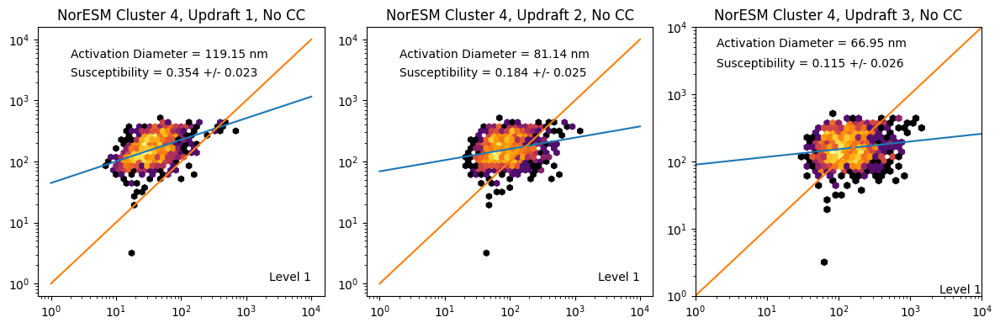

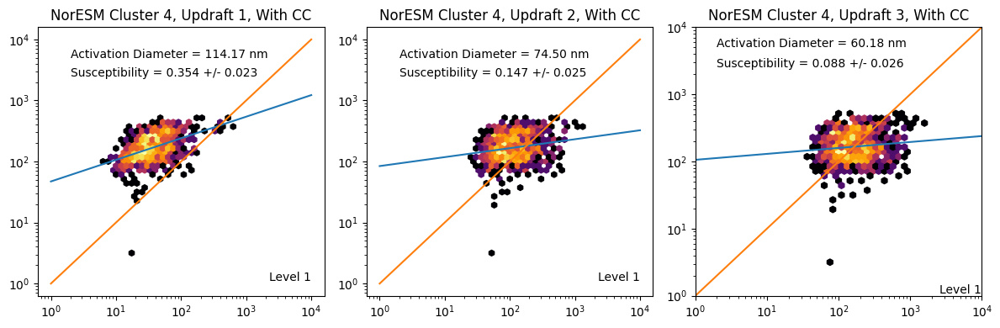

In [53]:
TripleGraph(Cluster = 4, level = -1, GroupedData = NorGroup, CC = False, NorESM = True)
TripleGraph(Cluster = 4, level = -1, GroupedData = NorGroup, CC = True, NorESM = True)


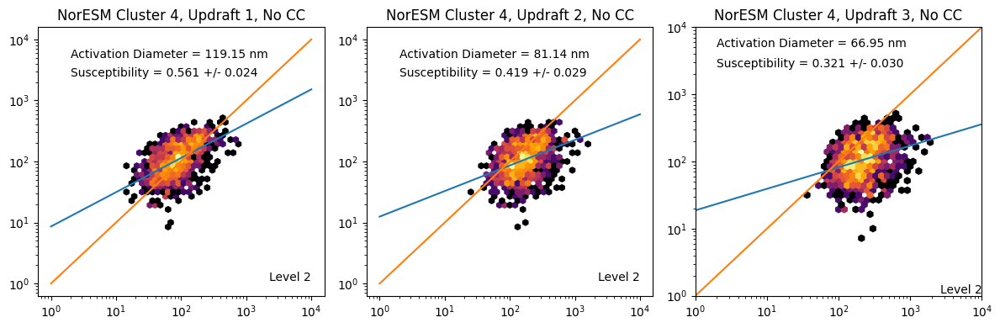

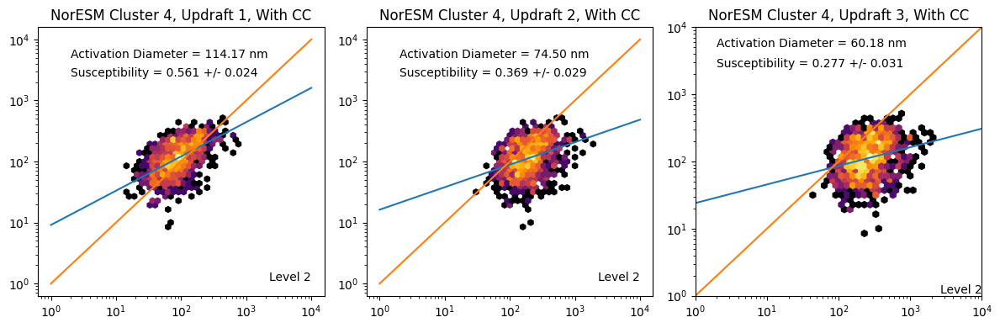

In [54]:
TripleGraph(Cluster = 4, level = -2, GroupedData = NorGroup, CC = False, NorESM = True)
TripleGraph(Cluster = 4, level = -2, GroupedData = NorGroup, CC = True, NorESM = True)


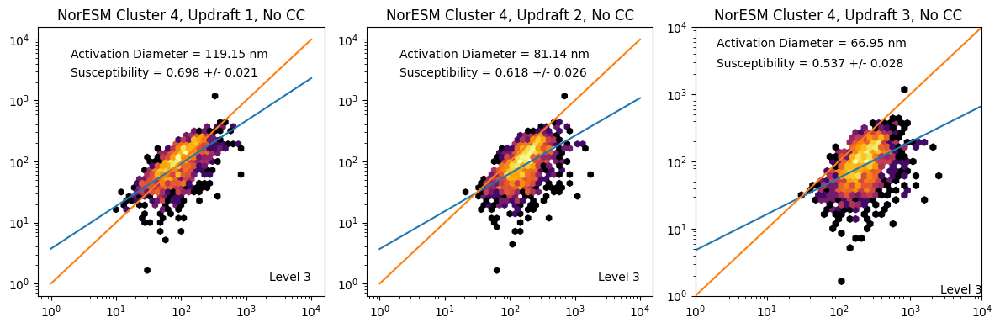

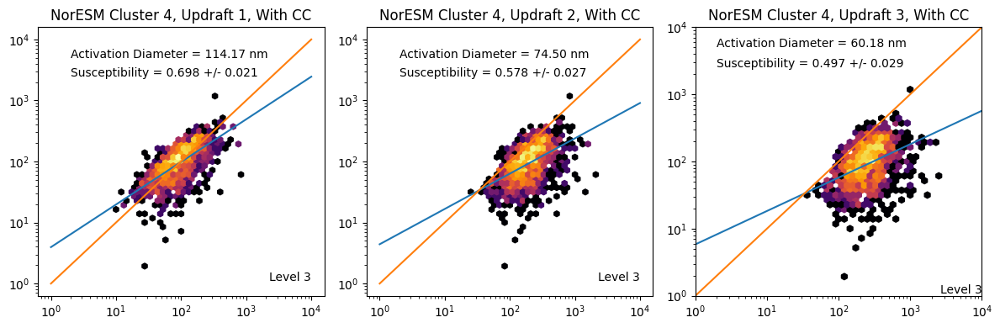

In [56]:
TripleGraph(Cluster = 4, level = -3, GroupedData = NorGroup, CC = False, NorESM = True)
TripleGraph(Cluster = 4, level = -3, GroupedData = NorGroup, CC = True, NorESM = True)


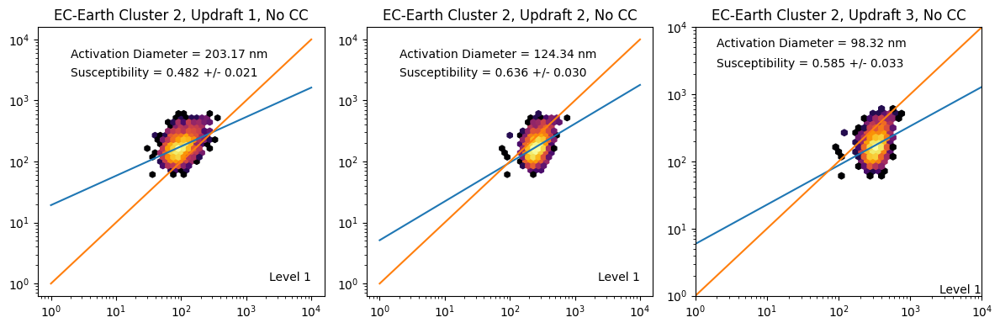

In [57]:
TripleGraph(Cluster = 2, level = 0, GroupedData = ECGroup, CC = False, NorESM = False)


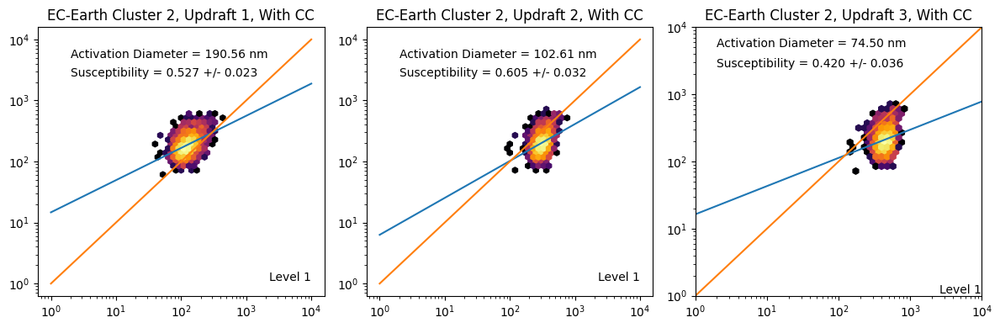

In [58]:
TripleGraph(Cluster = 2, level = 0, GroupedData = ECGroup, CC = True, NorESM = False)

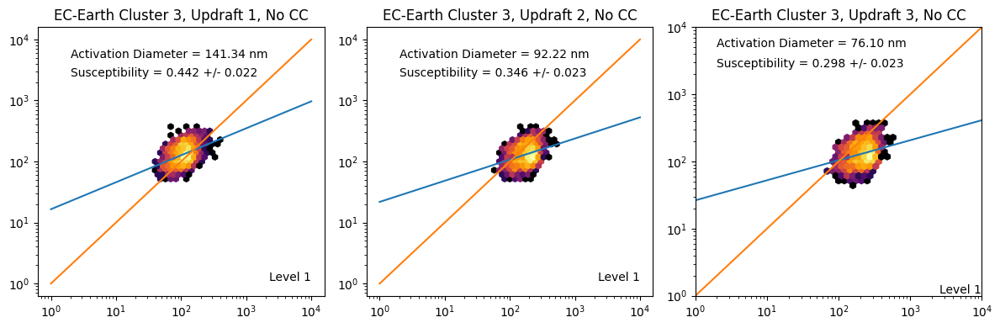

In [59]:
TripleGraph(Cluster = 3, level = 0, GroupedData = ECGroup, CC = False, NorESM = False)

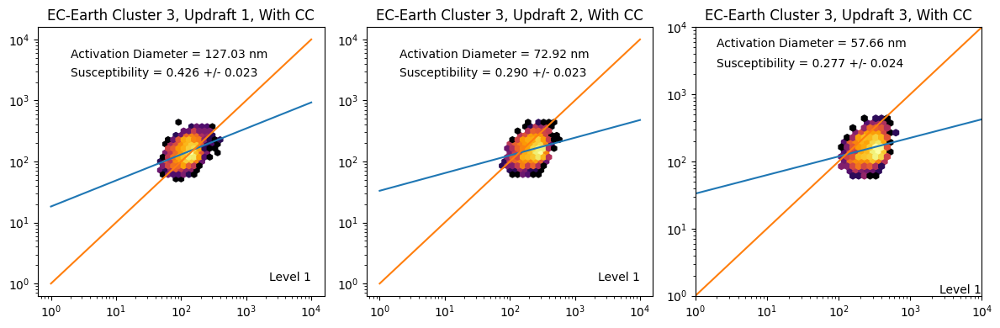

In [60]:
TripleGraph(Cluster = 3, level = 0, GroupedData = ECGroup, CC = True, NorESM = False)

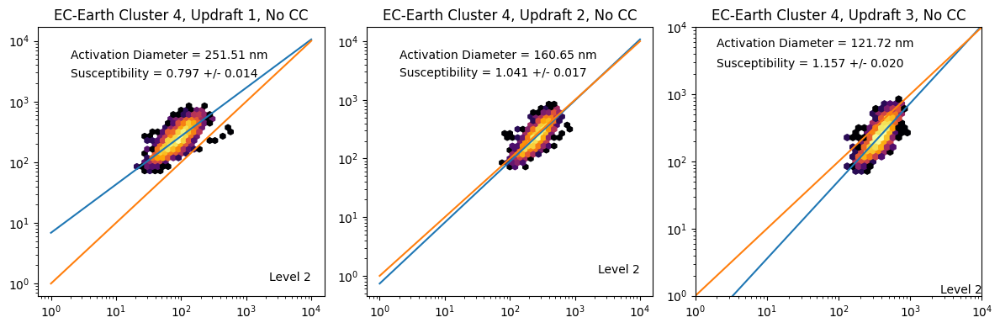

In [61]:
TripleGraph(Cluster = 4, level = 1, GroupedData = ECGroup, CC = False, NorESM = False)

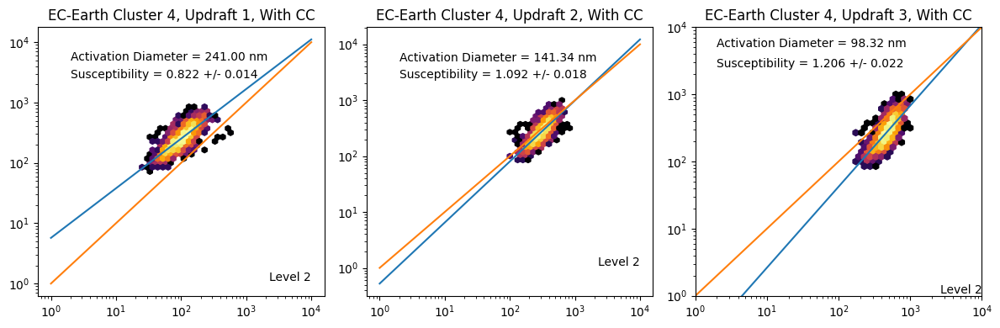

In [62]:
TripleGraph(Cluster = 4, level = 1, GroupedData = ECGroup, CC = True, NorESM = False)

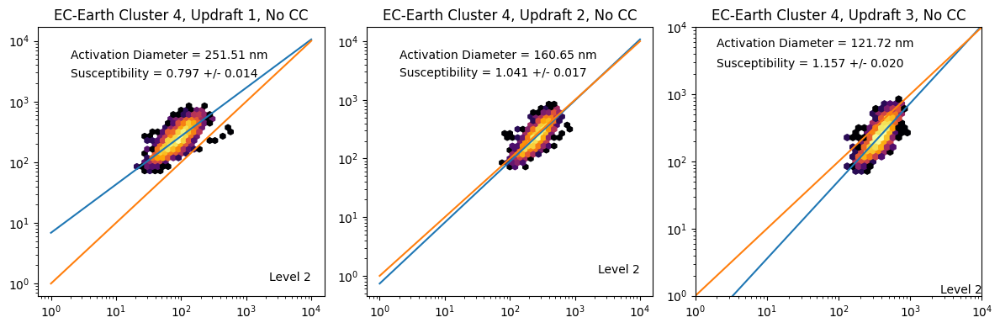

In [63]:
TripleGraph(Cluster = 4, level = 1, GroupedData = ECGroup, CC = False, NorESM = False)

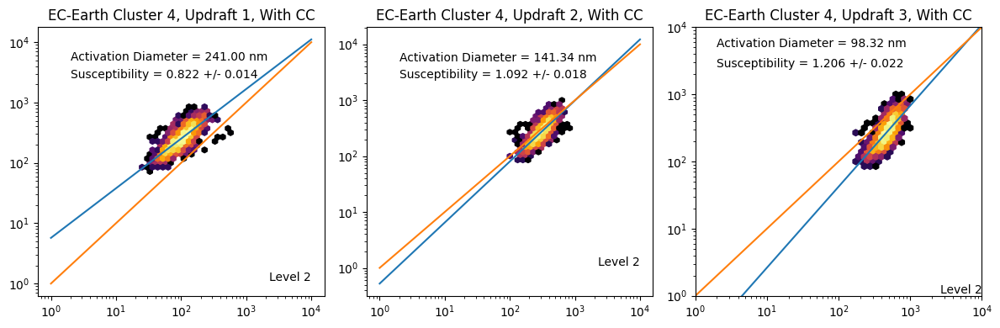

In [64]:
TripleGraph(Cluster = 4, level = 1, GroupedData = ECGroup, CC = True, NorESM = False)

In [65]:
ECCDNC_ds['Percentage_Increase'].values

array([        nan,  7.        ,  9.66183575,  5.83756345, 12.5       ,
       11.61616162, 24.87205732, 15.61181435, 21.45214521, 13.4375    ,
       10.05025126, 38.03278689, 33.66418528, 20.03546099, 20.50561798,
       15.53884712, 14.1       , 35.78947368])

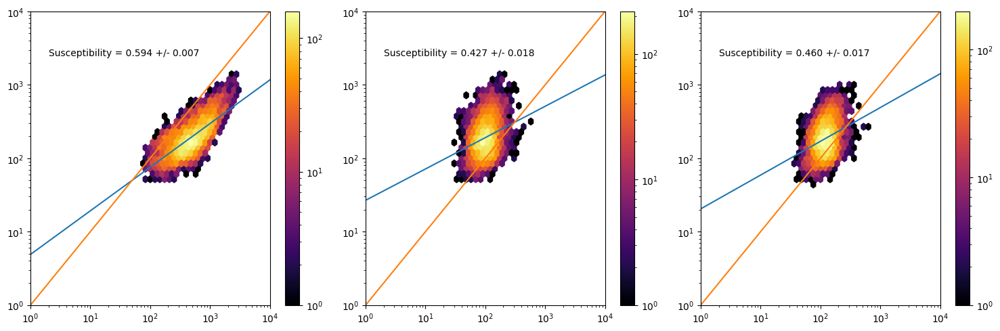

In [66]:
plt.figure(figsize = (15,5))
x = ECearth_ds['TotN70'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev =0)>0).dropna('time')/10**6
y = ECearth_ds['Droplets'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev =0)>0).dropna('time')
plt.subplot(1,3,1)
SBaseLev1 = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {SBaseLev1[0]:.3f} +/- {SBaseLev1[1]:.3f}')     
NdtoCCNGraph(x,y)
x =ECearth_ds['ActivatedNumberUpdraft1'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev =0)>0).dropna('time')/10**6
y = ECearth_ds['Droplets'].isel(lev = 0).where((ECearth_ds['Droplets'].isel(lev =0)>0) & (ECearth_ds['ActivatedNumberUpdraft1'].isel(lev = 0)>0)).dropna('time')
plt.subplot(1,3,2)
ActivatedSensitivity = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {ActivatedSensitivity[0]:.3f} +/- {ActivatedSensitivity[1]:.3f}')    
NdtoCCNGraph(x,y)
x = ECearth_ds['ActivatedNumberUpdraft1CC'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev =0)>0).dropna('time')/10**6
y = ECearth_ds['Droplets'].isel(lev = 0).where((ECearth_ds['Droplets'].isel(lev =0)>0) & (ECearth_ds['ActivatedNumberUpdraft1CC'].isel(lev = 0)>0)).dropna('time')
plt.subplot(1,3,3)
ActivatedSensitivityCC = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {ActivatedSensitivityCC[0]:.3f} +/- {ActivatedSensitivityCC[1]:.3f}')    

NdtoCCNGraph(x,y)
plt.tight_layout()

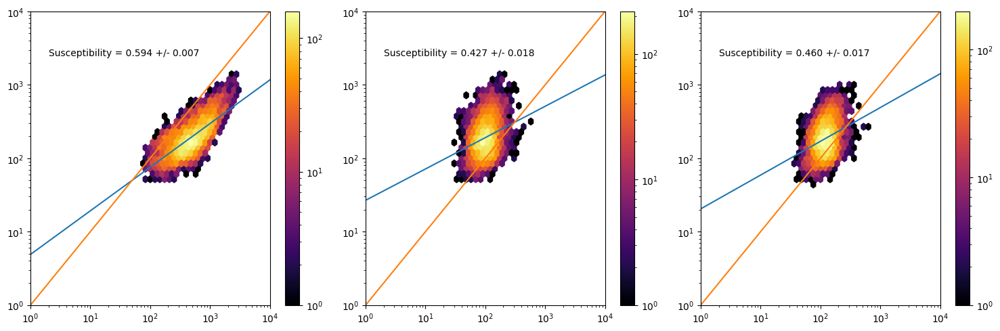

In [67]:
plt.figure(figsize = (15,5))
x = ECearth_ds['TotN70'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev =0)>0).dropna('time')/10**6
y = ECearth_ds['Droplets'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev =0)>0).dropna('time')
plt.subplot(1,3,1)
SBaseLev1 = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {SBaseLev1[0]:.3f} +/- {SBaseLev1[1]:.3f}')     
NdtoCCNGraph(x,y)
x =ECearth_ds['ActivatedNumberUpdraft1'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev =0)>0).dropna('time')/10**6
y = ECearth_ds['Droplets'].isel(lev = 0).where((ECearth_ds['Droplets'].isel(lev =0)>0) & (ECearth_ds['ActivatedNumberUpdraft1'].isel(lev = 0)>0)).dropna('time')
plt.subplot(1,3,2)
ActivatedSensitivity = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {ActivatedSensitivity[0]:.3f} +/- {ActivatedSensitivity[1]:.3f}')    
NdtoCCNGraph(x,y)
x = ECearth_ds['ActivatedNumberUpdraft1CC'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev =0)>0).dropna('time')/10**6
y = ECearth_ds['Droplets'].isel(lev = 0).where((ECearth_ds['Droplets'].isel(lev =0)>0) & (ECearth_ds['ActivatedNumberUpdraft1CC'].isel(lev = 0)>0)).dropna('time')
plt.subplot(1,3,3)
ActivatedSensitivityCC = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {ActivatedSensitivityCC[0]:.3f} +/- {ActivatedSensitivityCC[1]:.3f}')    

NdtoCCNGraph(x,y)
plt.tight_layout()

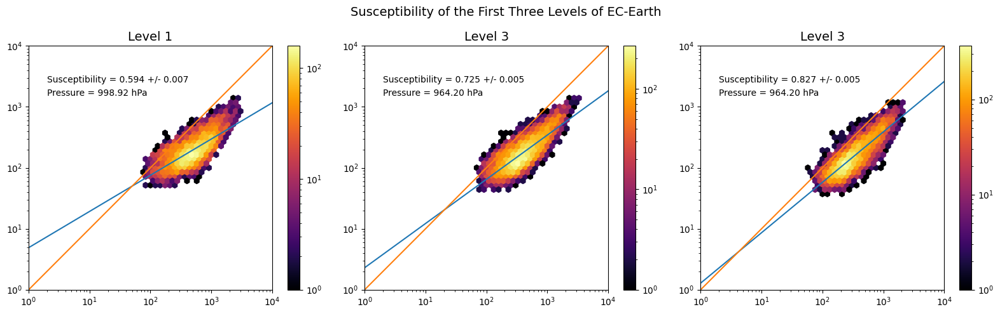

In [68]:
plt.figure(figsize = (16,5))
x = ECearth_ds['TotN70'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev =0)>0).dropna('time')/10**6
y = ECearth_ds['Droplets'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev =0)>0).dropna('time')
plt.subplot(1,3,1)
Sus = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {Sus[0]:.3f} +/- {Sus[1]:.3f}')    
plt.text(2,1500,f'Pressure = {ECearth_ds['lev'][0].values:.2f} hPa',fontsize = 10)
plt.title('Level 1', fontsize = 14)
NdtoCCNGraph(x,y)
x = ECearth_ds['TotN70'].isel(lev =1).where(ECearth_ds['Droplets'].isel(lev =1)>0).dropna('time')/10**6
y = ECearth_ds['Droplets'].isel(lev =1).where(ECearth_ds['Droplets'].isel(lev =1)>0).dropna('time')
plt.subplot(1,3,2)
Sus = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {Sus[0]:.3f} +/- {Sus[1]:.3f}')    
plt.text(2,1500,f'Pressure = {ECearth_ds['lev'][2].values:.2f} hPa',fontsize = 10)
plt.title('Level 3', fontsize = 14)
NdtoCCNGraph(x,y)
x = ECearth_ds['TotN70'].isel(lev = 2).where(ECearth_ds['Droplets'].isel(lev =2)>0).dropna('time')/10**6
y = ECearth_ds['Droplets'].isel(lev = 2).where(ECearth_ds['Droplets'].isel(lev =2)>0).dropna('time')
plt.subplot(1,3,3)
Sus = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {Sus[0]:.3f} +/- {Sus[1]:.3f}')    
plt.text(2,1500,f'Pressure = {ECearth_ds['lev'][2].values:.2f} hPa',fontsize = 10)
plt.title('Level 3', fontsize = 14)
plt.suptitle('Susceptibility of the First Three Levels of EC-Earth', fontsize = 14)
NdtoCCNGraph(x,y)
plt.tight_layout()

In [69]:
plt.figure(figsize = (15,4))
x = ECearth_ds['TotN70'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev =0)>0).dropna('time')/10**6
y = ECearth_ds['Droplets'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev =0)>0).dropna('time')
plt.subplot(1,3,1)
Sus = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {Sus[0]:.3f} +/- {Sus[1]:.3f}')     
NdtoCCNGraph(x,y)
x = ECearth_ds['TotN70'].isel(lev = 1).where(ECearth_ds['Droplets'].isel(lev =1)>0).dropna('time')/10**6
y = ECearth_ds['Droplets'].isel(lev = 1).where(ECearth_ds['Droplets'].isel(lev =1)>0).dropna('time')
plt.subplot(1,3,2)
Sus = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {Sus[0]:.3f} +/- {Sus[1]:.3f}')    
NdtoCCNGraph(x,y)
x = ECearth_ds['TotN70'].isel(lev = 2).where(ECearth_ds['Droplets'].isel(lev =2)>0).dropna('time')/10**6
y = ECearth_ds['Droplets'].isel(lev = 2).where(ECearth_ds['Droplets'].isel(lev =2)>0).dropna('time')
plt.subplot(1,3,3)
Sus = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {Sus[0]:.3f} +/- {Sus[1]:.3f}') 


Text(2, 2500, 'Susceptibility = 0.827 +/- 0.005')

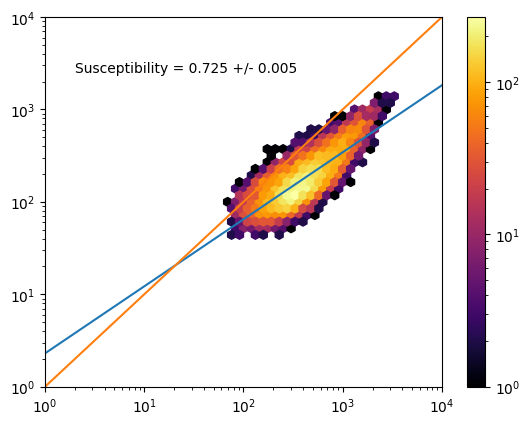

In [70]:
x = ECearth_ds['TotN70'].isel(lev = 1).where(ECearth_ds['Droplets'].isel(lev =1)>0).dropna('time')/10**6
y = ECearth_ds['Droplets'].isel(lev = 1).where(ECearth_ds['Droplets'].isel(lev =1)>0).dropna('time')
Sus = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {Sus[0]:.3f} +/- {Sus[1]:.3f}')    
NdtoCCNGraph(x,y)

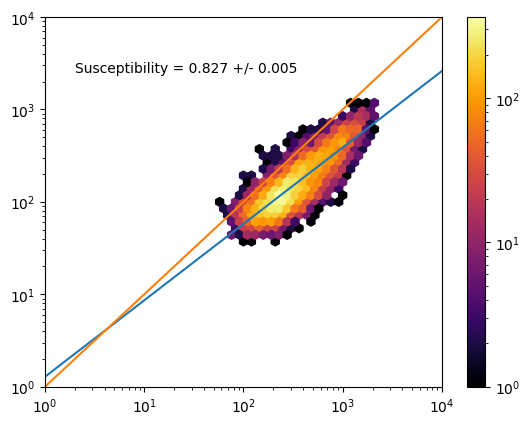

In [71]:
x = ECearth_ds['TotN70'].isel(lev = 2).where(ECearth_ds['Droplets'].isel(lev =2)>0).dropna('time')/10**6
y = ECearth_ds['Droplets'].isel(lev = 2).where(ECearth_ds['Droplets'].isel(lev =2)>0).dropna('time')
Sus = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {Sus[0]:.3f} +/- {Sus[1]:.3f}') 
NdtoCCNGraph(x,y)


Text(0.5, 0, 'CCN, $cm^{-3}$')

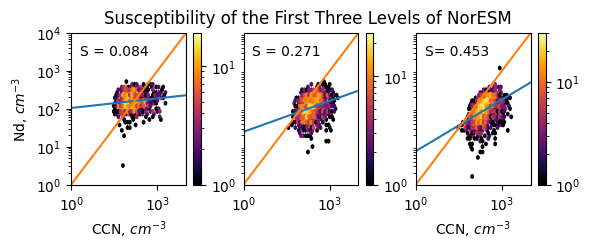

In [72]:
plt.figure(figsize = ( 6.30,1.97))
x = NorESM_ds['TotN70'].isel(lev = -1).where(NorESM_ds['Droplets'].isel(lev =-1)>0).dropna('time')
y = NorESM_ds['Droplets'].isel(lev = -1).where(NorESM_ds['Droplets'].isel(lev =-1)>0).dropna('time')
plt.subplot(1,3,1)
Sus = Susceptibility(x,y)
#plt.title(f'1st Level, {NorESM_ds['lev'][-1].values:.2f} hPa', fontsize = 11)
plt.text(2,2500,f'S = {Sus[0]:.3f}',fontsize = 10)     
NdtoCCNGraph(x,y)
plt.xlabel('CCN, $cm^{-3}$',fontsize = 10)
plt.ylabel('Nd, $cm^{-3}$',fontsize = 10)

x = NorESM_ds['TotN70'].isel(lev = -2).where(NorESM_ds['Droplets'].isel(lev =-2)>0).dropna('time')
y = NorESM_ds['Droplets'].isel(lev = -2).where(NorESM_ds['Droplets'].isel(lev =-2)>0).dropna('time')
plt.subplot(1,3,2)
Sus = Susceptibility(x,y)
plt.text(2,2500,f'S = {Sus[0]:.3f}',fontsize = 10)   
#plt.text(2,1500,f'Pressure = {NorESM_ds['lev'][-2].values:.2f} hPa',fontsize = 10)
#plt.title(f'2nd Level, {NorESM_ds['lev'][-2].values:.2f} hPa', fontsize = 11)
NdtoCCNGraph(x,y)
plt.yticks([])
x = NorESM_ds['TotN70'].isel(lev = -3).where(NorESM_ds['Droplets'].isel(lev =-3)>0).dropna('time')
y = NorESM_ds['Droplets'].isel(lev = -3).where(NorESM_ds['Droplets'].isel(lev =-3)>0).dropna('time')
plt.subplot(1,3,3)
Sus = Susceptibility(x,y)
plt.xlabel('CCN, $cm^{-3}$',fontsize = 10)
plt.text(2,2500,f'S= {Sus[0]:.3f}',fontsize = 10) 
#plt.text(2,1500,f'Pressure = {NorESM_ds['lev'][-3].values:.2f} hPa',fontsize = 10)
#plt.title(f'3rd, Level,{NorESM_ds['lev'][-3].values:.2f} hPa', fontsize = 11, y = 1.1)
plt.suptitle('Susceptibility of the First Three Levels of NorESM', fontsize = 12, y = 1)
NdtoCCNGraph(x,y)
plt.yticks([])

plt.xlabel('CCN, $cm^{-3}$',fontsize = 10)

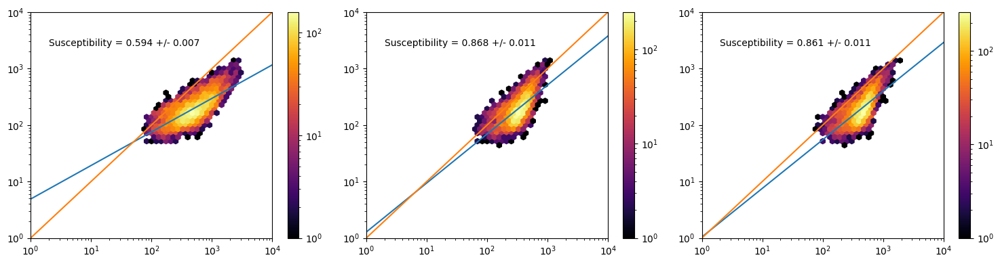

In [73]:
plt.figure(figsize = (15,4))
x = ECearth_ds['TotN70'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev =0)>0).dropna('time')/10**6
y = ECearth_ds['Droplets'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev =0)>0).dropna('time')
plt.subplot(1,3,1)
SBaseLev1 = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {SBaseLev1[0]:.3f} +/- {SBaseLev1[1]:.3f}')     
NdtoCCNGraph(x,y)
x =ECearth_ds['ActivatedNumberUpdraft3'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev =0)>0).dropna('time')/10**6
y = ECearth_ds['Droplets'].isel(lev = 0).where((ECearth_ds['Droplets'].isel(lev =0)>0) & (ECearth_ds['ActivatedNumberUpdraft3'].isel(lev = 0)>0)).dropna('time')
plt.subplot(1,3,2)
ActivatedSensitivity = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {ActivatedSensitivity[0]:.3f} +/- {ActivatedSensitivity[1]:.3f}')    
NdtoCCNGraph(x,y)
x = ECearth_ds['ActivatedNumberUpdraft3CC'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev =0)>0).dropna('time')/10**6
y = ECearth_ds['Droplets'].isel(lev = 0).where((ECearth_ds['Droplets'].isel(lev =0)>0) & (ECearth_ds['ActivatedNumberUpdraft3CC'].isel(lev = 0)>0)).dropna('time')
plt.subplot(1,3,3)
ActivatedSensitivityCC = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {ActivatedSensitivityCC[0]:.3f} +/- {ActivatedSensitivityCC[1]:.3f}')    

NdtoCCNGraph(x,y)
plt.tight_layout()

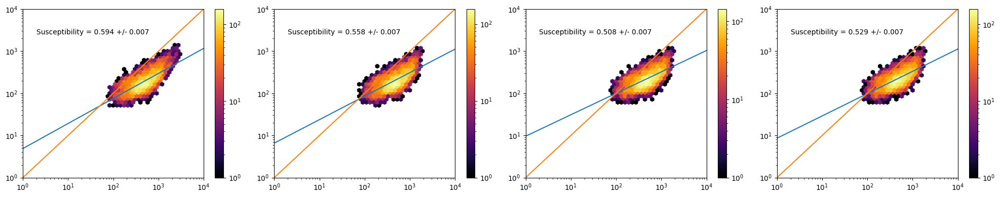

In [74]:
plt.figure(figsize = (20,4))
x = ECearth_ds['TotN70'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev =0)>0).dropna('time')/10**6
y = ECearth_ds['Droplets'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev =0)>0).dropna('time')
plt.subplot(1,4,1)
SBaseLev1 = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {SBaseLev1[0]:.3f} +/- {SBaseLev1[1]:.3f}')     
NdtoCCNGraph(x,y)
x =ECearth_ds['TotN70'].isel(lev = 0).where(ECearth_ds['DropletsCCUp1'].isel(lev =0)>0).dropna('time')/10**6
y = ECearth_ds['DropletsCCUp1'].isel(lev = 0).where((ECearth_ds['DropletsCCUp1'].isel(lev =0)>0) & (ECearth_ds['TotN70'].isel(lev = 0)>0)).dropna('time')
plt.subplot(1,4,2)
ActivatedSensitivity = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {ActivatedSensitivity[0]:.3f} +/- {ActivatedSensitivity[1]:.3f}')    
NdtoCCNGraph(x,y)
x = ECearth_ds['TotN70'].isel(lev = 0).where(ECearth_ds['DropletsCCUp2'].isel(lev =0)>0).dropna('time')/10**6
y = ECearth_ds['DropletsCCUp2'].isel(lev = 0).where((ECearth_ds['DropletsCCUp2'].isel(lev =0)>0) & (ECearth_ds['TotN70'].isel(lev = 0)>0)).dropna('time')
plt.subplot(1,4,3)
ActivatedSensitivityCC = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {ActivatedSensitivityCC[0]:.3f} +/- {ActivatedSensitivityCC[1]:.3f}')    
NdtoCCNGraph(x,y)

x = ECearth_ds['TotN70'].isel(lev = 0).where(ECearth_ds['DropletsCCUp3'].isel(lev =0)>0).dropna('time')/10**6
y = ECearth_ds['DropletsCCUp3'].isel(lev = 0).where((ECearth_ds['DropletsCCUp3'].isel(lev =0)>0) & (ECearth_ds['TotN70'].isel(lev = 0)>0)).dropna('time')
plt.subplot(1,4,4)
ActivatedSensitivityCC = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {ActivatedSensitivityCC[0]:.3f} +/- {ActivatedSensitivityCC[1]:.3f}')    
NdtoCCNGraph(x,y)
plt.tight_layout()

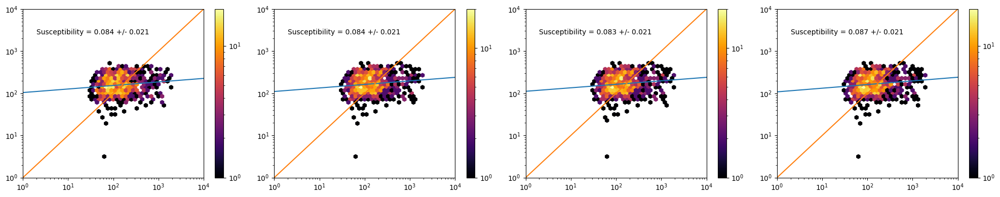

In [75]:
plt.figure(figsize = (20,4))
x = NorESM_ds['TotN70'].isel(lev = -1).where(NorESM_ds['Droplets'].isel(lev =-1)>0).dropna('time')
y = NorESM_ds['Droplets'].isel(lev = -1).where(NorESM_ds['Droplets'].isel(lev =-1)>0).dropna('time')
plt.subplot(1,4,1)
SBaseLev1 = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {SBaseLev1[0]:.3f} +/- {SBaseLev1[1]:.3f}')     
NdtoCCNGraph(x,y)
x =NorESM_ds['TotN70'].isel(lev = -1).where(NorESM_ds['DropletsCCUp1'].isel(lev =-1)>0).dropna('time')
y = NorESM_ds['DropletsCCUp1'].isel(lev = -1).where((NorESM_ds['DropletsCCUp1'].isel(lev =-1)>0) & (NorESM_ds['TotN70'].isel(lev = 0)>0)).dropna('time')
plt.subplot(1,4,2)
ActivatedSensitivity = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {ActivatedSensitivity[0]:.3f} +/- {ActivatedSensitivity[1]:.3f}')    
NdtoCCNGraph(x,y)
x = NorESM_ds['TotN70'].isel(lev = -1).where(NorESM_ds['DropletsCCUp2'].isel(lev =-1)>0).dropna('time')
y = NorESM_ds['DropletsCCUp2'].isel(lev = -1).where((NorESM_ds['DropletsCCUp2'].isel(lev =-1)>0) & (NorESM_ds['TotN70'].isel(lev = 0)>0)).dropna('time')
plt.subplot(1,4,3)
ActivatedSensitivityCC = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {ActivatedSensitivityCC[0]:.3f} +/- {ActivatedSensitivityCC[1]:.3f}')    
NdtoCCNGraph(x,y)

x = NorESM_ds['TotN70'].isel(lev = -1).where(NorESM_ds['DropletsCCUp3'].isel(lev =-1)>0).dropna('time')
y = NorESM_ds['DropletsCCUp3'].isel(lev = -1).where((NorESM_ds['DropletsCCUp3'].isel(lev =-1)>0) & (NorESM_ds['TotN70'].isel(lev = 0)>0)).dropna('time')
plt.subplot(1,4,4)
ActivatedSensitivityCC = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {ActivatedSensitivityCC[0]:.3f} +/- {ActivatedSensitivityCC[1]:.3f}')    
NdtoCCNGraph(x,y)
plt.tight_layout()

clUSTER size distribution and Critical radius visualization

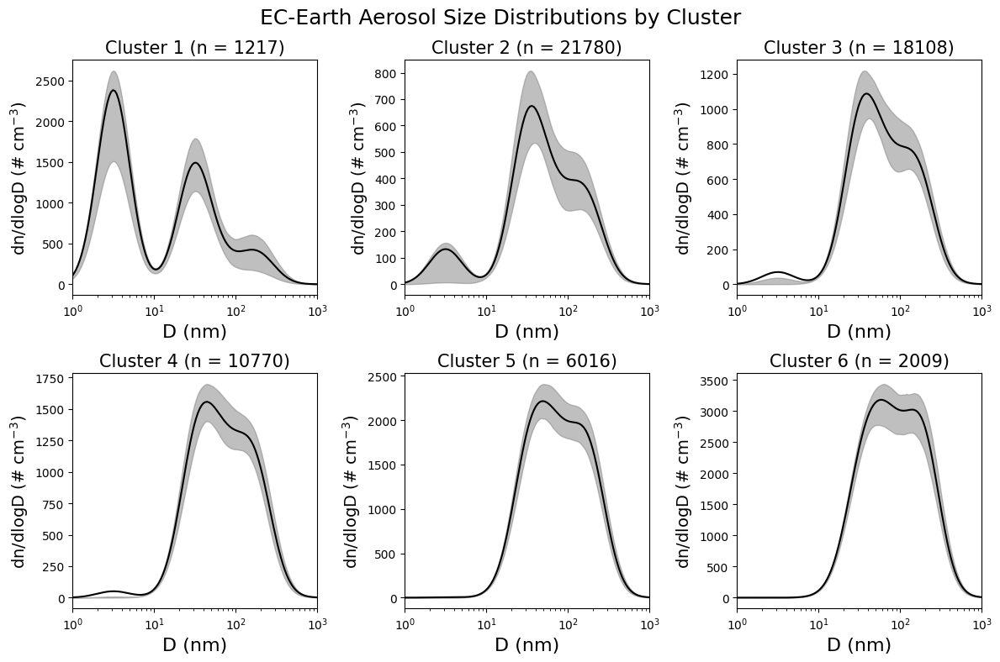

In [76]:
fig, ax = plt.subplots(2, 3, figsize=(12, 8)) 
ECClusters = [5,2,1,3,4,0]

colors = ['red','blue','green']
legend_handles = []
for i, axis in enumerate(ax.flatten()):
    axis.plot(ECGroup[i]['D'],ECGroup[ECClusters[i]]['Tot_dis'].isel(lev = 0).mean('time')/1E6, color = 'black')
    axis.set_xscale('log')
    axis.set_xlim([1,1000])
    axis.set_title(f'Cluster {i+1} (n = {len(ECGroup[ECClusters[i]]['T'].dropna('time'))})', fontsize = 15)
    axis.set_xlabel('D (nm)', fontsize = 16)
    axis.set_ylabel(r'$\text{dn/dlogD } (\#\ \text{cm}^{-3})$', fontsize = 14)
    axis.fill_between(ECGroup[ECClusters[i]]['D'],(ECGroup[ECClusters[i]]['Tot_dis']*1E-6).isel(lev = 0).quantile(0.75, dim='time'),(ECGroup[ECClusters[i]]['Tot_dis']*1E-6).isel(lev = 0).quantile(0.25, dim='time'),color='gray', alpha=0.5, label = 'Interquartile Range')

fig.suptitle('EC-Earth Aerosol Size Distributions by Cluster', fontsize = 18)            
plt.subplots_adjust(bottom=0.25)  
plt.tight_layout()
plt.show()
        

    
    


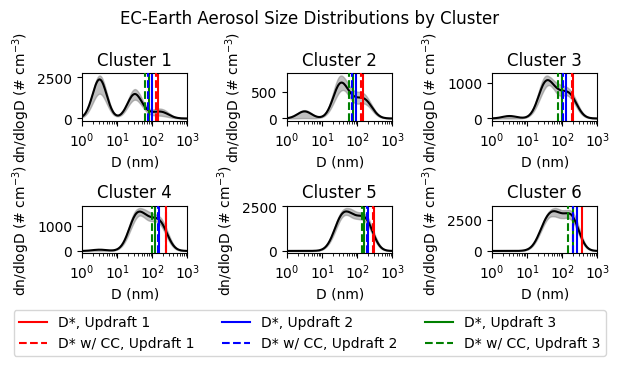

In [77]:
cm = 1/2.54
fig, ax = plt.subplots(2, 3, figsize=(16*cm,7.95*cm)) 
colors = ['red','blue','green']
legend_handles = []
order = [5,2,1,3,4,0]

for plot_idx, i in enumerate(order):
    axis = ax.flatten()[plot_idx]
    axis.plot(ECGroup[i]['D'],ECGroup[i]['Tot_dis'].isel(lev = 0).mean('time')/1E6, color = 'black')
    axis.set_xscale('log')
    axis.set_xlim([1,1000])
    axis.set_title(f'Cluster {plot_idx+1}')
    axis.set_xlabel('D (nm)')
    axis.set_ylabel(r'$\text{dn/dlogD } (\#\ \text{cm}^{-3})$')
    axis.fill_between(ECGroup[i]['D'],(ECGroup[i]['Tot_dis']*1E-6).isel(lev = 0).quantile(0.75, dim='time'),(ECGroup[i]['Tot_dis']*1E-6).isel(lev = 0).quantile(0.25, dim='time'),color='gray', alpha=0.5, label = 'Interquartile Range')


    for n in range(3):
        h1 = axis.axvline(ECActR_df.iloc[n,i], color = colors[n], label = f'D*, Updraft {n+1}')
        h2 = axis.axvline(ECActR_CC_df.iloc[n,i], color = colors[n], ls = '--', zorder=1000,label = f'D* w/ CC, Updraft {n+1}')
        if i == 0:

            legend_handles.extend([h1, h2])
fig.suptitle('EC-Earth Aerosol Size Distributions by Cluster')            
fig.legend(handles=legend_handles, loc="lower center", bbox_to_anchor=(0.5,-0.15), ncol = 3)
plt.subplots_adjust(bottom=0.25)  
plt.tight_layout()
plt.show()
        

    
    


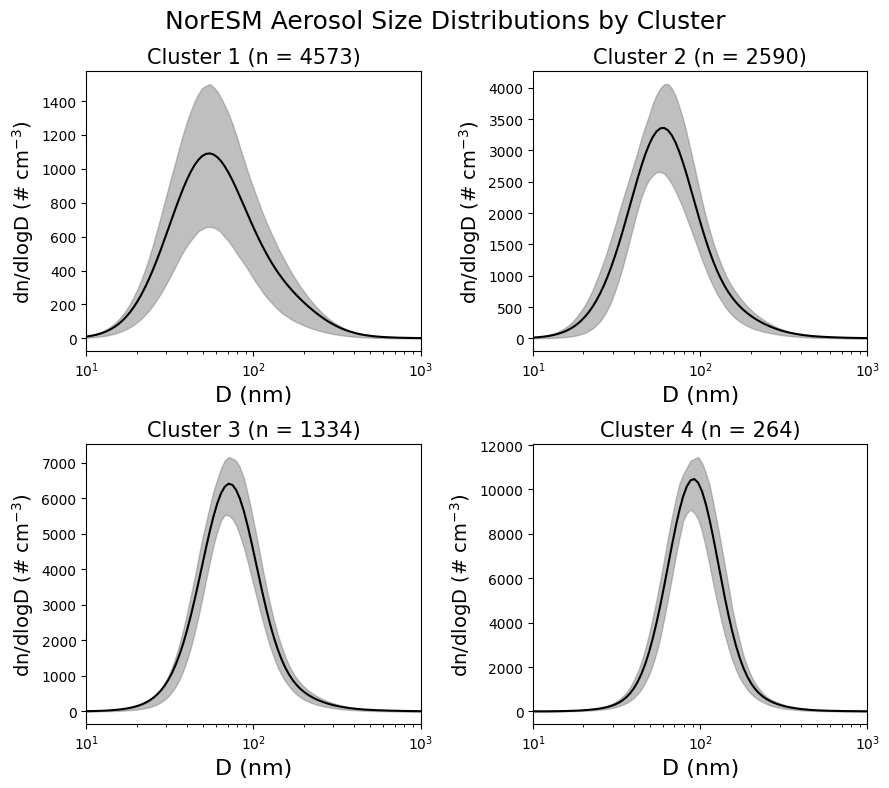

In [78]:
fig, ax = plt.subplots(2, 2, figsize=(9, 8)) 
colors = ['red','blue','green']
order = [3,1,0,2]


legend_handles = []
for plot_idx, i in enumerate(order):
    axis = ax.flatten()[plot_idx]
    axis.plot(NorGroup[i]['D'],NorGroup[i]['Tot_dis'].isel(lev = -1).mean('time'), color = 'black')
    axis.set_xscale('log')
    axis.set_xlim([10,1000])
    axis.set_title(f'Cluster {plot_idx+1} (n = {len(NorGroup[i]['T'].dropna('time'))})', fontsize = 15)
    axis.set_xlabel('D (nm)', fontsize = 16)
    axis.set_ylabel(r'$\text{dn/dlogD } (\#\ \text{cm}^{-3})$',fontsize = 14)
    axis.fill_between(NorGroup[i]['D'],NorGroup[i]['Tot_dis'].isel(lev = -1).quantile(0.75, dim='time'),NorGroup[i]['Tot_dis'].isel(lev = -1).quantile(0.25, dim='time'),color='gray', alpha=0.5, label = 'Interquartile Range')

fig.suptitle('NorESM Aerosol Size Distributions by Cluster', fontsize = 18)                        
plt.subplots_adjust(bottom=0.25)  
plt.tight_layout()
plt.show()

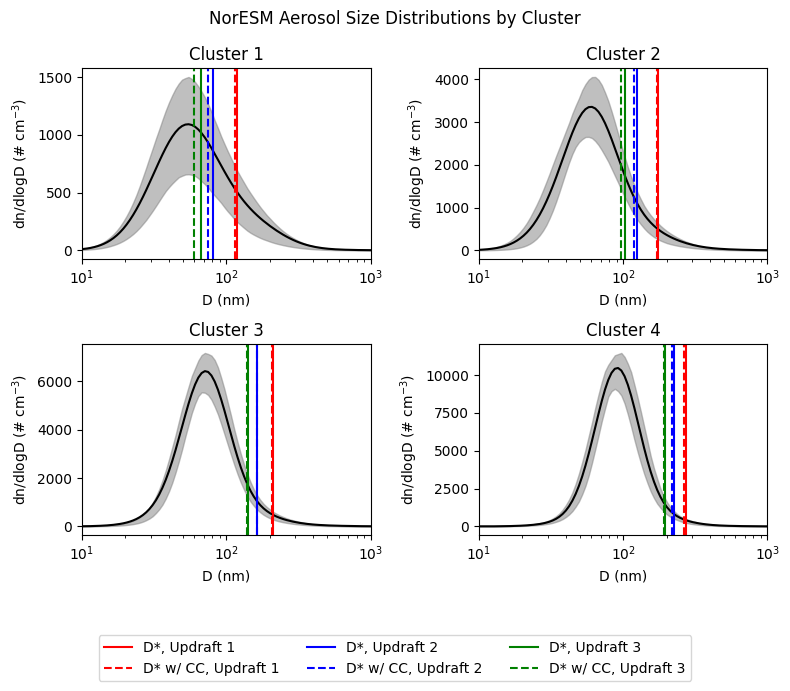

In [79]:
fig, ax = plt.subplots(2, 2, figsize=(8, 6)) 
colors = ['red','blue','green']
legend_handles = []
for plot_idx, i in enumerate(order):
    axis = ax.flatten()[plot_idx]
    axis.plot(NorGroup[i]['D'],NorGroup[i]['Tot_dis'].isel(lev = -1).mean('time'), color = 'black')
    axis.set_xscale('log')
    axis.set_xlim([10,1000])
    axis.set_title(f'Cluster {plot_idx+1}')
    axis.set_xlabel('D (nm)')
    axis.set_ylabel(r'$\text{dn/dlogD } (\#\ \text{cm}^{-3})$')
    axis.fill_between(NorGroup[i]['D'],NorGroup[i]['Tot_dis'].isel(lev = -1).quantile(0.75, dim='time'),NorGroup[i]['Tot_dis'].isel(lev = -1).quantile(0.25, dim='time'),color='gray', alpha=0.5, label = 'Interquartile Range')
    for n in range(3):
        h1 = axis.axvline(NorActR_df.iloc[n,i], color = colors[n], label = f'D*, Updraft {n+1}')
        h2 = axis.axvline(NorActR_CC_df.iloc[n,i], color = colors[n], ls = '--', label = f'D* w/ CC, Updraft {n+1}')
        if i == 0:

            legend_handles.extend([h1, h2])
fig.suptitle('NorESM Aerosol Size Distributions by Cluster')                        
fig.legend(handles=legend_handles, loc="lower center", bbox_to_anchor=(0.5,-0.15), ncol = 3)
plt.subplots_adjust(bottom=0.25)  
plt.tight_layout()
plt.show()

nor Esm 
4 clusters
3 updrafts & 1 normal
x2 with CC 



In [80]:
BaseCaselev1 = Susceptibility(NorESM_ds['TotN70'].isel(lev = -1).where(NorESM_ds['Droplets'].isel(lev = -1)>0).dropna('time'),NorESM_ds['Droplets'].isel(lev = -1).dropna('time'))
BaseCaselev2 = Susceptibility(NorESM_ds['TotN70'].isel(lev = -2).where(NorESM_ds['Droplets'].isel(lev = -2)>0).dropna('time'),NorESM_ds['Droplets'].isel(lev = -2).dropna('time'))
BaseCaselev3 = Susceptibility(NorESM_ds['TotN70'].isel(lev = -3).where(NorESM_ds['Droplets'].isel(lev = -3)>0).dropna('time'),NorESM_ds['Droplets'].isel(lev = -3).dropna('time'))

In [81]:
Sensitivity = []
Yerr = []
for name in [BaseCaselev1,BaseCaselev2, BaseCaselev3]:
    Sensitivity.append(name[0])
    Yerr.append(name[1]*1.96)
for i in range (18):
    z = [-1, -2, -3][i % 3]
    if i in [3,4,5]:
        Sensitivity.append(Susceptibility(NorESM_ds[VarNamesReOrder[i]].where(NorESM_ds['DropletsCCUp1'].isel(lev = z)>0).dropna('time'),NorESM_ds['DropletsCCUp1'].isel(lev = z).dropna('time'))[0])
        Yerr.append(Susceptibility(NorESM_ds[VarNamesReOrder[i]].where(NorESM_ds['DropletsCCUp1'].isel(lev = z)>0).dropna('time'),NorESM_ds['DropletsCCUp1'].isel(lev = z).dropna('time'))[1]*1.96)
        continue
    if i in [9,10,11]:
        Sensitivity.append(Susceptibility(NorESM_ds[VarNamesReOrder[i]].where(NorESM_ds['DropletsCCUp2'].isel(lev = z)>0).dropna('time'),NorESM_ds['DropletsCCUp2'].isel(lev = z).dropna('time'))[0])
        Yerr.append(Susceptibility(NorESM_ds[VarNamesReOrder[i]].where(NorESM_ds['DropletsCCUp2'].isel(lev = z)>0).dropna('time'),NorESM_ds['DropletsCCUp2'].isel(lev = z).dropna('time'))[1])
        continue
    if i in [15,16,17]:
        Sensitivity.append(Susceptibility(NorESM_ds[VarNamesReOrder[i]].where(NorESM_ds['DropletsCCUp3'].isel(lev = z)>0).dropna('time'),NorESM_ds['DropletsCCUp3'].isel(lev = z).dropna('time'))[0])
        Yerr.append(Susceptibility(NorESM_ds[VarNamesReOrder[i]].where(NorESM_ds['DropletsCCUp3'].isel(lev = z)>0).dropna('time'),NorESM_ds['DropletsCCUp3'].isel(lev = z).dropna('time'))[1]*1.96)
        continue   
    Sensitivity.append(Susceptibility(NorESM_ds[VarNamesReOrder[i]].where(NorESM_ds['Droplets'].isel(lev = z)>0).dropna('time'),NorESM_ds['Droplets'].isel(lev = z).dropna('time'))[0])
    Yerr.append(Susceptibility(NorESM_ds[VarNamesReOrder[i]].where(NorESM_ds['Droplets'].isel(lev = z)>0).dropna('time'),NorESM_ds['Droplets'].isel(lev = z).dropna('time'))[1]*1.96)

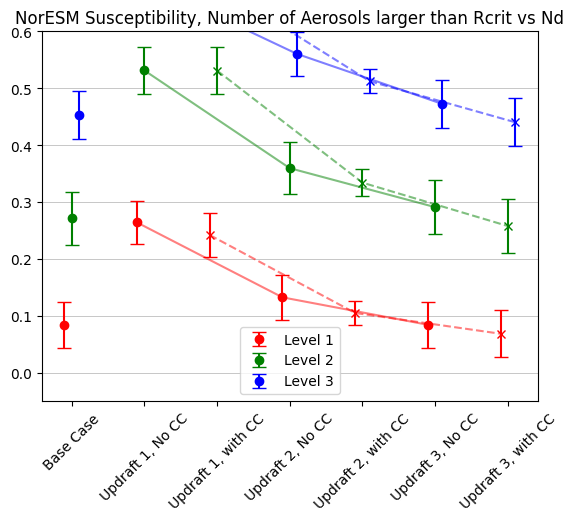

In [82]:
Names = ['Base Case', 'Updraft 1, No CC','Updraft 1, with CC',  'Updraft 2, No CC', 'Updraft 2, with CC', 'Updraft 3, No CC', 'Updraft 3, with CC']
x_positions = [.9,1,1.1,1.9,2,2.1,2.9,3,3.1,3.9,4,4.1,4.9,5,5.1,5.9,6,6.1,6.9,7,7.1]
xnames = np.arange(len(Names))
xnames = xnames +1
colors = ['red', 'green', 'blue']
for i in range(len(x_positions)):
    color = colors[i % len(colors)] 
    if i < 3:
        plt.errorbar(x_positions[i], Sensitivity[i], yerr=Yerr[i], fmt='o', capsize=5, color=color, label = f'Level {i+1}')
    else:
        if i in [3,4,5,9,10,11,15,16,17]:
            plt.errorbar(x_positions[i], Sensitivity[i], yerr=Yerr[i], fmt='o', capsize=5, color=color)
        else:
            plt.errorbar(x_positions[i], Sensitivity[i], yerr=Yerr[i], fmt='x', capsize=5, color=color)
for i in [0,1,2]:
    color = colors[i % len(colors)]
    plt.plot(x_positions[i+3:None:6],Sensitivity[i+3:None:6], linestyle = '-', color = color,  alpha = 0.5)
for i in [3,4,5]:
    color = colors[i % len(colors)]
    plt.plot(x_positions[i+3:None:6],Sensitivity[i+3:None:6], linestyle = '--', color = color,  alpha = 0.5)
plt.legend()   
plt.ylim([-0.05,.6])

plt.xticks(xnames, Names, rotation=45)
plt.grid(True, axis = 'y', which = 'major', linestyle="-", linewidth=0.5)
plt.title('NorESM Susceptibility, Number of Aerosols larger than Rcrit vs Nd')

plt.show()


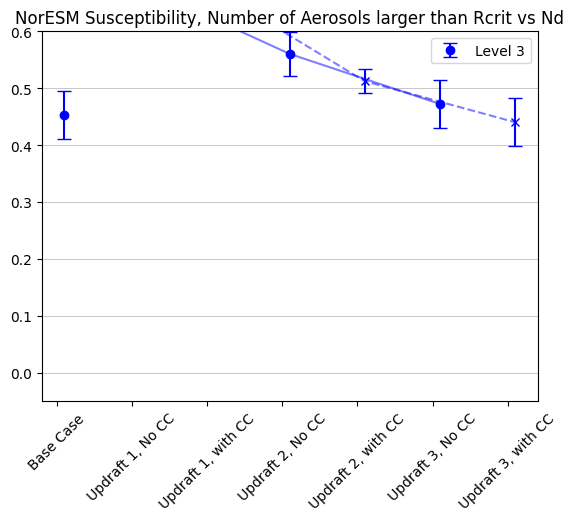

In [83]:
Names = ['Base Case', 'Updraft 1, No CC','Updraft 1, with CC',  'Updraft 2, No CC', 'Updraft 2, with CC', 'Updraft 3, No CC', 'Updraft 3, with CC']
x_positions = [.9,1,1.1,1.9,2,2.1,2.9,3,3.1,3.9,4,4.1,4.9,5,5.1,5.9,6,6.1,6.9,7,7.1]
xnames = np.arange(len(Names))
xnames = xnames +1
lev3position = [2,5,8,11,14,17, 20]
markers = ['o','x']
for i in range(len(x_positions)):
    color = 'blue'
    
    if i == 2:
        plt.errorbar(x_positions[i], Sensitivity[i], yerr=Yerr[i], fmt='o', capsize=5, color=color, label = f'Level {i+1}')
    else:
        if i in [2,5,11,17]:
            plt.errorbar(x_positions[i], Sensitivity[i], yerr=Yerr[i], fmt='o', capsize=5, color=color)
        if i in [8,14,20]: 
           plt.errorbar(x_positions[i], Sensitivity[i], yerr=Yerr[i], fmt='x', capsize=5, color=color) 
i = 2

plt.plot(x_positions[i+3:None:6],Sensitivity[i+3:None:6], linestyle = '-', color = color,  alpha = 0.5)
i = 5
plt.plot(x_positions[i+3:None:6],Sensitivity[i+3:None:6], linestyle = '--', color = color,  alpha = 0.5)
plt.ylim([-0.05,.6])
plt.legend()    
plt.xticks(xnames, Names, rotation=45)
plt.grid(True, axis = 'y', which = 'major', linestyle="-", linewidth=0.5)
plt.title('NorESM Susceptibility, Number of Aerosols larger than Rcrit vs Nd')

plt.show()


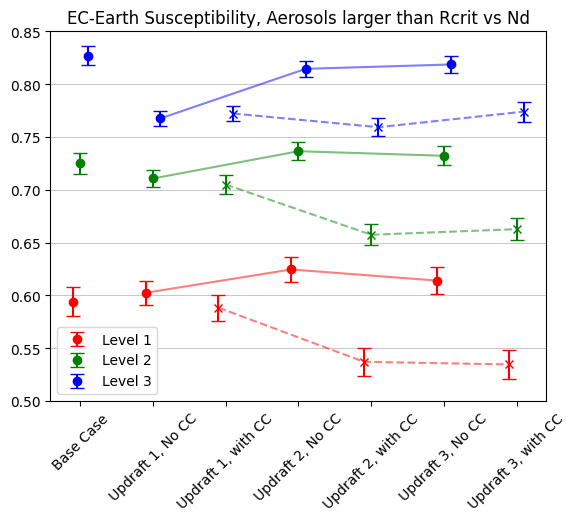

In [84]:

x_positions = [.9,1,1.1,1.9,2,2.1,2.9,3,3.1,3.9,4,4.1,4.9,5,5.1,5.9,6,6.1,6.9,7,7.1]
xnames = np.arange(len(Names))
xnames = xnames +1
colors = ['red', 'green', 'blue']
for i in range(len(x_positions)):
    color = colors[i % len(colors)] 
    if i < 3:
        plt.errorbar(x_positions[i], SensitivityEC[i], yerr=YerrEC[i], fmt='o', capsize=5, color=color, label = f'Level {i+1}')
    else:
        if i in [3,4,5,9,10,11,15,16,17]:
            plt.errorbar(x_positions[i], SensitivityEC[i], yerr=YerrEC[i], fmt='o', capsize=5, color=color)
        else:
            plt.errorbar(x_positions[i], SensitivityEC[i], yerr=YerrEC[i], fmt='x', capsize=5, color=color)
for i in [0,1,2]:
    color = colors[i % len(colors)]
    plt.plot(x_positions[i+3:None:6],SensitivityEC[i+3:None:6], linestyle = '-', color = color,  alpha = 0.5)
for i in [3,4,5]:
    color = colors[i % len(colors)]
    plt.plot(x_positions[i+3:None:6],SensitivityEC[i+3:None:6], linestyle = '--', color = color,  alpha = 0.5)
plt.legend() 
plt.ylim([0.5,.85])

plt.xticks(xnames, Names, rotation=45)
plt.grid(True, axis = 'y', which = 'major', linestyle="-", linewidth=0.5)
plt.title('EC-Earth Susceptibility, Aerosols larger than Rcrit vs Nd')

plt.show()

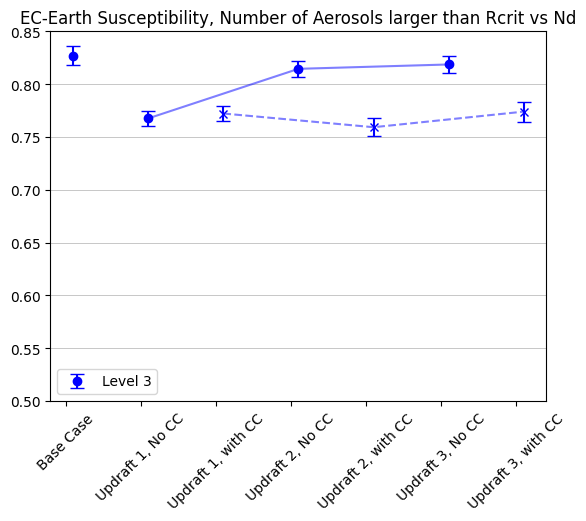

In [85]:
Names = ['Base Case', 'Updraft 1, No CC','Updraft 1, with CC',  'Updraft 2, No CC', 'Updraft 2, with CC', 'Updraft 3, No CC', 'Updraft 3, with CC']
x_positions = [.9,1,1.1,1.9,2,2.1,2.9,3,3.1,3.9,4,4.1,4.9,5,5.1,5.9,6,6.1,6.9,7,7.1]
xnames = np.arange(len(Names))
xnames = xnames +1
lev3position = [2,5,8,11,14,17, 20]
markers = ['o','x']
for i in range(len(x_positions)):
    color = 'blue'
    
    if i == 2:
        plt.errorbar(x_positions[i], SensitivityEC[i], yerr=YerrEC[i], fmt='o', capsize=5, color=color, label = f'Level {i+1}')
    else:
        if i in [2,5,11,17]:
            plt.errorbar(x_positions[i], SensitivityEC[i], yerr=YerrEC[i], fmt='o', capsize=5, color=color)
        if i in [8,14,20]: 
           plt.errorbar(x_positions[i], SensitivityEC[i], yerr=YerrEC[i], fmt='x', capsize=5, color=color) 
i = 2

plt.plot(x_positions[i+3:None:6],SensitivityEC[i+3:None:6], linestyle = '-', color = color,  alpha = 0.5)
i = 5
plt.plot(x_positions[i+3:None:6],SensitivityEC[i+3:None:6], linestyle = '--', color = color,  alpha = 0.5)
plt.ylim([0.5,.85])

plt.legend()    
plt.xticks(xnames, Names, rotation=45)
plt.grid(True, axis = 'y', which = 'major', linestyle="-", linewidth=0.5)
plt.title('EC-Earth Susceptibility, Number of Aerosols larger than Rcrit vs Nd')

plt.show()


In [86]:
x_positions = [.9,1,1.1,1.9,2,2.1,2.9,3,3.1,3.9,4,4.1,4.9,5,5.1,5.9,6,6.1,6.9,7,7.1]
noCCpositionlev1 = x_positions[3:None:6]
SensitivityEC

[np.float64(0.5941362377785278),
 np.float64(0.7251967285377134),
 np.float64(0.8269095552581155),
 np.float64(0.6024399347778284),
 np.float64(0.7106727719254942),
 np.float64(0.7675512260720169),
 np.float64(0.5883496485559064),
 np.float64(0.7049609079767138),
 np.float64(0.7722081093261631),
 np.float64(0.6245119461764363),
 np.float64(0.7364956844808648),
 np.float64(0.8145193013428002),
 np.float64(0.5370971455613047),
 np.float64(0.6573833099252807),
 np.float64(0.7592281999009901),
 np.float64(0.6140133286789485),
 np.float64(0.7321743053313008),
 np.float64(0.8186522643632355),
 np.float64(0.5345816914928191),
 np.float64(0.6626860344287021),
 np.float64(0.7740055844338938)]

(np.float64(0.6245119461764363), np.float64(0.0061282973504831785))
(np.float64(0.5370971455613047), np.float64(0.006789500468573477))
(np.float64(0.7364956844808648), np.float64(0.004361504535383857))
(np.float64(0.6573833099252807), np.float64(0.005050197923546607))
(np.float64(0.8145193013428002), np.float64(0.0038753207364766507))
(np.float64(0.7592281999009901), np.float64(0.004405900504193682))


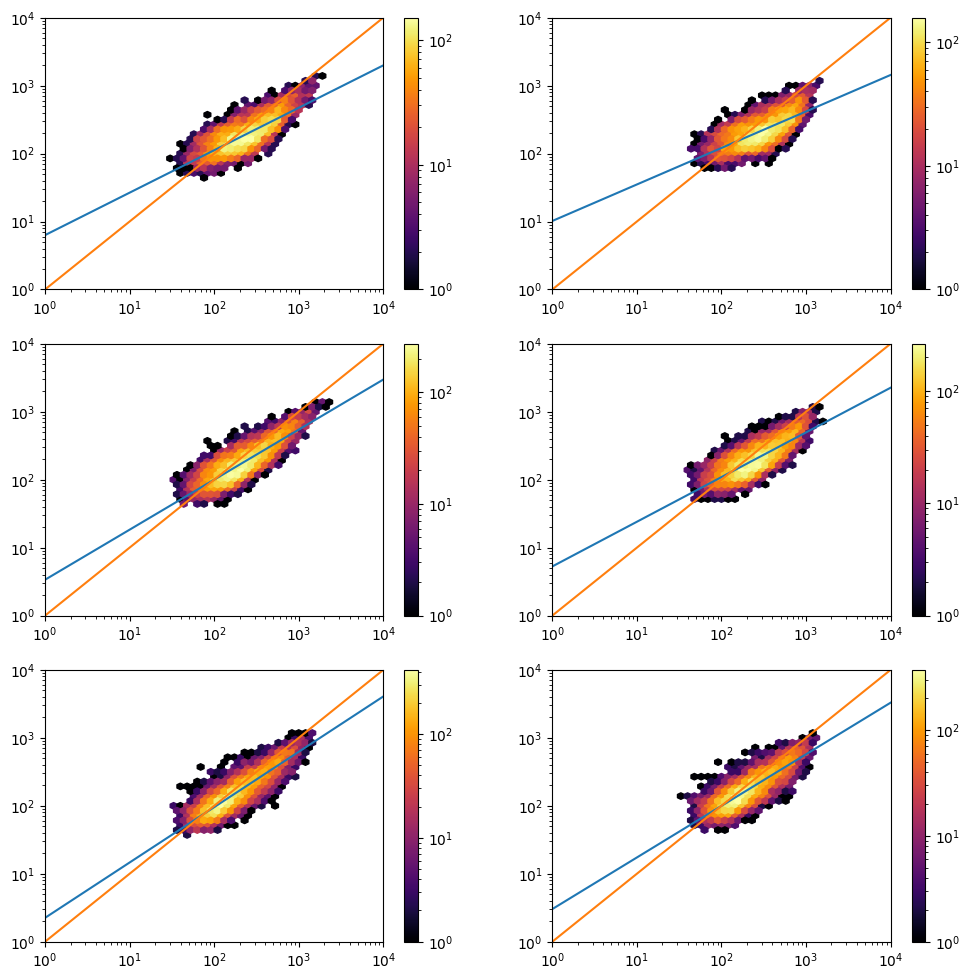

In [87]:
plt.figure(figsize = (12,12))
plt.subplot(3,2,1)
NdtoCCNGraph(ECearth_ds['Lev1Up2NoCC'].where(ECearth_ds['Droplets'].isel(lev = 0)>0).dropna('time')/1E6,ECearth_ds['Droplets'].isel(lev = 0).dropna('time'))
print(Susceptibility(ECearth_ds['Lev1Up2NoCC'].where(ECearth_ds['Droplets'].isel(lev = 0)>0).dropna('time')/1E6,ECearth_ds['Droplets'].isel(lev = 0).dropna('time')))
plt.subplot(3,2,2)
NdtoCCNGraph(ECearth_ds['Lev1Up2CC'].where(ECearth_ds['DropletsCCUp2'].isel(lev = 0)>0).dropna('time')/1E6,ECearth_ds['DropletsCCUp2'].isel(lev = 0).dropna('time'))
print(Susceptibility(ECearth_ds['Lev1Up2CC'].where(ECearth_ds['DropletsCCUp2'].isel(lev = 0)>0).dropna('time')/1E6,ECearth_ds['DropletsCCUp2'].isel(lev = 0).dropna('time')))
plt.subplot(3,2,3)
NdtoCCNGraph(ECearth_ds['Lev2Up2NoCC'].where(ECearth_ds['Droplets'].isel(lev = 1)>0).dropna('time')/1E6,ECearth_ds['Droplets'].isel(lev = 1).dropna('time'))
print(Susceptibility(ECearth_ds['Lev2Up2NoCC'].where(ECearth_ds['Droplets'].isel(lev = 1)>0).dropna('time')/1E6,ECearth_ds['Droplets'].isel(lev = 1).dropna('time')))
plt.subplot(3,2,4)
NdtoCCNGraph(ECearth_ds['Lev2Up2CC'].where(ECearth_ds['DropletsCCUp2'].isel(lev = 1)>0).dropna('time')/1E6,ECearth_ds['DropletsCCUp2'].isel(lev = 1).dropna('time'))
print(Susceptibility(ECearth_ds['Lev2Up2CC'].where(ECearth_ds['DropletsCCUp2'].isel(lev = 1)>0).dropna('time')/1E6,ECearth_ds['DropletsCCUp2'].isel(lev = 1).dropna('time')))
plt.subplot(3,2,5)
NdtoCCNGraph(ECearth_ds['Lev3Up2NoCC'].where(ECearth_ds['Droplets'].isel(lev = 2)>0).dropna('time')/1E6,ECearth_ds['Droplets'].isel(lev = 2).dropna('time'))
print(Susceptibility(ECearth_ds['Lev3Up2NoCC'].where(ECearth_ds['Droplets'].isel(lev = 2)>0).dropna('time')/1E6,ECearth_ds['Droplets'].isel(lev = 2).dropna('time')))
plt.subplot(3,2,6)
NdtoCCNGraph(ECearth_ds['Lev3Up2CC'].where(ECearth_ds['DropletsCCUp2'].isel(lev = 2)>0).dropna('time')/1E6,ECearth_ds['DropletsCCUp2'].isel(lev = 2).dropna('time'))
print(Susceptibility(ECearth_ds['Lev3Up2CC'].where(ECearth_ds['DropletsCCUp2'].isel(lev = 2)>0).dropna('time')/1E6,ECearth_ds['DropletsCCUp2'].isel(lev = 2).dropna('time')))


In [88]:
BaseCaselev1 = Susceptibility(NorESM_ds['TotN70'].isel(lev = -1).where(NorESM_ds['Droplets'].isel(lev = -1)>0).dropna('time'),NorESM_ds['Droplets'].isel(lev = -1).dropna('time'))

N70Updraft1CClev1 = Susceptibility(NorESM_ds['TotN70'].isel(lev = -1).where(NorESM_ds['DropletsCCUp1'].isel(lev = -1)>0).dropna('time'),NorESM_ds['DropletsCCUp1'].isel(lev = -1).dropna('time'))
N70Updraft2CClev1 = Susceptibility(NorESM_ds['TotN70'].isel(lev = -1).where(NorESM_ds['DropletsCCUp2'].isel(lev = -1)>0).dropna('time'),NorESM_ds['DropletsCCUp2'].isel(lev = -1).dropna('time'))
N70Updraft3CClev1 = Susceptibility(NorESM_ds['TotN70'].isel(lev = -1).where(NorESM_ds['DropletsCCUp3'].isel(lev = -1)>0).dropna('time'),NorESM_ds['DropletsCCUp3'].isel(lev = -1).dropna('time'))

BaseCaselev2 = Susceptibility(NorESM_ds['TotN70'].isel(lev = -2).where(NorESM_ds['Droplets'].isel(lev = -2)>0).dropna('time'),NorESM_ds['Droplets'].isel(lev = -2).dropna('time'))

N70Updraft1CClev2 = Susceptibility(NorESM_ds['TotN70'].isel(lev = -2).where(NorESM_ds['DropletsCCUp1'].isel(lev = -2)>0).dropna('time'),NorESM_ds['DropletsCCUp1'].isel(lev = -2).dropna('time'))
N70Updraft2CClev2 = Susceptibility(NorESM_ds['TotN70'].isel(lev = -2).where(NorESM_ds['DropletsCCUp2'].isel(lev = -2)>0).dropna('time'),NorESM_ds['DropletsCCUp2'].isel(lev = -2).dropna('time'))
N70Updraft3CClev2 = Susceptibility(NorESM_ds['TotN70'].isel(lev = -2).where(NorESM_ds['DropletsCCUp3'].isel(lev = -2)>0).dropna('time'),NorESM_ds['DropletsCCUp3'].isel(lev = -2).dropna('time'))

BaseCaselev3 = Susceptibility(NorESM_ds['TotN70'].isel(lev = -3).where(NorESM_ds['Droplets'].isel(lev = -3)>0).dropna('time'),NorESM_ds['Droplets'].isel(lev = -3).dropna('time'))

N70Updraft1CClev3 = Susceptibility(NorESM_ds['TotN70'].isel(lev = -3).where(NorESM_ds['DropletsCCUp1'].isel(lev = -3)>0).dropna('time'),NorESM_ds['DropletsCCUp1'].isel(lev = -3).dropna('time'))
N70Updraft2CClev3 = Susceptibility(NorESM_ds['TotN70'].isel(lev = -3).where(NorESM_ds['DropletsCCUp2'].isel(lev = -3)>0).dropna('time'),NorESM_ds['DropletsCCUp2'].isel(lev = -3).dropna('time'))
N70Updraft3CClev3 = Susceptibility(NorESM_ds['TotN70'].isel(lev = -3).where(NorESM_ds['DropletsCCUp3'].isel(lev = -3)>0).dropna('time'),NorESM_ds['DropletsCCUp3'].isel(lev = -3).dropna('time'))

In [89]:
NameslistN70 = [BaseCaselev1,BaseCaselev2, BaseCaselev3,\
             N70Updraft1CClev1,N70Updraft1CClev2,N70Updraft1CClev3,\
             N70Updraft2CClev1,N70Updraft2CClev2,N70Updraft2CClev3,\
             N70Updraft3CClev1,N70Updraft3CClev2,N70Updraft3CClev3]
SensitivityN70 = []
YerrN70 = []
for Name in NameslistN70:
    SensitivityN70.append(Name[0])
    YerrN70.append(Name[1]*1.96)
NamesN70 = ['Base Case','Updraft 1, with CC', 'Updraft 2, with CC', 'Updraft 3, with CC']

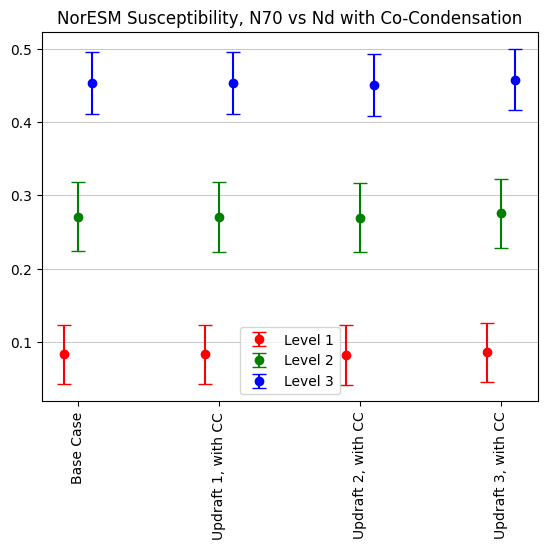

In [90]:
x_positionsN70 = [.9,1,1.1,1.9,2,2.1,2.9,3,3.1,3.9,4,4.1]
xnamesN70 = np.arange(len(NamesN70))
xnamesN70 = xnamesN70 +1
colors = ['red', 'green', 'blue']
for i in range(len(x_positionsN70)):
    color = colors[i % len(colors)] 
    if i < 3:
        plt.errorbar(x_positionsN70[i], SensitivityN70[i], yerr=YerrN70[i], fmt='o', capsize=5, color=color, label = f'Level {i+1}')
    else:
        plt.errorbar(x_positionsN70[i], SensitivityN70[i], yerr=YerrN70[i], fmt='o', capsize=5, color=color)
plt.legend()    
plt.xticks(xnamesN70, NamesN70, rotation=90)
plt.grid(True, axis = 'y', which = 'major', linestyle="-", linewidth=0.5)
plt.title('NorESM Susceptibility, N70 vs Nd with Co-Condensation')
plt.show()


In [91]:
BaseCaselev1EC = Susceptibility(ECearth_ds['TotN70'].isel(lev = 0).where(ECearth_ds['Droplets'].isel(lev = 0)>0).dropna('time')/1E6,ECearth_ds['Droplets'].isel(lev = 0).dropna('time'))

N70ECUpdraft1CClev1 = Susceptibility(ECearth_ds['TotN70'].isel(lev = 0).where(ECearth_ds['DropletsCCUp1'].isel(lev = 0)>0).dropna('time')/1E6,\
                                ECearth_ds['DropletsCCUp1'].isel(lev = 0).where((ECearth_ds['DropletsCCUp1'].isel(lev =0)>0) & (ECearth_ds['TotN70'].isel(lev = 0)>0)).dropna('time'))
N70ECUpdraft2CClev1 = Susceptibility(ECearth_ds['TotN70'].isel(lev = 0).where(ECearth_ds['DropletsCCUp2'].isel(lev = 0)>0).dropna('time')/1E6,\
                                ECearth_ds['DropletsCCUp2'].isel(lev = 0).where((ECearth_ds['DropletsCCUp2'].isel(lev =0)>0) & (ECearth_ds['TotN70'].isel(lev = 0)>0)).dropna('time'))
N70ECUpdraft3CClev1 = Susceptibility(ECearth_ds['TotN70'].isel(lev = 0).where(ECearth_ds['DropletsCCUp3'].isel(lev = 0)>0).dropna('time')/1E6,\
                                ECearth_ds['DropletsCCUp3'].isel(lev = 0).where((ECearth_ds['DropletsCCUp3'].isel(lev =0)>0) & (ECearth_ds['TotN70'].isel(lev = 0)>0)).dropna('time'))

BaseCaselev2EC = Susceptibility(ECearth_ds['TotN70'].isel(lev = 1).where(ECearth_ds['Droplets'].isel(lev = 1)>0).dropna('time')/1E6,ECearth_ds['Droplets'].isel(lev = 1).dropna('time'))

N70ECUpdraft1CClev2 = Susceptibility(ECearth_ds['TotN70'].isel(lev = 1).where(ECearth_ds['DropletsCCUp1'].isel(lev = 1)>0).dropna('time')/1E6,\
                                ECearth_ds['DropletsCCUp1'].isel(lev = 1).where((ECearth_ds['DropletsCCUp1'].isel(lev = 1)>0) & (ECearth_ds['TotN70'].isel(lev = 1)>0)).dropna('time'))
N70ECUpdraft2CClev2 = Susceptibility(ECearth_ds['TotN70'].isel(lev = 1).where(ECearth_ds['DropletsCCUp2'].isel(lev = 1)>0).dropna('time')/1E6,\
                                ECearth_ds['DropletsCCUp2'].isel(lev = 1).where((ECearth_ds['DropletsCCUp2'].isel(lev = 1)>0) & (ECearth_ds['TotN70'].isel(lev = 1)>0)).dropna('time'))
N70ECUpdraft3CClev2 = Susceptibility(ECearth_ds['TotN70'].isel(lev = 1).where(ECearth_ds['DropletsCCUp3'].isel(lev = 1)>0).dropna('time')/1E6,\
                                ECearth_ds['DropletsCCUp3'].isel(lev = 1).where((ECearth_ds['DropletsCCUp3'].isel(lev = 1)>0) & (ECearth_ds['TotN70'].isel(lev = 1)>0)).dropna('time'))

BaseCaselev3EC = Susceptibility(ECearth_ds['TotN70'].isel(lev = 2).where(ECearth_ds['Droplets'].isel(lev = 2)>0).dropna('time')/1E6,ECearth_ds['Droplets'].isel(lev = 2).dropna('time'))

N70ECUpdraft1CClev3 = Susceptibility(ECearth_ds['TotN70'].isel(lev = 2).where(ECearth_ds['DropletsCCUp1'].isel(lev = 2)>0).dropna('time')/1E6,\
                                ECearth_ds['DropletsCCUp1'].isel(lev = 2).where((ECearth_ds['DropletsCCUp1'].isel(lev =2)>0) & (ECearth_ds['TotN70'].isel(lev = 2)>0)).dropna('time'))
N70ECUpdraft2CClev3 = Susceptibility(ECearth_ds['TotN70'].isel(lev = 2).where(ECearth_ds['DropletsCCUp2'].isel(lev = 2)>0).dropna('time')/1E6,\
                                ECearth_ds['DropletsCCUp2'].isel(lev = 2).where((ECearth_ds['DropletsCCUp2'].isel(lev =2)>0) & (ECearth_ds['TotN70'].isel(lev = 2)>0)).dropna('time'))
N70ECUpdraft3CClev3 = Susceptibility(ECearth_ds['TotN70'].isel(lev = 2).where(ECearth_ds['DropletsCCUp3'].isel(lev = 2)>0).dropna('time')/1E6,\
                                ECearth_ds['DropletsCCUp3'].isel(lev = 2).where((ECearth_ds['DropletsCCUp3'].isel(lev =2)>0) & (ECearth_ds['TotN70'].isel(lev = 2)>0)).dropna('time'))

In [92]:
#ECearth_ds['Droplets'].isel(lev = 12).dropna('time')
ECearth_ds['lev']
NorESM_ds['lev']

<xarray.DataArray 'lev' (lev: 32)> Size: 256B
array([  3.643466,   7.59482 ,  14.356632,  24.61222 ,  35.92325 ,  43.19375 ,
        51.677499,  61.520498,  73.750958,  87.82123 , 103.317127, 121.547241,
       142.994039, 168.22508 , 197.908087, 232.828619, 273.910817, 322.241902,
       379.100904, 445.992574, 524.687175, 609.778695, 691.38943 , 763.404481,
       820.858369, 859.534767, 887.020249, 912.644547, 936.198398, 957.48548 ,
       976.325407, 992.556095])
Coordinates:
    station  <U6 24B ...
  * lev      (lev) float64 256B 3.643 7.595 14.36 24.61 ... 957.5 976.3 992.6
    Dx       float64 8B ...
    index    <U19 76B ...

In [93]:
LevelSus = []
levelEC = []
for z in range(11):
    print(len(ECearth_ds['Droplets'].isel(lev = z).dropna('time')))
    #if len(ECearth_ds['Droplets'].isel(lev = z).dropna('time')) 
    LevelSus.append(Susceptibility(ECearth_ds['TotN70'].isel(lev = z).where(ECearth_ds['Droplets'].isel(lev = z)>0).dropna('time')/1E6,ECearth_ds['Droplets'].isel(lev = z).dropna('time')))
    levelEC.append(ECearth_ds['lev'].isel(lev = z))


7095
11509
12661
13082
12537
10971
8697
6540
4590
3162
1442


In [94]:
ActLevelSus = []
levelEC = []
for z in range(11):
    print(len(ECearth_ds['Droplets'].isel(lev = z).dropna('time')))
    #if len(ECearth_ds['Droplets'].isel(lev = z).dropna('time')) 
    LevelSus.append(Susceptibility(ECearth_ds['TotN70'].isel(lev = z).where(ECearth_ds['Droplets'].isel(lev = z)>0).dropna('time')/1E6,ECearth_ds['Droplets'].isel(lev = z).dropna('time')))
    levelEC.append(ECearth_ds['lev'].isel(lev = z))


7095
11509
12661
13082
12537
10971
8697
6540
4590
3162
1442


In [95]:
LevelSusNor = []
levelNor = []
for z in range(-1, -12, -1):
    print(len(NorESM_ds['Droplets'].isel(lev = z).dropna('time')))
    LevelSusNor.append(Susceptibility(NorESM_ds['TotN70'].isel(lev = z).where(NorESM_ds['Droplets'].isel(lev = z)>0).dropna('time')/1E6,NorESM_ds['Droplets'].isel(lev = z).dropna('time')))
    levelNor.append(NorESM_ds['lev'].isel(lev = z))


980
1406
1729
1843
1788
1696
1654
1630
936
371
149


Text(0.5, 1.0, 'Relationship Between Height and Susceptibility')

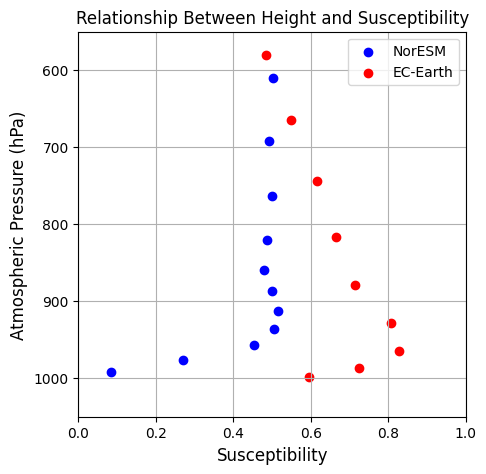

In [96]:
plt.figure(figsize = (5,5))
for i in range(len(LevelSusNor)):
    if i == 1:
        plt.scatter( LevelSusNor[i][0],levelNor[i] , color = 'blue', label = 'NorESM')
        plt.scatter(  LevelSus[i][0],levelEC[i], color = 'red', label = 'EC-Earth')
        continue
    plt.scatter( LevelSusNor[i][0],levelNor[i] , color = 'blue')
    plt.scatter(  LevelSus[i][0],levelEC[i], color = 'red')
plt.legend()
plt.ylim(1050,550)
plt.xlim(0,1)
plt.ylabel('Atmospheric Pressure (hPa)', fontsize = 12)
plt.xlabel('Susceptibility', fontsize = 12)
plt.grid()
plt.title('Relationship Between Height and Susceptibility' , fontsize = 12)


In [97]:
NameslistN70EC = [BaseCaselev1EC,BaseCaselev2EC, BaseCaselev3EC,\
             N70ECUpdraft1CClev1,N70ECUpdraft1CClev2,N70ECUpdraft1CClev3,\
             N70ECUpdraft2CClev1,N70ECUpdraft2CClev2,N70ECUpdraft2CClev3,\
             N70ECUpdraft3CClev1,N70ECUpdraft3CClev2,N70ECUpdraft3CClev3]
SensitivityN70EC = []
YerrN70EC = []
for Name in NameslistN70EC:
    SensitivityN70EC.append(Name[0])
    YerrN70EC.append(Name[1]*1.96)
NamesN70EC = ['Base Case','Updraft 1, with CC', 'Updraft 2, with CC', 'Updraft 3, with CC']

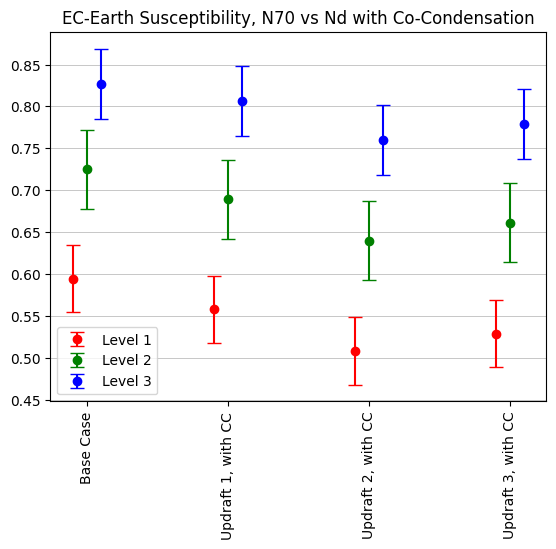

In [98]:
x_positionsN70EC = [.9,1,1.1,1.9,2,2.1,2.9,3,3.1,3.9,4,4.1]
xnamesN70EC = np.arange(len(NamesN70EC))
xnamesN70EC = xnamesN70EC +1
colors = ['red', 'green', 'blue']
for i in range(len(x_positionsN70EC)):
    color = colors[i % len(colors)] 
    if i < 3:
        plt.errorbar(x_positionsN70EC[i], SensitivityN70EC[i], yerr=YerrN70[i], fmt='o', capsize=5, color=color, label = f'Level {i+1}')
    else:
        plt.errorbar(x_positionsN70EC[i], SensitivityN70EC[i], yerr=YerrN70[i], fmt='o', capsize=5, color=color)
plt.legend()    
plt.xticks(xnamesN70EC, NamesN70EC, rotation=90)
plt.grid(True, axis = 'y', which = 'major', linestyle="-", linewidth=0.5)
plt.title('EC-Earth Susceptibility, N70 vs Nd with Co-Condensation')

plt.show()


weigthed means 
What is driving the spread at x and y axes 
where is the activation diameter and the impact of shifting 
    greater slope and particle concentration 
    greater slope lower susceptibility 
    composition?
    

(array([179., 597., 507., 342., 221., 128.,  42.,  26.,  11.,   3.]),
 array([ 47.59703827,  80.67555237, 113.7540741 , 146.83258057,
        179.91110229, 212.98962402, 246.06814575, 279.14666748,
        312.22518921, 345.30371094, 378.38223267]),
 <BarContainer object of 10 artists>)

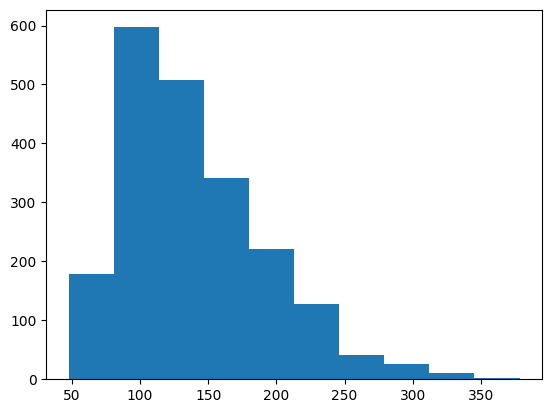

In [99]:
plt.hist(ECGroup[2]['Droplets'].isel(lev = 0))

In [100]:
303/(ECGroup[2]['ActivatedNumberUpdraft2'].isel(lev = 0)/1E6).mean()

<xarray.DataArray 'ActivatedNumberUpdraft2' ()> Size: 8B
array(1.64156458)
Coordinates:
    lev      float32 4B 998.9
    station  <U6 24B 'SMR-II'
    Dx       float64 8B 0.03765
    index    <U19 76B 'Cluster 2 Updraft 1'

In [101]:
368/(ECGroup[2]['ActivatedNumberUpdraft2CC'].isel(lev = 0)/1E6).mean()

<xarray.DataArray 'ActivatedNumberUpdraft2CC' ()> Size: 8B
array(1.58769864)
Coordinates:
    lev      float32 4B 998.9
    station  <U6 24B 'SMR-II'
    Dx       float64 8B 0.03765
    index    <U19 76B 'Cluster 2 Updraft 1'

In [102]:
(ECGroup[0]['ActivatedNumberUpdraft1'].isel(lev = 0)/1E6).mean()

<xarray.DataArray 'ActivatedNumberUpdraft1' ()> Size: 8B
array(110.95467624)
Coordinates:
    lev      float32 4B 998.9
    station  <U6 24B 'SMR-II'
    Dx       float64 8B 0.03765
    index    <U19 76B 'Cluster 2 Updraft 1'

In [103]:
ECCDNC_ds['NoCC CDNC ($cm^{-3}$)'].values[0:6]

array([644., 300., 207., 394., 496., 198.])

In [104]:
for i in range(6):
    print(f'Updraft 1 Cluster {i+1} Activated Percent= {(ECGroup[i]['ActivatedNumberUpdraft1'].isel(lev = 0)/1E6).median()/np.float64(ECCDNC_ds['NoCC CDNC ($cm^{-3}$)'][i])*100:.2f}\
    and with CC  = {(ECGroup[i]['ActivatedNumberUpdraft1CC'].isel(lev = 0)/1E6).median()/np.float64(ECCDNC_ds['CC CDNC ($cm^{-3}$)'][i])*100:.2f}')
    print(f'Updraft 2 Cluster {i+1} Activated Percent= {(ECGroup[i]['ActivatedNumberUpdraft2'].isel(lev = 0)/1E6).median()/np.float64(ECCDNC_ds['NoCC CDNC ($cm^{-3}$)'][i+6])*100:.2f}\
    and with CC  = {(ECGroup[i]['ActivatedNumberUpdraft2CC'].isel(lev = 0)/1E6).median()/np.float64(ECCDNC_ds['CC CDNC ($cm^{-3}$)'][i+12])*100:.2f}')
    print(f'Updraft 3 Cluster {i+1} Activated Percent= {(ECGroup[i]['ActivatedNumberUpdraft3'].isel(lev = 0)/1E6).median()/np.float64(ECCDNC_ds['NoCC CDNC ($cm^{-3}$)'][i+6])*100:.2f}\
    and with CC  = {(ECGroup[i]['ActivatedNumberUpdraft3CC'].isel(lev = 0)/1E6).median()/np.float64(ECCDNC_ds['CC CDNC ($cm^{-3}$)'][i+12])*100:.2f}')


Updraft 1 Cluster 1 Activated Percent= 16.11    and with CC  = nan
Updraft 2 Cluster 1 Activated Percent= 29.99    and with CC  = 34.01
Updraft 3 Cluster 1 Activated Percent= 56.26    and with CC  = 61.84
Updraft 1 Cluster 2 Activated Percent= 32.97    and with CC  = 39.31
Updraft 2 Cluster 2 Activated Percent= 54.64    and with CC  = 46.28
Updraft 3 Cluster 2 Activated Percent= 69.99    and with CC  = 65.48
Updraft 1 Cluster 3 Activated Percent= 53.04    and with CC  = 56.41
Updraft 2 Cluster 3 Activated Percent= 60.49    and with CC  = 53.71
Updraft 3 Cluster 3 Activated Percent= 72.79    and with CC  = 66.38
Updraft 1 Cluster 4 Activated Percent= 26.36    and with CC  = 28.98
Updraft 2 Cluster 4 Activated Percent= 48.11    and with CC  = 39.51
Updraft 3 Cluster 4 Activated Percent= 70.62    and with CC  = 61.97
Updraft 1 Cluster 5 Activated Percent= 23.31    and with CC  = 24.54
Updraft 2 Cluster 5 Activated Percent= 39.60    and with CC  = 34.28
Updraft 3 Cluster 5 Activated Percen

In [105]:
ECActivatedPercentUp1 = []
ECActivatedPercentUp1CC = []
ECActivatedPercentUp2 = []
ECActivatedPercentUp2CC = []
ECActivatedPercentUp3 = []
ECActivatedPercentUp3CC = []

for i in range(6):
    ECActivatedPercentUp1.append((ECGroup[i]['ActivatedNumberUpdraft1'].isel(lev = 0)/1E6).median()/np.float64(ECCDNC_ds['NoCC CDNC ($cm^{-3}$)'][i])*100)
    ECActivatedPercentUp1CC.append((ECGroup[i]['ActivatedNumberUpdraft1CC'].isel(lev = 0)/1E6).median()/np.float64(ECCDNC_ds['CC CDNC ($cm^{-3}$)'][i])*100)
    ECActivatedPercentUp2.append((ECGroup[i]['ActivatedNumberUpdraft2'].isel(lev = 0)/1E6).median()/np.float64(ECCDNC_ds['NoCC CDNC ($cm^{-3}$)'][i+6])*100)
    ECActivatedPercentUp2CC.append((ECGroup[i]['ActivatedNumberUpdraft2CC'].isel(lev = 0)/1E6).median()/np.float64(ECCDNC_ds['CC CDNC ($cm^{-3}$)'][i+12])*100)
    ECActivatedPercentUp3.append((ECGroup[i]['ActivatedNumberUpdraft3'].isel(lev = 0)/1E6).median()/np.float64(ECCDNC_ds['NoCC CDNC ($cm^{-3}$)'][i+6])*100)
    ECActivatedPercentUp3CC.append((ECGroup[i]['ActivatedNumberUpdraft3CC'].isel(lev = 0)/1E6).median()/np.float64(ECCDNC_ds['CC CDNC ($cm^{-3}$)'][i+12])*100)


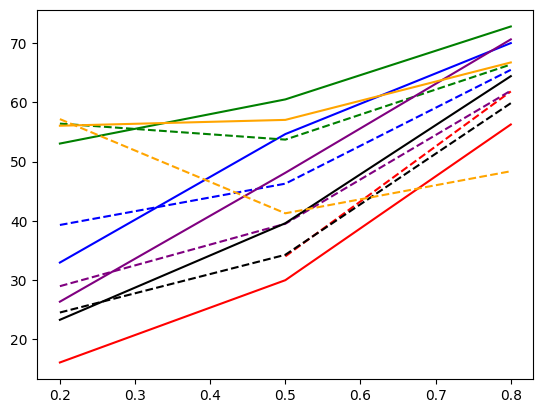

In [106]:
xposition = [0.2,0.5,0.8]
colors = ['red','blue','green','purple','black','orange']
for i in range(6):
    color = colors[i % len(colors)] 
    plt.plot(xposition, [np.float64(ECActivatedPercentUp1[i]),np.float64(ECActivatedPercentUp2[i]),np.float64(ECActivatedPercentUp3[i])], color = color)
    plt.plot(xposition, [np.float64(ECActivatedPercentUp1CC[i]),np.float64(ECActivatedPercentUp2CC[i]),np.float64(ECActivatedPercentUp3CC[i])] ,color = color, linestyle = '--')

In [107]:
for i in range(4):
    print(f'Updraft 1 Cluster {i+1} Activated Percent= {(NorGroup[i]['ActivatedNumberUpdraft1'].isel(lev = -1)).median()/np.float64(NorCDNC_ds['NoCC CDNC ($cm^{-3}$)'][i])*100:.2f}\
    and with CC  = {(NorGroup[i]['ActivatedNumberUpdraft1CC'].isel(lev = -1)).median()/np.float64(NorCDNC_ds['CC CDNC ($cm^{-3}$)'][i])*100:.2f}')
    print(f'Updraft 2 Cluster {i+1} Activated Percent= {(NorGroup[i]['ActivatedNumberUpdraft2'].isel(lev = -1)).median()/np.float64(NorCDNC_ds['NoCC CDNC ($cm^{-3}$)'][i+4])*100:.2f}\
    and with CC  = {(NorGroup[i]['ActivatedNumberUpdraft2CC'].isel(lev = -1)).median()/np.float64(NorCDNC_ds['CC CDNC ($cm^{-3}$)'][i+8])*100:.2f}')
    print(f'Updraft 3 Cluster {i+1} Activated Percent= {(NorGroup[i]['ActivatedNumberUpdraft3'].isel(lev = -1)).median()/np.float64(NorCDNC_ds['NoCC CDNC ($cm^{-3}$)'][i+4])*100:.2f}\
    and with CC  = {(NorGroup[i]['ActivatedNumberUpdraft3CC'].isel(lev = -1)).median()/np.float64(NorCDNC_ds['CC CDNC ($cm^{-3}$)'][i+8])*100:.2f}')


Updraft 1 Cluster 1 Activated Percent= 13.64    and with CC  = 12.65
Updraft 2 Cluster 1 Activated Percent= 12.53    and with CC  = 9.15
Updraft 3 Cluster 1 Activated Percent= 20.86    and with CC  = 18.19
Updraft 1 Cluster 2 Activated Percent= 15.31    and with CC  = 16.73
Updraft 2 Cluster 2 Activated Percent= 20.68    and with CC  = 16.86
Updraft 3 Cluster 2 Activated Percent= 32.40    and with CC  = 30.32
Updraft 1 Cluster 3 Activated Percent= 8.81    and with CC  = 7.38
Updraft 2 Cluster 3 Activated Percent= 8.13    and with CC  = 6.31
Updraft 3 Cluster 3 Activated Percent= 14.56    and with CC  = 11.27
Updraft 1 Cluster 4 Activated Percent= 30.52    and with CC  = 28.82
Updraft 2 Cluster 4 Activated Percent= 43.43    and with CC  = 44.11
Updraft 3 Cluster 4 Activated Percent= 62.83    and with CC  = 61.89


In [108]:
NorActivatedPercentUp1 = []
NorActivatedPercentUp1CC = []
NorActivatedPercentUp2 = []
NorActivatedPercentUp2CC = []
NorActivatedPercentUp3 = []
NorActivatedPercentUp3CC = []

for i in range(4):
    NorActivatedPercentUp1.append((NorGroup[i]['ActivatedNumberUpdraft1'].isel(lev = -1)).median()/np.float64(NorCDNC_ds['NoCC CDNC ($cm^{-3}$)'][i])*100)
    NorActivatedPercentUp1CC.append((NorGroup[i]['ActivatedNumberUpdraft1CC'].isel(lev = -1)).median()/np.float64(NorCDNC_ds['CC CDNC ($cm^{-3}$)'][i])*100)
    NorActivatedPercentUp2.append((NorGroup[i]['ActivatedNumberUpdraft2'].isel(lev = -1)).median()/np.float64(NorCDNC_ds['NoCC CDNC ($cm^{-3}$)'][i+4])*100)
    NorActivatedPercentUp2CC.append((NorGroup[i]['ActivatedNumberUpdraft2CC'].isel(lev = -1)).median()/np.float64(NorCDNC_ds['CC CDNC ($cm^{-3}$)'][i+8])*100)
    NorActivatedPercentUp3.append((NorGroup[i]['ActivatedNumberUpdraft3'].isel(lev =-1)).median()/np.float64(NorCDNC_ds['NoCC CDNC ($cm^{-3}$)'][i+4])*100)
    NorActivatedPercentUp3CC.append((NorGroup[i]['ActivatedNumberUpdraft3CC'].isel(lev = -1)).median()/np.float64(NorCDNC_ds['CC CDNC ($cm^{-3}$)'][i+8])*100)

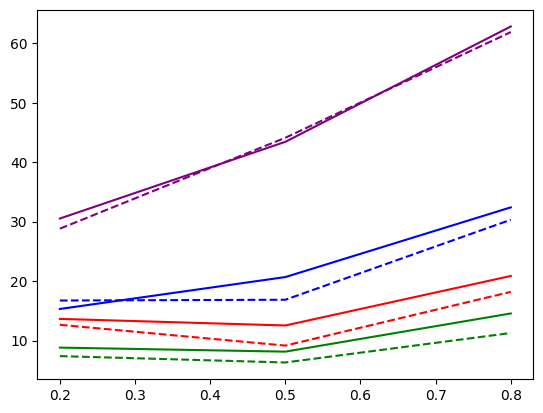

In [109]:
xposition = [0.2,0.5,0.8]
colors = ['red','blue','green','purple']
for i in range(4):
    color = colors[i % len(colors)] 
    plt.plot(xposition, [np.float64(NorActivatedPercentUp1[i]),np.float64(NorActivatedPercentUp2[i]),np.float64(NorActivatedPercentUp3[i])], color = color)
    plt.plot(xposition, [np.float64(NorActivatedPercentUp1CC[i]),np.float64(NorActivatedPercentUp2CC[i]),np.float64(NorActivatedPercentUp3CC[i])] ,color = color, linestyle = '--')

In [110]:
(ECGroup[i]['ActivatedNumberUpdraft1'].isel(lev = 0)/1E6).median()/np.float64(ECCDNC_ds['NoCC CDNC ($cm^{-3}$)'][i])*100

<xarray.DataArray 'ActivatedNumberUpdraft1' ()> Size: 8B
array(26.36481896)
Coordinates:
    lev      float32 4B 998.9
    station  <U6 24B 'SMR-II'
    Dx       float64 8B 0.03765
    index    <U19 76B 'Cluster 2 Updraft 1'

In [111]:

((ECGroup[2]['Tot_dis'].isel(lev = 0).where(ECearth_ds['D']>ECActR[2]).sum('D')*dx[0])/1E6).dropna('time').mean()

<xarray.DataArray ()> Size: 8B
array(113.31890216)
Coordinates:
    lev      float32 4B 998.9
    station  <U6 24B 'SMR-II'
    Dx       float64 8B 0.03765
    index    <U19 76B 'Cluster 2 Updraft 1'
    D        float64 8B 0.3162

In [112]:
CCN = []
CCNCC = []
for i in range(6):
    CCN.append((ECGroup[i]['ActivatedNumberUpdraft1'].isel(lev = 0)/1E6).mean())
    CCNCC.append((ECGroup[i]['ActivatedNumberUpdraft1CC'].isel(lev = 0)/1E6).mean())
for i in range(6):
    CCN.append((ECGroup[i]['ActivatedNumberUpdraft2'].isel(lev = 0)/1E6).mean())
    CCNCC.append((ECGroup[i]['ActivatedNumberUpdraft2CC'].isel(lev = 0)/1E6).mean())
for i in range(6):
    CCN.append((ECGroup[i]['ActivatedNumberUpdraft3'].isel(lev = 0)/1E6).mean())
    CCNCC.append((ECGroup[i]['ActivatedNumberUpdraft3CC'].isel(lev = 0)/1E6).mean())
NorCCN = []
NorCCNCC = []
for i in range(4):
    NorCCN.append((NorGroup[i]['ActivatedNumberUpdraft1'].isel(lev = -1)).mean())
    NorCCNCC.append((NorGroup[i]['ActivatedNumberUpdraft1CC'].isel(lev = -1)).mean())
for i in range(4):
    NorCCN.append((NorGroup[i]['ActivatedNumberUpdraft2'].isel(lev = -1)).mean())
    NorCCNCC.append((NorGroup[i]['ActivatedNumberUpdraft2CC'].isel(lev = -1)).mean())
for i in range(4):
    NorCCN.append((NorGroup[i]['ActivatedNumberUpdraft3'].isel(lev = -1)).mean())
    NorCCNCC.append((NorGroup[i]['ActivatedNumberUpdraft3CC'].isel(lev = -1)).mean())


In [113]:
CCN = []
CCNCC = []
for i in range(6):
    CCN.append((ECGroup[i]['ActivatedNumberUpdraft1'].isel(lev = 0)/1E6).median())
    CCNCC.append((ECGroup[i]['ActivatedNumberUpdraft1CC'].isel(lev = 0)/1E6).median())
for i in range(6):
    CCN.append((ECGroup[i]['ActivatedNumberUpdraft2'].isel(lev = 0)/1E6).median())
    CCNCC.append((ECGroup[i]['ActivatedNumberUpdraft2CC'].isel(lev = 0)/1E6).median())
for i in range(6):
    CCN.append((ECGroup[i]['ActivatedNumberUpdraft3'].isel(lev = 0)/1E6).median())
    CCNCC.append((ECGroup[i]['ActivatedNumberUpdraft3CC'].isel(lev = 0)/1E6).median())
NorCCN = []
NorCCNCC = []
for i in range(4):
    NorCCN.append((NorGroup[i]['ActivatedNumberUpdraft1'].isel(lev = -1)).median())
    NorCCNCC.append((NorGroup[i]['ActivatedNumberUpdraft1CC'].isel(lev = -1)).median())
for i in range(4):
    NorCCN.append((NorGroup[i]['ActivatedNumberUpdraft2'].isel(lev = -1)).median())
    NorCCNCC.append((NorGroup[i]['ActivatedNumberUpdraft2CC'].isel(lev = -1)).median())
for i in range(4):
    NorCCN.append((NorGroup[i]['ActivatedNumberUpdraft3'].isel(lev = -1)).median())
    NorCCNCC.append((NorGroup[i]['ActivatedNumberUpdraft3CC'].isel(lev = -1)).median())


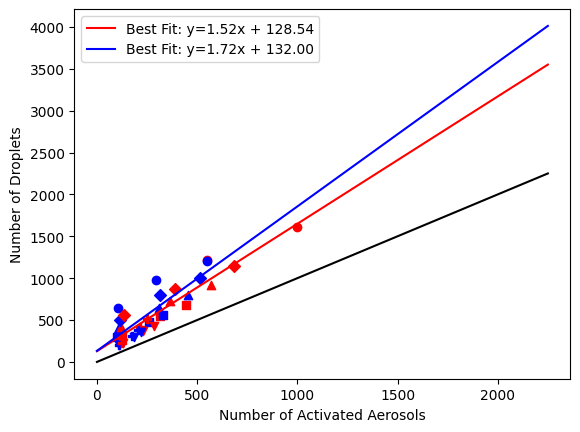

In [114]:
x = np.linspace(0, 2250,10)
slopeNoCC, interceptNoCC = np.polyfit(CCN,ECCDNC_ds['NoCC CDNC ($cm^{-3}$)'], 1)
slopeCC, interceptCC = np.polyfit(CCNCC[1:],ECCDNC_ds['CC CDNC ($cm^{-3}$)'][1:], 1)
lineCC = slopeCC * x + interceptCC
line = slopeNoCC * x + interceptNoCC
markers = ['o', 's', 'v', '^', 'D', 'P']
for i in range(18):
    plt.scatter(CCN[i],ECCDNC_ds['NoCC CDNC ($cm^{-3}$)'][i], marker = markers[i % 6], color = 'blue')
    plt.scatter(CCNCC[i],ECCDNC_ds['CC CDNC ($cm^{-3}$)'][i], marker = markers[i % 6], color = 'red')
plt.plot(x, lineCC, 'r-', label=f'Best Fit: y={slopeCC:.2f}x + {interceptCC:.2f}')

plt.plot(x, line, 'b-', label=f'Best Fit: y={slopeNoCC:.2f}x + {interceptNoCC:.2f}')

plt.xlabel('Number of Activated Aerosols')
plt.ylabel('Number of Droplets')
plt.legend()
plt.plot(x, x, color ='black', label='x = y')


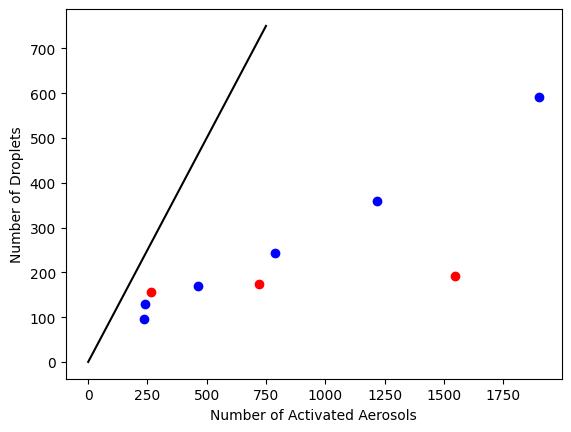

In [115]:
x = np.linspace(0, 750,10)

for i in range(6):
    plt.scatter(ECGroup[i]['TotN70'].isel(lev = 0).median()/1E6,ECGroup[i]['Droplets'].isel(lev = 0).median(), color = 'blue')
for i in range(4):
    plt.scatter(NorGroup[i]['TotN70'].isel(lev = -1).median(),NorGroup[i]['Droplets'].isel(lev = -1).median(), color = 'red')
plt.xlabel('Number of Activated Aerosols')
plt.ylabel('Number of Droplets')
plt.plot(x, x, color ='black', label='x = y')

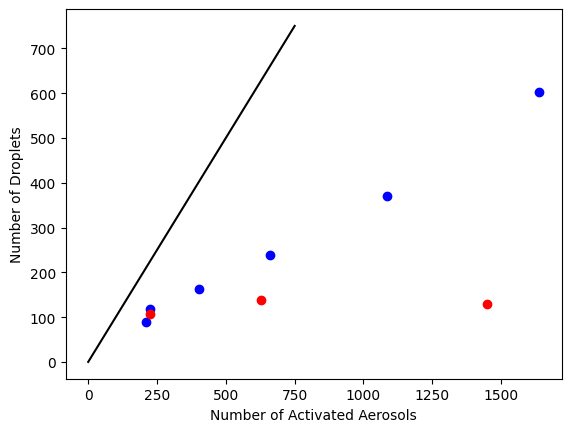

In [116]:
x = np.linspace(0, 750,10)

for i in range(6):
    plt.scatter(ECGroup[i]['TotN70'].isel(lev = 1).median()/1E6,ECGroup[i]['Droplets'].isel(lev = 1).median(), color = 'blue')
for i in range(4):
    plt.scatter(NorGroup[i]['TotN70'].isel(lev = -2).median(),NorGroup[i]['Droplets'].isel(lev = -2).median(), color = 'red')
plt.xlabel('Number of Activated Aerosols')
plt.ylabel('Number of Droplets')
plt.plot(x, x, color ='black', label='x = y')

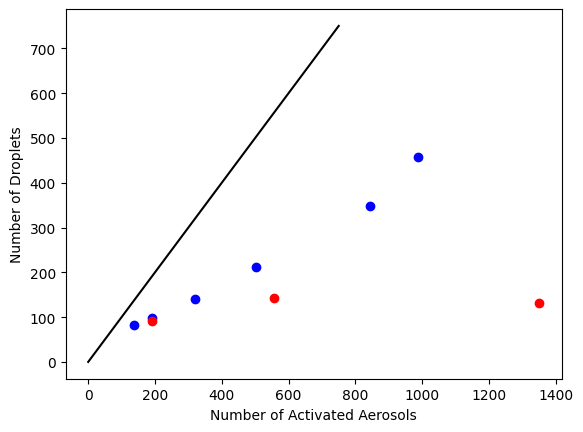

In [117]:
x = np.linspace(0, 750,10)

for i in range(6):
    plt.scatter(ECGroup[i]['TotN70'].isel(lev = 2).median()/1E6,ECGroup[i]['Droplets'].isel(lev = 2).median(), color = 'blue')
for i in range(4):
    plt.scatter(NorGroup[i]['TotN70'].isel(lev = -3).median(),NorGroup[i]['Droplets'].isel(lev = -3).median(), color = 'red')
plt.xlabel('Number of Activated Aerosols')
plt.ylabel('Number of Droplets')
plt.plot(x, x, color ='black', label='x = y')

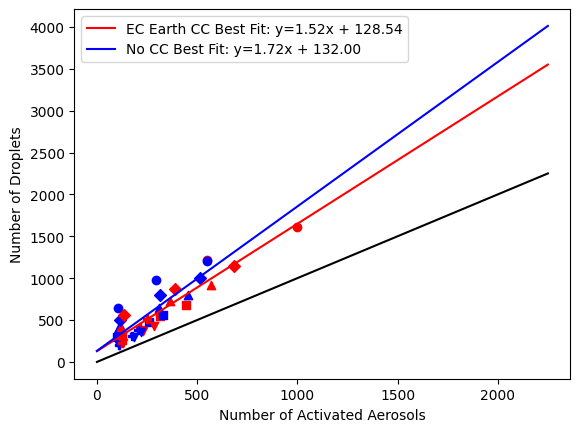

In [118]:
x = np.linspace(0, 2250,10)
slopeNoCC, interceptNoCC = np.polyfit(CCN,ECCDNC_ds['NoCC CDNC ($cm^{-3}$)'], 1)
slopeCC, interceptCC = np.polyfit(CCNCC[1:],ECCDNC_ds['CC CDNC ($cm^{-3}$)'][1:], 1)
lineCC = slopeCC * x + interceptCC
line = slopeNoCC * x + interceptNoCC
markers = ['o', 's', 'v', '^', 'D', 'P']
for i in range(18):
    plt.scatter(CCN[i],ECCDNC_ds['NoCC CDNC ($cm^{-3}$)'][i], marker = markers[i % 6], color = 'blue')
    plt.scatter(CCNCC[i],ECCDNC_ds['CC CDNC ($cm^{-3}$)'][i], marker = markers[i % 6], color = 'red')
plt.plot(x, lineCC, 'r-', label=f'EC Earth CC Best Fit: y={slopeCC:.2f}x + {interceptCC:.2f}')

plt.plot(x, line, 'b-', label=f'No CC Best Fit: y={slopeNoCC:.2f}x + {interceptNoCC:.2f}')

plt.xlabel('Number of Activated Aerosols')
plt.ylabel('Number of Droplets')
plt.legend()
plt.plot(x, x, color ='black', label='x = y')


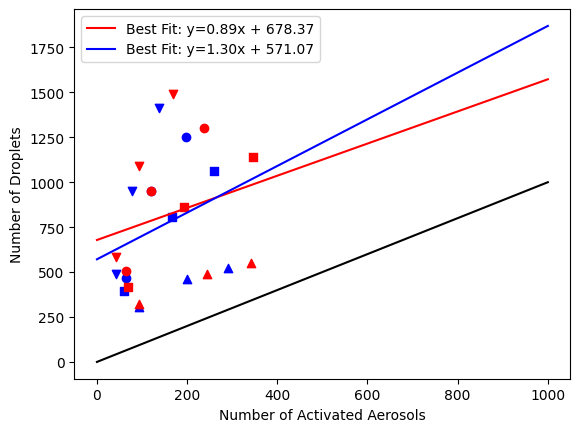

In [119]:
x = np.linspace(0, 1000,10)
NorslopeNoCC, NorinterceptNoCC = np.polyfit(NorCCN,NorCDNC_ds['NoCC CDNC ($cm^{-3}$)'], 1)
NorslopeCC, NorinterceptCC = np.polyfit(NorCCNCC[1:],NorCDNC_ds['CC CDNC ($cm^{-3}$)'][1:], 1)
NorlineCC = NorslopeCC * x + NorinterceptCC
Norline = NorslopeNoCC * x + NorinterceptNoCC
markers = ['o', 's', 'v', '^']
for i in range(12):
    plt.scatter(NorCCN[i],NorCDNC_ds['NoCC CDNC ($cm^{-3}$)'][i], marker = markers[i % 4], color = 'blue')
    plt.scatter(NorCCNCC[i],NorCDNC_ds['CC CDNC ($cm^{-3}$)'][i], marker = markers[i % 4], color = 'red')
plt.plot(x, NorlineCC, 'r-', label=f'Best Fit: y={NorslopeCC:.2f}x + {NorinterceptCC:.2f}')

plt.plot(x, Norline, 'b-', label=f'Best Fit: y={NorslopeNoCC:.2f}x + {NorinterceptNoCC:.2f}')

plt.xlabel('Number of Activated Aerosols')
plt.ylabel('Number of Droplets')
plt.legend()
plt.plot(x, x, color ='black', label='x = y')


In [120]:
slopeNoCC

np.float64(1.7242013293031946)

In [121]:
from scipy.stats import linregress

slope, intercept, r_value, p_value, std_err = linregress(CCN, np.float64(ECCDNC_ds['NoCC CDNC ($cm^{-3}$)']))
                                        


In [122]:
slope

np.float64(1.7242013293031953)

In [123]:
r_value

np.float64(0.8398155602822471)

In [124]:
print(np.float64(CCN)[0:6])
print(np.float64(CCN)[6:12])
print(np.float64(CCN)[12:18])

[103.74889327  98.90069228 109.79903843 103.87738669 115.61164168
 110.97749214]
[293.03696611 259.01018904 183.29412734 307.90559074 315.25175105
 173.96099326]
[549.6688854  331.76481802 220.56774839 451.95070095 512.7210423
 203.51727032]


In [125]:
np.float64(ECCDNC_ds['NoCC CDNC ($cm^{-3}$)'])

array([ 644.,  300.,  207.,  394.,  496.,  198.,  977.,  474.,  303.,
        640.,  796.,  305., 1209.,  564.,  356.,  798., 1000.,  380.])

In [126]:
ECGroup[1]['ActivatedNumberUpdraft1'].mean()/1E6

<xarray.DataArray 'ActivatedNumberUpdraft1' ()> Size: 8B
array(17.41874504)
Coordinates:
    station  <U6 24B 'SMR-II'
    Dx       float64 8B 0.03765
    index    <U19 76B 'Cluster 2 Updraft 1'

In [127]:
np.float64(CCN)

array([103.74889327,  98.90069228, 109.79903843, 103.87738669,
       115.61164168, 110.97749214, 293.03696611, 259.01018904,
       183.29412734, 307.90559074, 315.25175105, 173.96099326,
       549.6688854 , 331.76481802, 220.56774839, 451.95070095,
       512.7210423 , 203.51727032])

In [128]:
np.float64(CCNCC)

array([         nan, 126.17486895, 128.0446592 , 120.8515429 ,
       136.91980826, 126.33461123, 549.6688854 , 313.28549782,
       230.40617867, 364.31028966, 391.09593335, 213.00131129,
       999.30922892, 443.30287447, 284.77228905, 571.32574246,
       682.95708414, 249.60658323])

In [129]:
ECParsecActivatedNumber = [ 697.98601545,  307.12073215,  216.08362304,  401.490477  ,
        513.97946329,  206.10580896, 1052.50384102,  490.63046998,
        311.71483773,  663.69494594,  845.56783003,  326.74899515,
       1348.06327298,  586.52782858,  367.35097776,  832.36247683,
       1069.92051396,  423.71160092]
ECParsecActivatedNumberCC = [np.nan,  329.1303442 ,  232.55622821,  425.99755994,
        566.19180573,  225.1833819 , 1348.06327298,  568.86663733,
        379.79380959,  754.07533413,  918.28904452,  451.15416564,
       1822.62207734,  705.41044274,  444.90564644,  965.47695031,
       1227.19914176,  580.40515481]

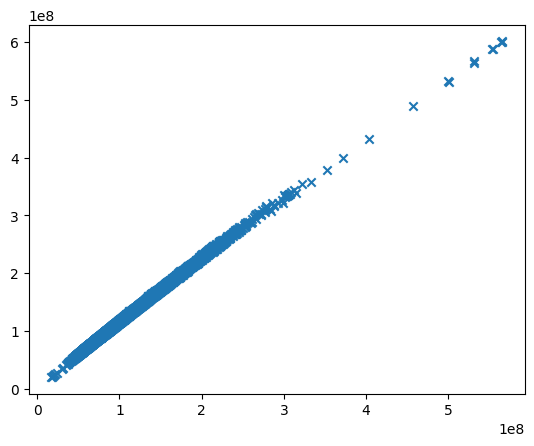

In [130]:
plt.scatter(ECGroup[3]['ActivatedNumberUpdraft1'].isel(lev = 0), ECGroup[3]['ActivatedNumberUpdraft1CC'].isel(lev = 0), marker = 'x',)

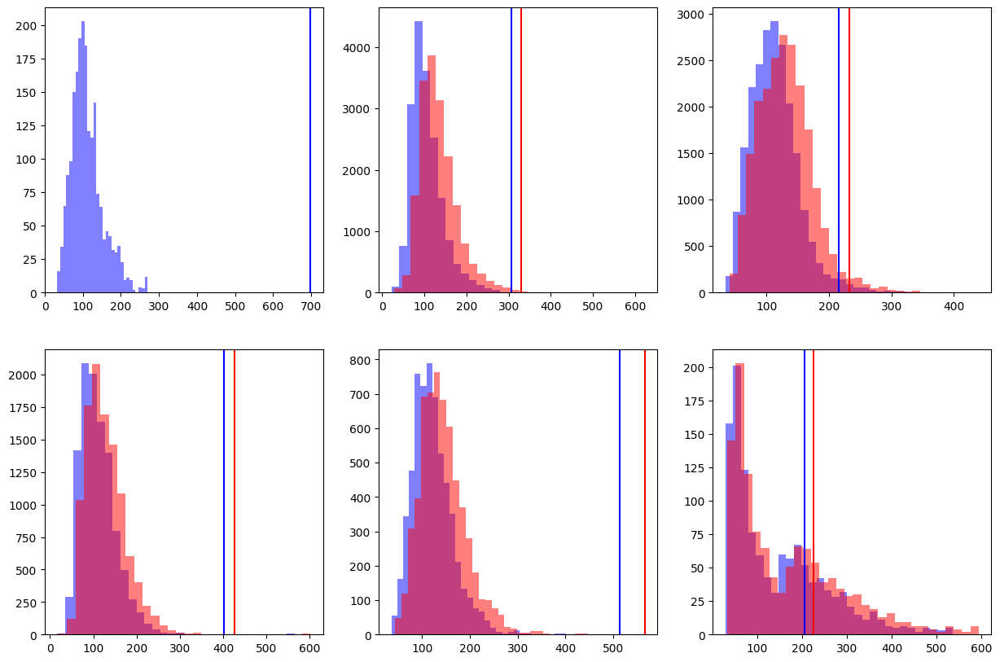

In [131]:
fig = plt.figure(figsize = (15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    if i == 0:
        plt.hist(ECGroup[i]['ActivatedNumberUpdraft1'].isel(lev = 0)/1E6,bins = 30, color = 'blue', alpha = 0.5, label = 'No CC')
        plt.axvline(ECParsecActivatedNumber[i], color = 'blue',label = 'Parsec Activated Number, No CC')
        continue
    plt.subplot(2,3,i+1)
    plt.hist(ECGroup[i]['ActivatedNumberUpdraft1'].isel(lev = 0)/1E6,bins = 30, color = 'blue', alpha = 0.5, label = 'No CC')
    plt.hist(ECGroup[i]['ActivatedNumberUpdraft1CC'].isel(lev = 0)/1E6,bins = 30, color = 'red', alpha = 0.5, label = 'With CC')
    plt.axvline(ECParsecActivatedNumberCC[i], color = 'red', label = 'Parsec Activated Number, No CC')
    plt.axvline(ECParsecActivatedNumber[i], color = 'blue', label = 'Parsec Activated Number, With CC')


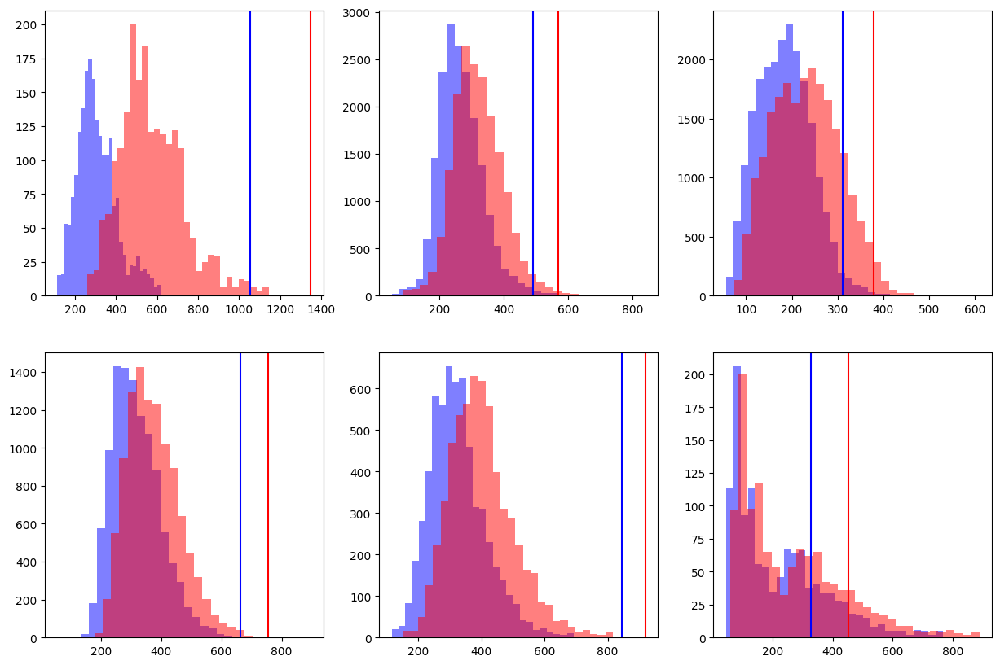

In [132]:
fig = plt.figure(figsize = (15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    plt.hist(ECGroup[i]['ActivatedNumberUpdraft2'].isel(lev = 0)/1E6,bins = 30, color = 'blue', alpha = 0.5, label = 'No CC')
    plt.hist(ECGroup[i]['ActivatedNumberUpdraft2CC'].isel(lev = 0)/1E6,bins = 30, color = 'red', alpha = 0.5, label = 'With CC')
    plt.axvline(ECParsecActivatedNumberCC[i+6], color = 'red', label = 'Parsec Activated Number, No CC')
    plt.axvline(ECParsecActivatedNumber[i+6], color = 'blue', label = 'Parsec Activated Number, With CC')


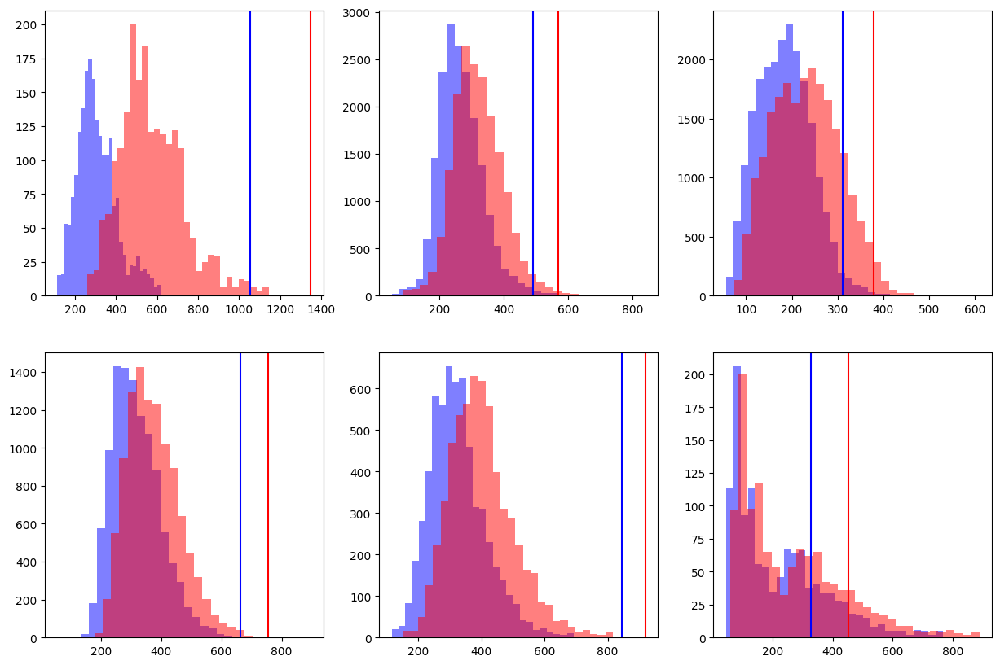

In [133]:
fig = plt.figure(figsize = (15,10))
for i in range(6):
    
    plt.subplot(2,3,i+1)
    plt.hist(ECGroup[i]['ActivatedNumberUpdraft2'].isel(lev = 0)/1E6,bins = 30, color = 'blue', alpha = 0.5, label = 'No CC')
    plt.hist(ECGroup[i]['ActivatedNumberUpdraft2CC'].isel(lev = 0)/1E6,bins = 30, color = 'red', alpha = 0.5, label = 'With CC')
    plt.axvline(ECParsecActivatedNumberCC[i+6], color = 'red', label = 'Parsec Activated Number, No CC')
    plt.axvline(ECParsecActivatedNumber[i+6], color = 'blue', label = 'Parsec Activated Number, With CC')


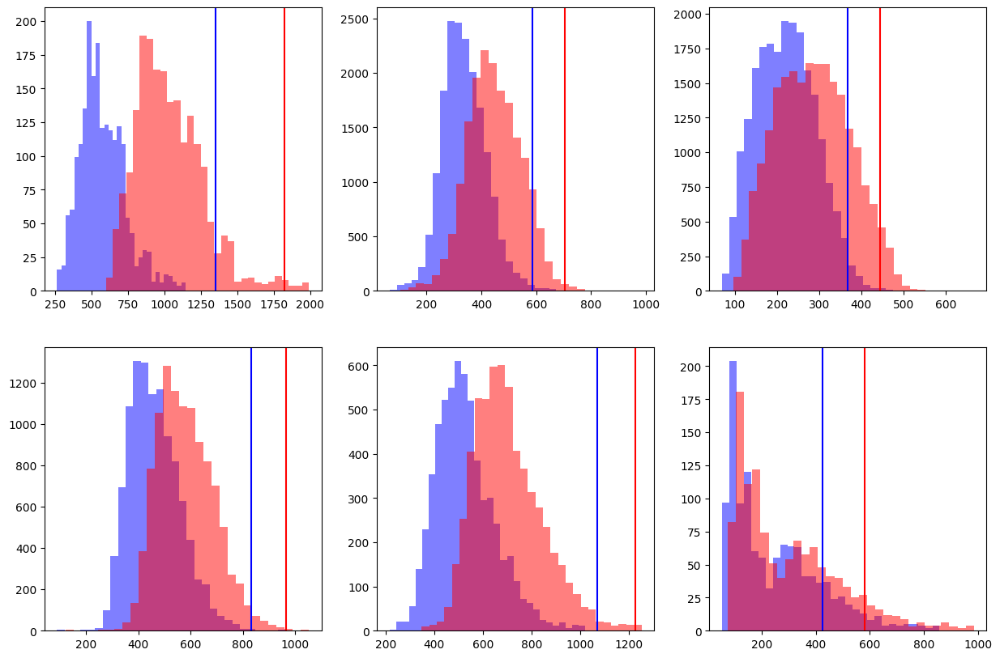

In [134]:
fig = plt.figure(figsize = (15,10))
for i in range(6):
    
    plt.subplot(2,3,i+1)
    plt.hist(ECGroup[i]['ActivatedNumberUpdraft3'].isel(lev = 0)/1E6,bins = 30, color = 'blue', alpha = 0.5, label = 'No CC')
    plt.hist(ECGroup[i]['ActivatedNumberUpdraft3CC'].isel(lev = 0)/1E6,bins = 30, color = 'red', alpha = 0.5, label = 'With CC')
    plt.axvline(ECParsecActivatedNumberCC[i+12], color = 'red', label = 'Parsec Activated Number, No CC')
    plt.axvline(ECParsecActivatedNumber[i+12], color = 'blue', label = 'Parsec Activated Number, With CC')


In [135]:
NorDiameterUp1NoCC = []
NorDiameterUp2NoCC = []
NorDiameterUp3NoCC = []
NorDiameterUp1CC = []
NorDiameterUp2CC = []
NorDiameterUp3CC = []

ListVarNor = [NorDiameterUp1NoCC,NorDiameterUp2NoCC,NorDiameterUp3NoCC,NorDiameterUp1CC,NorDiameterUp2CC,NorDiameterUp3CC]
for z in range(-1,-11,-1):
    ClusterWeight = []
    for i in range(4):
        ClusterWeight.append(len(NorGroup[i]['Droplets'].isel(lev = z).dropna('time'))/len(NorESM_ds['Droplets'].isel(lev = z).dropna('time')))
    for i in range(3):
        ListVarNor[i].append(sum(ClusterWeight*NorActR_df.values[i]))
        ListVarNor[i+3].append(sum(ClusterWeight*NorActR_CC_df.values[i]))


In [136]:
SusUp1 = []
SusUp2 = []
SusUp3 = []
SusUp1CC = []
SusUp2CC = []
SusUp3CC = []
ECSusUp1 = []
ECSusUp2 = []
ECSusUp3 = []
ECSusUp1CC = []
ECSusUp2CC = []
ECSusUp3CC = []
ListNorSus = [SusUp1,SusUp2,SusUp3,SusUp1CC,SusUp2CC,SusUp3CC]
ListECSus = [ECSusUp1,ECSusUp2,ECSusUp3,ECSusUp1CC,ECSusUp2CC,ECSusUp3CC]
for i in range(3):
    for z in range(-1,-11,-1):
        ListNorSus[i].append(Susceptibility(NorESM_ds['Tot_dis'].isel(lev = z).where(NorESM_ds['D']>ListVarNor[i][-z-1]).sum('D')*dx[0].where(NorESM_ds['Droplets'].isel(lev = z)>0).dropna('time'),NorESM_ds['Droplets'].isel(lev = z).dropna('time')))
        if i == 0:
            ListNorSus[i+3].append(Susceptibility(NorESM_ds['Tot_dis'].isel(lev = z).where(NorESM_ds['D']>ListVarNor[i+3][-z-1]).sum('D')*dx[0].where(NorESM_ds['DropletsCCUp1'].isel(lev = z)>0).dropna('time'),NorESM_ds['DropletsCCUp1'].isel(lev = z).dropna('time')))
        if i == 1:
            ListNorSus[i+3].append(Susceptibility(NorESM_ds['Tot_dis'].isel(lev = z).where(NorESM_ds['D']>ListVarNor[i+3][-z-1]).sum('D')*dx[0].where(NorESM_ds['DropletsCCUp2'].isel(lev = z)>0).dropna('time'),NorESM_ds['DropletsCCUp2'].isel(lev = z).dropna('time')))
        if i == 2:
            ListNorSus[i+3].append(Susceptibility(NorESM_ds['Tot_dis'].isel(lev = z).where(NorESM_ds['D']>ListVarNor[i+3][-z-1]).sum('D')*dx[0].where(NorESM_ds['DropletsCCUp3'].isel(lev = z)>0).dropna('time'),NorESM_ds['DropletsCCUp3'].isel(lev = z).dropna('time')))

for i in range(3):
    for z in range(10):
        ListECSus[i].append(Susceptibility(ECearth_ds['Tot_dis'].isel(lev = z).where(ECearth_ds['D']>ListVarEC[i][z]).sum('D')*dx[0].where(ECearth_ds['Droplets'].isel(lev = z)>0).dropna('time'),ECearth_ds['Droplets'].isel(lev = z).dropna('time')))
        if i == 0:
            ListECSus[i+3].append(Susceptibility(ECearth_ds['Tot_dis'].isel(lev = z).where(ECearth_ds['D']>ListVarEC[i+3][z]).sum('D')*dx[0].where(ECearth_ds['DropletsCCUp1'].isel(lev = z)>0).dropna('time'),ECearth_ds['DropletsCCUp1'].isel(lev = z).dropna('time')))
        if i == 1:
            ListECSus[i+3].append(Susceptibility(ECearth_ds['Tot_dis'].isel(lev = z).where(ECearth_ds['D']>ListVarEC[i+3][z]).sum('D')*dx[0].where(ECearth_ds['DropletsCCUp2'].isel(lev = z)>0).dropna('time'),ECearth_ds['DropletsCCUp2'].isel(lev = z).dropna('time')))
        if i == 2:
            ListECSus[i+3].append(Susceptibility(ECearth_ds['Tot_dis'].isel(lev = z).where(ECearth_ds['D']>ListVarEC[i+3][z]).sum('D')*dx[0].where(ECearth_ds['DropletsCCUp3'].isel(lev = z)>0).dropna('time'),ECearth_ds['DropletsCCUp3'].isel(lev = z).dropna('time')))

IndexError: list index out of range

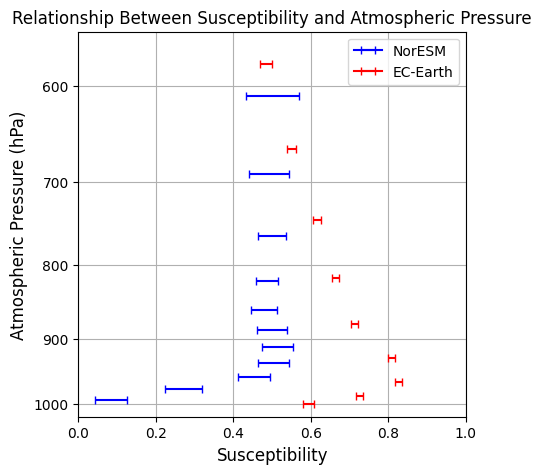

In [137]:
plt.figure(figsize=(5,5))

for i in range(len(LevelSusNor)):
    label_nor = 'NorESM' if i == 1 else None
    label_ec = 'EC-Earth' if i == 1 else None
    plt.errorbar(LevelSusNor[i][0], levelNor[i], xerr=LevelSusNor[i][1]*1.96, fmt='', color='blue', capsize = 3, label=label_nor)
    plt.errorbar(LevelSus[i][0], levelEC[i], xerr=LevelSus[i][1]*1.96, fmt='', color='red', capsize = 3, label=label_ec)

plt.legend()
plt.ylim(1020, 550)
plt.xlim(0, 1)
plt.ylabel('Atmospheric Pressure (hPa)', fontsize=12)
plt.xlabel('Susceptibility', fontsize=12)
plt.grid()
plt.title('Relationship Between Susceptibility and Atmospheric Pressure', fontsize=12)
plt.yscale('log')
plt.yticks([600, 700, 800, 900, 1000], [600, 700, 800, 900, 1000])
plt.show()

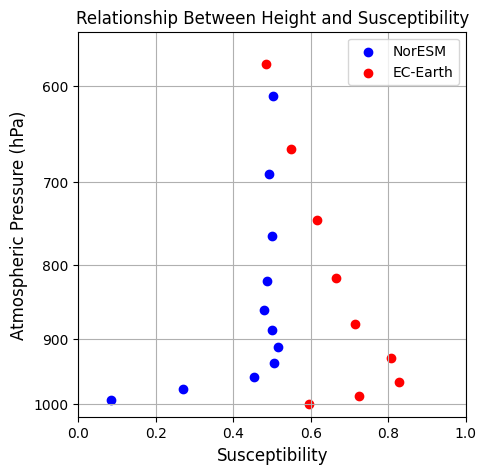

In [138]:
plt.figure(figsize = (5,5))
for i in range(len(LevelSusNor)):
    if i == 1:
        plt.scatter( LevelSusNor[i][0],levelNor[i] , color = 'blue', label = 'NorESM')
        plt.scatter(  LevelSus[i][0],levelEC[i], color = 'red', label = 'EC-Earth')
        continue
    plt.scatter( LevelSusNor[i][0],levelNor[i] , color = 'blue')
    plt.scatter(  LevelSus[i][0],levelEC[i], color = 'red')
plt.legend()
plt.ylim(1020,550)
plt.xlim(0,1)
plt.ylabel('Atmospheric Pressure (hPa)', fontsize = 12)
plt.xlabel('Susceptibility', fontsize = 12)
plt.grid()
plt.title('Relationship Between Height and Susceptibility' , fontsize = 12)
plt.yscale('log')
plt.yticks([600,700,800,900,1000],[600,700,800,900,1000])
plt.show()

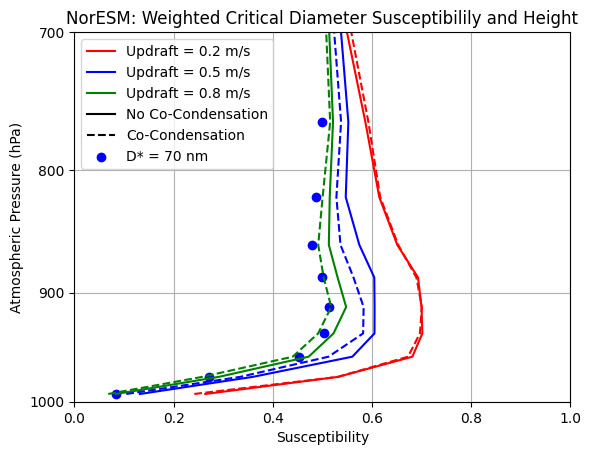

In [139]:
colors =['red','blue','green']
labelNoCC = ['Updraft = 0.2 m/s','Updraft = 0.5 m/s','Updraft = 0.8 m/s']
labelCC = ['Updraft = 0.2 m/s w/ CC','Updraft = 0.5 m/s w/ CC','Updraft = 0.8 m/s w/ CC']

for i in range(6):
    color_ = colors[i%3]
    listofSus = []
    
    for z in range(10):
        listofSus.append(ListNorSus[i][z][0])

    if i <= 2:
        plt.plot(listofSus,levelNor[0:10],color = color_, linestyle = '-', label = labelNoCC[i])
    if i>2:
        plt.plot(listofSus,levelNor[0:10],color = color_, linestyle = '--')
plt.plot([20,20], [20,20] ,color = 'black', linestyle = '-', label = 'No Co-Condensation')
plt.plot([20,20], [20,20] ,color = 'black', linestyle = '--', label = 'Co-Condensation')
for z in range(10):
    if z == 0:
        plt.scatter( LevelSusNor[z][0],levelNor[z] , color = 'blue', label = 'D* = 70 nm')
        continue
    plt.scatter( LevelSusNor[z][0],levelNor[z] , color = 'blue')
plt.ylabel('Atmospheric Pressure (hPa)')
plt.xlabel('Susceptibility')

plt.title('NorESM: Weighted Critical Diameter Susceptibilily and Height')
plt.legend()       
plt.ylim(1000,700)
plt.xlim(0,1)
plt.grid()
plt.yscale('log')
plt.yticks([700,800,900,1000],[700,800,900,1000])
plt.show()

In [140]:
len(ListNorSus)

6

In [141]:

lev1noCCsus = [ListNorSus[0][0][0],ListNorSus[1][0][0],ListNorSus[2][0][0]]
lev1CCsus = [ListNorSus[3][0][0],ListNorSus[4][0][0],ListNorSus[5][0][0]]
lev2noCCsus = [ListNorSus[0][1][0],ListNorSus[1][1][0],ListNorSus[2][1][0]]
lev2CCsus = [ListNorSus[3][1][0],ListNorSus[4][1][0],ListNorSus[5][1][0]]
lev3noCCsus = [ListNorSus[0][2][0],ListNorSus[1][2][0],ListNorSus[2][2][0]]
lev3CCsus = [ListNorSus[3][2][0],ListNorSus[4][2][0],ListNorSus[5][2][0]]
lev1noCCsuserr = [ListNorSus[0][0][1],ListNorSus[1][0][1],ListNorSus[2][0][1]]
lev1CCsuserr = [ListNorSus[3][0][1],ListNorSus[4][0][1],ListNorSus[5][0][1]]
lev2noCCsuserr = [ListNorSus[0][1][1],ListNorSus[1][1][1],ListNorSus[2][1][1]]
lev2CCsuserr = [ListNorSus[3][1][1],ListNorSus[4][1][1],ListNorSus[5][1][1]]
lev3noCCsuserr = [ListNorSus[0][2][1],ListNorSus[1][2][1],ListNorSus[2][2][1]]
lev3CCsuserr = [ListNorSus[3][2][1],ListNorSus[4][2][1],ListNorSus[5][2][1]]

In [142]:

EClev1noCCsus = [ListECSus[0][0][0],ListECSus[1][0][0],ListECSus[2][0][0]]
EClev1CCsus = [ListECSus[3][0][0],ListECSus[4][0][0],ListECSus[5][0][0]]
EClev2noCCsus = [ListECSus[0][1][0],ListECSus[1][1][0],ListECSus[2][1][0]]
EClev2CCsus = [ListECSus[3][1][0],ListECSus[4][1][0],ListECSus[5][1][0]]
EClev3noCCsus = [ListECSus[0][2][0],ListECSus[1][2][0],ListECSus[2][2][0]]
EClev3CCsus = [ListECSus[3][2][0],ListECSus[4][2][0],ListECSus[5][2][0]]
EClev1noCCsuserr = [ListECSus[0][0][1],ListECSus[1][0][1],ListECSus[2][0][1]]
EClev1CCsuserr = [ListECSus[3][0][1],ListECSus[4][0][1],ListECSus[5][0][1]]
EClev2noCCsuserr = [ListECSus[0][1][1],ListECSus[1][1][1],ListECSus[2][1][1]]
EClev2CCsuserr = [ListECSus[3][1][1],ListECSus[4][1][1],ListECSus[5][1][1]]
EClev3noCCsuserr = [ListECSus[0][2][1],ListECSus[1][2][1],ListECSus[2][2][1]]
EClev3CCsuserr = [ListECSus[3][2][1],ListECSus[4][2][1],ListECSus[5][2][1]]

IndexError: list index out of range

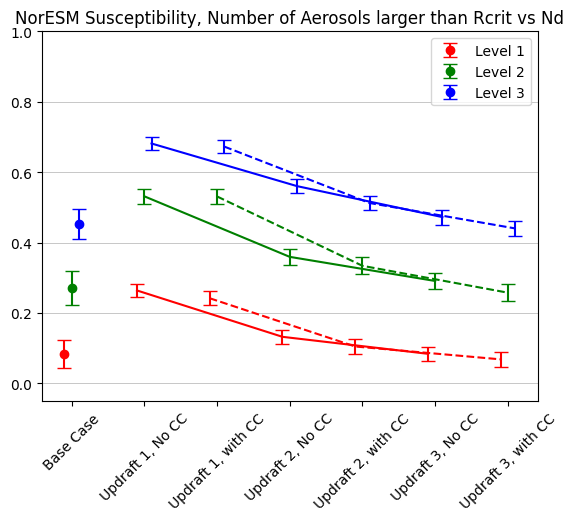

In [146]:
Names = ['Base Case', 'Updraft 1, No CC','Updraft 1, with CC',  'Updraft 2, No CC', 'Updraft 2, with CC', 'Updraft 3, No CC', 'Updraft 3, with CC']
x_positions = [.9,1,1.1,1.9,2,2.1,2.9,3,3.1,3.9,4,4.1,4.9,5,5.1,5.9,6,6.1,6.9,7,7.1]
xpositionslev1 = x_positions[3:None:3]
xpositionslev2 = x_positions[4:None:3]
xpositionslev3 = x_positions[5:None:3]
xnames = np.arange(len(Names))
xnames = xnames +1
colors = ['red', 'green', 'blue']
for i in range(3):
    color = colors[i % len(colors)]
    plt.errorbar(x_positions[i], Sensitivity[i], yerr=Yerr[i], fmt='o', capsize=5, color=color, label = f'Level {i+1}')
plt.errorbar(xpositionslev1[0:None:2],lev1noCCsus, yerr = lev1noCCsuserr,capsize=5, color = 'red')
plt.errorbar(xpositionslev1[1:None:2],lev1CCsus, yerr = lev1CCsuserr,capsize=5, color = 'red', linestyle = '--')
plt.errorbar(xpositionslev2[0:None:2],lev2noCCsus, yerr = lev2noCCsuserr,capsize=5, color = 'green')
plt.errorbar(xpositionslev2[1:None:2],lev2CCsus, yerr = lev2CCsuserr,capsize=5, color = 'green', linestyle = '--')
plt.errorbar(xpositionslev3[0:None:2],lev3noCCsus, yerr = lev3noCCsuserr,capsize=5, color = 'blue')
plt.errorbar(xpositionslev3[1:None:2],lev3CCsus, yerr = lev3CCsuserr,capsize=5, color = 'blue', linestyle = '--')


plt.legend()   
plt.legend()   
plt.ylim([-0.05,1])

plt.xticks(xnames, Names, rotation=45)
plt.grid(True, axis = 'y', which = 'major', linestyle="-", linewidth=0.5)
plt.title('NorESM Susceptibility, Number of Aerosols larger than Rcrit vs Nd')

plt.show()


NameError: name 'EClev1noCCsus' is not defined

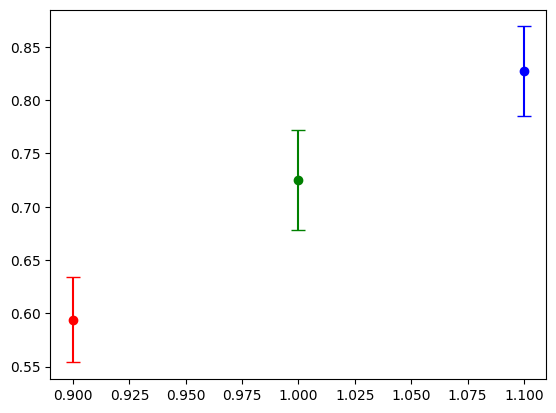

In [144]:
Names = ['Base Case', 'Updraft 1, No CC','Updraft 1, with CC',  'Updraft 2, No CC', 'Updraft 2, with CC', 'Updraft 3, No CC', 'Updraft 3, with CC']
x_positions = [.9,1,1.1,1.9,2,2.1,2.9,3,3.1,3.9,4,4.1,4.9,5,5.1,5.9,6,6.1,6.9,7,7.1]
xpositionslev1 = x_positions[3:None:3]
xpositionslev2 = x_positions[4:None:3]
xpositionslev3 = x_positions[5:None:3]
xnames = np.arange(len(Names))
xnames = xnames +1
colors = ['red', 'green', 'blue']
for i in range(3):
    color = colors[i % len(colors)]
    plt.errorbar(x_positions[i], SensitivityEC[i], yerr=Yerr[i], fmt='o', capsize=5, color=color, label = f'Level {i+1}')
plt.errorbar(xpositionslev1[0:None:2],EClev1noCCsus, yerr = lev1noCCsuserr,capsize=5, color = 'red')
plt.errorbar(xpositionslev1[1:None:2],EClev1CCsus, yerr = lev1CCsuserr,capsize=5, color = 'red', linestyle = '--')
plt.errorbar(xpositionslev2[0:None:2],EClev2noCCsus, yerr = lev2noCCsuserr,capsize=5, color = 'green')
plt.errorbar(xpositionslev2[1:None:2],EClev2CCsus, yerr = lev2CCsuserr,capsize=5, color = 'green', linestyle = '--')
plt.errorbar(xpositionslev3[0:None:2],EClev3noCCsus, yerr = lev3noCCsuserr,capsize=5, color = 'blue')
plt.errorbar(xpositionslev3[1:None:2],EClev3CCsus, yerr = lev3CCsuserr,capsize=5, color = 'blue', linestyle = '--')


plt.legend()   
plt.legend()   
plt.ylim([0.5,.9])

plt.xticks(xnames, Names, rotation=45)
plt.grid(True, axis = 'y', which = 'major', linestyle="-", linewidth=0.5)
plt.title('EC-Earth Susceptibility, Number of Aerosols larger than Rcrit vs Nd')

plt.show()


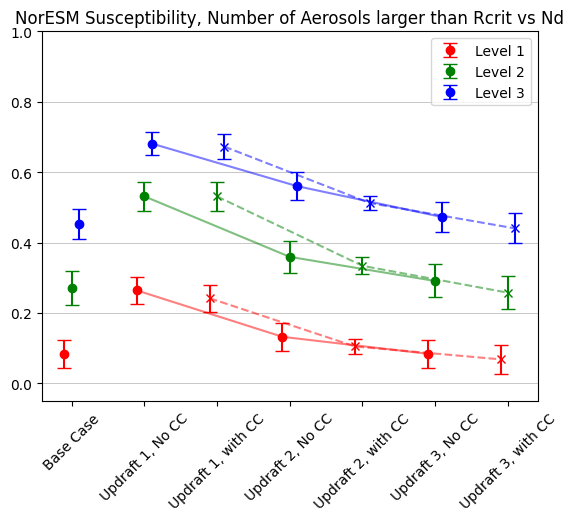

In [147]:
Names = ['Base Case', 'Updraft 1, No CC','Updraft 1, with CC',  'Updraft 2, No CC', 'Updraft 2, with CC', 'Updraft 3, No CC', 'Updraft 3, with CC']
x_positions = [.9,1,1.1,1.9,2,2.1,2.9,3,3.1,3.9,4,4.1,4.9,5,5.1,5.9,6,6.1,6.9,7,7.1]
xnames = np.arange(len(Names))
xnames = xnames +1
colors = ['red', 'green', 'blue']
for i in range(len(x_positions)):
    color = colors[i % len(colors)] 
    if i < 3:
        plt.errorbar(x_positions[i], Sensitivity[i], yerr=Yerr[i], fmt='o', capsize=5, color=color, label = f'Level {i+1}')
    else:
        if i in [3,4,5,9,10,11,15,16,17]:
            plt.errorbar(x_positions[i], Sensitivity[i], yerr=Yerr[i], fmt='o', capsize=5, color=color)
        else:
            plt.errorbar(x_positions[i], Sensitivity[i], yerr=Yerr[i], fmt='x', capsize=5, color=color)
for i in [0,1,2]:
    color = colors[i % len(colors)]
    plt.plot(x_positions[i+3:None:6],Sensitivity[i+3:None:6], linestyle = '-', color = color,  alpha = 0.5)
for i in [3,4,5]:
    color = colors[i % len(colors)]
    plt.plot(x_positions[i+3:None:6],Sensitivity[i+3:None:6], linestyle = '--', color = color,  alpha = 0.5)
plt.legend()   
plt.ylim([-0.05,1])

plt.xticks(xnames, Names, rotation=45)
plt.grid(True, axis = 'y', which = 'major', linestyle="-", linewidth=0.5)
plt.title('NorESM Susceptibility, Number of Aerosols larger than Rcrit vs Nd')

plt.show()


In [148]:
colors =['red','blue','green']
labelNoCC = ['Updraft = 0.2 m/s','Updraft = 0.5 m/s','Updraft = 0.8 m/s']
labelCC = ['Updraft = 0.2 m/s w/ CC','Updraft = 0.5 m/s w/ CC','Updraft = 0.8 m/s w/ CC']

for i in range(6):

    color_ = colors[i%3]
    listofSus = []
    
    for z in range(10):
        listofSus.append(ListECSus[i][z][0])
    if i <= 2:
        plt.plot(listofSus,levelEC[0:10],color = color_, linestyle = '-', label = labelNoCC[i])
    if i>2:
        plt.plot(listofSus,levelEC[0:10],color = color_, linestyle = '--')
plt.plot([20,20], [20,20] ,color = 'black', linestyle = '-', label = 'No Co-Condensation')
plt.plot([20,20], [20,20] ,color = 'black', linestyle = '--', label = 'Co-Condensation')
for z in range(10):
    if z == 0:
        plt.scatter( LevelSus[z][0],levelEC[z] , color = 'red', label = 'D* = 70 nm')
        continue
    plt.scatter( LevelSus[z][0],levelEC[z] , color = 'red') 
plt.legend()       
plt.ylim(1010,700)
plt.title('EC-Earth: Weighted Critical Diameter Susceptibilily and Height')
plt.ylabel('Atmospheric Pressure (hPa)')
plt.xlabel('Susceptibility')
plt.xlim(0,1)
plt.grid()
plt.yscale('log')
plt.yticks([700,800,900,1000],[700,800,900,1000])
plt.show()

IndexError: list index out of range

In [149]:
ECearth_ds

<xarray.Dataset> Size: 3GB
Dimensions:                    (lev: 34, time: 59903, D: 200)
Coordinates:
  * lev                        (lev) float32 136B 998.9 987.3 ... 0.4877 0.1071
    station                    <U6 24B 'SMR-II'
  * time                       (time) datetime64[ns] 479kB 2012-01-01 ... 201...
    time_orig                  (time) datetime64[ns] 479kB 2012-01-01T00:30:0...
  * D                          (D) float64 2kB 0.3162 0.3331 ... 9.493e+03 1e+04
    Dx                         float64 8B 0.03765
    index                      <U19 76B 'Cluster 2 Updraft 1'
Data variables: (12/32)
    Tot_dis                    (D, time, lev) float64 3GB ...
    label                      (time) int32 240kB 3 3 3 4 4 4 4 ... 4 3 3 3 3 3
    DropletsCCUp1              (time, lev) float64 16MB nan nan nan ... nan nan
    DropletsCCUp2              (time, lev) float64 16MB nan nan nan ... nan nan
    DropletsCCUp3              (time, lev) float64 16MB nan nan nan ... nan nan
    Droplets                   (time, lev) float32 8MB ...
    ...                         ...
    Lev1Up2CC                  (time) float64 479kB 4.6e+08 ... 5.439e+08
    Lev2Up2CC                  (time) float64 479kB 2.562e+08 ... 5.043e+08
    Lev3Up2CC                  (time) float64 479kB 1.185e+08 ... 3.573e+08
    Lev1Up3CC                  (time) float64 479kB 6.669e+08 ... 7.416e+08
    Lev2Up3CC                  (time) float64 479kB 3.681e+08 ... 6.901e+08
    Lev3Up3CC                  (time) float64 479kB 1.706e+08 ... 4.924e+08

In [150]:
NorDiameterUp1NoCC = []
NorDiameterUp2NoCC = []
NorDiameterUp3NoCC = []
NorDiameterUp1CC = []
NorDiameterUp2CC = []
NorDiameterUp3CC = []

ListVarNor_ = [NorDiameterUp1NoCC,NorDiameterUp2NoCC,NorDiameterUp3NoCC,NorDiameterUp1CC,NorDiameterUp2CC,NorDiameterUp3CC]
ClusterWeight = []
z = -1
for i in range(4):
    ClusterWeight.append(len(NorGroup[i]['Droplets'].isel(lev = z).dropna('time'))/len(NorESM_ds['Droplets'].isel(lev = z).dropna('time')))
for i in range(3):
    ListVarNor_[i].append(sum(ClusterWeight*NorActR_df.values[i]))
    ListVarNor_[i+3].append(sum(ClusterWeight*NorActR_CC_df.values[i]))


In [151]:
NorActR_CC_df

,Cluster 1,Cluster 2,Cluster 3,Cluster 4
Updraft 1,207.549299,171.271798,262.481009,114.168009
Updraft2,164.113631,119.147691,216.602006,74.495905
Updraft 3,138.350216,96.245319,190.563124,60.176425


In [152]:
for i in range(len(ListVarNor_)):
    print(ListVarNor_[i])
for i in range(3):
    print(np.float64(ListVarNor_[i])-np.float64(ListVarNor_[i+3]))
for i in range(3):
    print((np.float64(ListVarNor_[i])-np.float64(ListVarNor_[i+3]))/np.float64(ListVarNor_[i])*100)

[np.float64(122.73468070574994)]
[np.float64(84.01459073010928)]
[np.float64(69.38394494111424)]
[np.float64(117.82251271192558)]
[np.float64(77.50595075048554)]
[np.float64(62.66098717705674)]
[4.91216799]
[6.50863998]
[6.72295776]
[4.00226567]
[7.74703527]
[9.6895006]


In [154]:

ECDiameterUp1NoCC = []
ECDiameterUp2NoCC = []
ECDiameterUp3NoCC = []
ECDiameterUp1CC = []
ECDiameterUp2CC = []
ECDiameterUp3CC = []
ListVarEC_ = [ECDiameterUp1NoCC,ECDiameterUp2NoCC,ECDiameterUp3NoCC,ECDiameterUp1CC,ECDiameterUp2CC,ECDiameterUp3CC]

z = 0
ClusterWeight = []
for i in range(6):
    ClusterWeight.append(len(ECGroup[i]['Droplets'].isel(lev = z).dropna('time'))/len(ECearth_ds['Droplets'].isel(lev = z).dropna('time')))
for i in range(3):
    if i == 0:
        ListVarEC_[i].append(sum(ClusterWeight*ECActR_df.values[i]))
        ListVarEC_[i+3].append(sum(ClusterWeight[1:]*ECActR_CC_df.iloc[0][1:]))
        continue
    ListVarEC_[i].append(sum(ClusterWeight*ECActR_df.values[i]))
    ListVarEC_[i+3].append(sum(ClusterWeight*ECActR_CC_df.values[i]))


In [155]:
for i in range(len(ListVarEC_)):
    print(ListVarEC_[i])
for i in range(3):
    print(np.float64(ListVarEC_[i])-np.float64(ListVarEC_[i+3]))
for i in range(3):    
    print((np.float64(ListVarEC_[i])-np.float64(ListVarEC_[i+3]))/np.float64(ListVarEC_[i])*100)

[np.float64(209.29070073337655)]
[np.float64(134.342208236184)]
[np.float64(105.60550274047667)]
[187.26153577512184]
[np.float64(113.47964752432175)]
[np.float64(82.50197478263759)]
[22.02916496]
[20.86256071]
[23.10352796]
[10.52563008]
[15.52941625]
[21.87720086]


In [156]:
i = 1
np.float64(ListVarEC_[i])-np.float64(ListVarEC_[i+3])

array([20.86256071])

In [157]:
SusUp1 = []
SusUp2 = []
SusUp3 = []
SusUp1CC = []
SusUp2CC = []
SusUp3CC = []
ECSusUp1 = []
ECSusUp2 = []
ECSusUp3 = []
ECSusUp1CC = []
ECSusUp2CC = []
ECSusUp3CC = []
ListNorSus_ = [SusUp1,SusUp2,SusUp3,SusUp1CC,SusUp2CC,SusUp3CC]
ListECSus_ = [ECSusUp1,ECSusUp2,ECSusUp3,ECSusUp1CC,ECSusUp2CC,ECSusUp3CC]
for i in range(3):
    for z in range(-1,-11,-1):
        ListNorSus_[i].append(Susceptibility(NorESM_ds['Tot_dis'].isel(lev = z).where(NorESM_ds['D']>ListVarNor_[i]).sum('D')*dx[0].where(NorESM_ds['Droplets'].isel(lev = z)>0).dropna('time'),NorESM_ds['Droplets'].isel(lev = z).dropna('time')))
        if i == 0:
            ListNorSus_[i+3].append(Susceptibility(NorESM_ds['Tot_dis'].isel(lev = z).where(NorESM_ds['D']>ListVarNor_[i+3]).sum('D')*dx[0].where(NorESM_ds['DropletsCCUp1'].isel(lev = z)>0).dropna('time'),NorESM_ds['DropletsCCUp1'].isel(lev = z).dropna('time')))
        if i == 1:
            ListNorSus_[i+3].append(Susceptibility(NorESM_ds['Tot_dis'].isel(lev = z).where(NorESM_ds['D']>ListVarNor_[i+3]).sum('D')*dx[0].where(NorESM_ds['DropletsCCUp2'].isel(lev = z)>0).dropna('time'),NorESM_ds['DropletsCCUp2'].isel(lev = z).dropna('time')))
        if i == 2:
            ListNorSus_[i+3].append(Susceptibility(NorESM_ds['Tot_dis'].isel(lev = z).where(NorESM_ds['D']>ListVarNor_[i+3]).sum('D')*dx[0].where(NorESM_ds['DropletsCCUp3'].isel(lev = z)>0).dropna('time'),NorESM_ds['DropletsCCUp3'].isel(lev = z).dropna('time')))

for i in range(3):
    for z in range(10):
        ListECSus_[i].append(Susceptibility(ECearth_ds['Tot_dis'].isel(lev = z).where(ECearth_ds['D']>ListVarEC_[i]).sum('D')*dx[0].where(ECearth_ds['Droplets'].isel(lev = z)>0).dropna('time'),ECearth_ds['Droplets'].isel(lev = z).dropna('time')))
        if i == 0:
            ListECSus_[i+3].append(Susceptibility(ECearth_ds['Tot_dis'].isel(lev = z).where(ECearth_ds['D']>ListVarEC_[i+3]).sum('D')*dx[0].where(ECearth_ds['DropletsCCUp1'].isel(lev = z)>0).dropna('time'),ECearth_ds['DropletsCCUp1'].isel(lev = z).dropna('time')))
        if i == 1:
            ListECSus_[i+3].append(Susceptibility(ECearth_ds['Tot_dis'].isel(lev = z).where(ECearth_ds['D']>ListVarEC_[i+3]).sum('D')*dx[0].where(ECearth_ds['DropletsCCUp2'].isel(lev = z)>0).dropna('time'),ECearth_ds['DropletsCCUp2'].isel(lev = z).dropna('time')))
        if i == 2:
            ListECSus_[i+3].append(Susceptibility(ECearth_ds['Tot_dis'].isel(lev = z).where(ECearth_ds['D']>ListVarEC_[i+3]).sum('D')*dx[0].where(ECearth_ds['DropletsCCUp3'].isel(lev = z)>0).dropna('time'),ECearth_ds['DropletsCCUp3'].isel(lev = z).dropna('time')))

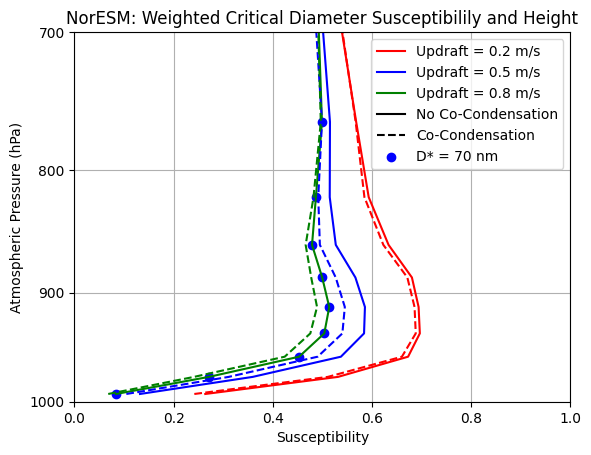

In [158]:
colors =['red','blue','green']
labelNoCC = ['Updraft = 0.2 m/s','Updraft = 0.5 m/s','Updraft = 0.8 m/s']
labelCC = ['Updraft = 0.2 m/s w/ CC','Updraft = 0.5 m/s w/ CC','Updraft = 0.8 m/s w/ CC']

for i in range(6):
    color_ = colors[i%3]
    listofSus = []
    
    for z in range(10):
        listofSus.append(ListNorSus_[i][z][0])

    if i <= 2:
        plt.plot(listofSus,levelNor[0:10],color = color_, linestyle = '-', label = labelNoCC[i])
    if i>2:
        plt.plot(listofSus,levelNor[0:10],color = color_, linestyle = '--')
plt.plot([20,20], [20,20] ,color = 'black', linestyle = '-', label = 'No Co-Condensation')
plt.plot([20,20], [20,20] ,color = 'black', linestyle = '--', label = 'Co-Condensation')
for z in range(10):
    if z == 0:
        plt.scatter( LevelSusNor[z][0],levelNor[z] , color = 'blue', label = 'D* = 70 nm')
        continue
    plt.scatter( LevelSusNor[z][0],levelNor[z] , color = 'blue')
plt.ylabel('Atmospheric Pressure (hPa)')
plt.xlabel('Susceptibility')

plt.title('NorESM: Weighted Critical Diameter Susceptibilily and Height')
plt.legend()       
plt.ylim(1000,700)
plt.xlim(0,1)
plt.grid()
plt.yscale('log')
plt.yticks([700,800,900,1000],[700,800,900,1000])
plt.show()

In [159]:
ListNorSus_[0]

[(np.float64(0.26388053581616316), np.float64(0.019520902706003682)),
 (np.float64(0.5314300234320972), np.float64(0.021345345430741226)),
 (np.float64(0.6727419838398241), np.float64(0.017626971736810056)),
 (np.float64(0.6964426376219519), np.float64(0.015767269601213725)),
 (np.float64(0.6939440414002092), np.float64(0.016645133889639858)),
 (np.float64(0.6804801153364907), np.float64(0.016548325156755576)),
 (np.float64(0.6333770712100227), np.float64(0.016782575792069272)),
 (np.float64(0.5933487131798905), np.float64(0.015139063254201711)),
 (np.float64(0.5681131757592768), np.float64(0.020071273909359148)),
 (np.float64(0.5354359525339314), np.float64(0.026370740618054844))]

In [160]:
LevelSusNor

[(np.float64(0.08394436978316236), np.float64(0.02052434958487095)),
 (np.float64(0.271117267873978), np.float64(0.02405618531622214)),
 (np.float64(0.45303504003275374), np.float64(0.021469665926286553)),
 (np.float64(0.5038110660139447), np.float64(0.019968753036275558)),
 (np.float64(0.5138101306991288), np.float64(0.02026375536263095)),
 (np.float64(0.49959933362669207), np.float64(0.019473955962509164)),
 (np.float64(0.47907258098555267), np.float64(0.017193050109562794)),
 (np.float64(0.4868989559266275), np.float64(0.01430925071803172)),
 (np.float64(0.4991138704759318), np.float64(0.01846603136323156)),
 (np.float64(0.49185777171579614), np.float64(0.025872614751062017)),
 (np.float64(0.5020901807873253), np.float64(0.03492760205857445))]

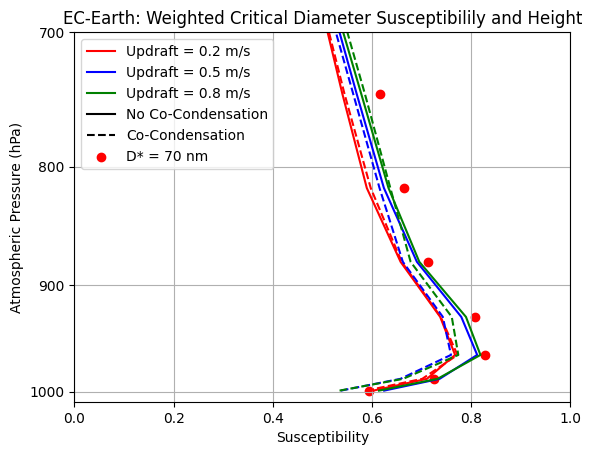

In [161]:
colors =['red','blue','green']
labelNoCC = ['Updraft = 0.2 m/s','Updraft = 0.5 m/s','Updraft = 0.8 m/s']
labelCC = ['Updraft = 0.2 m/s w/ CC','Updraft = 0.5 m/s w/ CC','Updraft = 0.8 m/s w/ CC']

for i in range(6):

    color_ = colors[i%3]
    listofSus = []
    
    for z in range(10):
        listofSus.append(ListECSus_[i][z][0])
    if i <= 2:
        plt.plot(listofSus,levelEC[0:10],color = color_, linestyle = '-', label = labelNoCC[i])
    if i>2:
        plt.plot(listofSus,levelEC[0:10],color = color_, linestyle = '--')
plt.plot([20,20], [20,20] ,color = 'black', linestyle = '-', label = 'No Co-Condensation')
plt.plot([20,20], [20,20] ,color = 'black', linestyle = '--', label = 'Co-Condensation')
for z in range(10):
    if z == 0:
        plt.scatter( LevelSus[z][0],levelEC[z] , color = 'red', label = 'D* = 70 nm')
        continue
    plt.scatter( LevelSus[z][0],levelEC[z] , color = 'red') 
plt.legend()       
plt.ylim(1010,700)
plt.title('EC-Earth: Weighted Critical Diameter Susceptibilily and Height')
plt.ylabel('Atmospheric Pressure (hPa)')
plt.xlabel('Susceptibility')
plt.xlim(0,1)
plt.grid()
plt.yscale('log')
plt.yticks([700,800,900,1000],[700,800,900,1000])
plt.show()

In [162]:
for i in range(6):
    print(f'Cluster {i+1}')
    print('Mean Activated Number Updraft 1',(ECGroup[i]['ActivatedNumberUpdraft1'].isel(lev = 0).mean()/1E6).values)
    print('Mean Activated Number Updraft 2',(ECGroup[i]['ActivatedNumberUpdraft2'].isel(lev = 0).mean()/1E6).values)
    print('Mean Activated Number Updraft 3',(ECGroup[i]['ActivatedNumberUpdraft3'].isel(lev = 0).mean()/1E6).values)
    print('Mean Activated Number Updraft 1 CC',(ECGroup[i]['ActivatedNumberUpdraft1CC'].isel(lev = 0).mean()/1E6).values)
    print('Mean Activated Number Updraft 2 CC',(ECGroup[i]['ActivatedNumberUpdraft2CC'].isel(lev = 0).mean()/1E6).values)
    print('Mean Activated Number Updraft 3 CC',(ECGroup[i]['ActivatedNumberUpdraft3CC'].isel(lev = 0).mean()/1E6).values)

Cluster 1
Mean Activated Number Updraft 1 110.95467624444075
Mean Activated Number Updraft 2 309.0017104649734
Mean Activated Number Updraft 3 575.6812422440406
Mean Activated Number Updraft 1 CC nan
Mean Activated Number Updraft 2 CC 575.6812422440406
Mean Activated Number Updraft 3 CC 1037.722064477677
Cluster 2
Mean Activated Number Updraft 1 106.45321422888644
Mean Activated Number Updraft 2 267.020294204719
Mean Activated Number Updraft 3 337.94995776256144
Mean Activated Number Updraft 1 CC 134.42726365135186
Mean Activated Number Updraft 2 CC 320.1110437252337
Mean Activated Number Updraft 3 CC 448.4469632555957
Cluster 3
Mean Activated Number Updraft 1 113.3189021617743
Mean Activated Number Updraft 2 184.58000556952317
Mean Activated Number Updraft 3 221.91559527115106
Mean Activated Number Updraft 1 CC 130.93478004466425
Mean Activated Number Updraft 2 CC 231.78202122035353
Mean Activated Number Updraft 3 CC 286.7581652501972
Cluster 4
Mean Activated Number Updraft 1 111.0851

In [163]:
for i in range(4):
    print(f'Cluster {i+1}')
    print('Mean Activated Number Updraft 1',(NorGroup[i]['ActivatedNumberUpdraft1'].isel(lev = -1).mean()).values)
    print('Mean Activated Number Updraft 2',(NorGroup[i]['ActivatedNumberUpdraft2'].isel(lev = -1).mean()).values)
    print('Mean Activated Number Updraft 3',(NorGroup[i]['ActivatedNumberUpdraft3'].isel(lev = -1).mean()).values)
    print('Mean Activated Number Updraft 1 CC',(NorGroup[i]['ActivatedNumberUpdraft1CC'].isel(lev = -1).mean()).values)
    print('Mean Activated Number Updraft 2 CC',(NorGroup[i]['ActivatedNumberUpdraft2CC'].isel(lev = -1).mean()).values)
    print('Mean Activated Number Updraft 3 CC',(NorGroup[i]['ActivatedNumberUpdraft3CC'].isel(lev = -1).mean()).values)

Cluster 1
Mean Activated Number Updraft 1 78.22346604123913
Mean Activated Number Updraft 2 141.48795976693071
Mean Activated Number Updraft 3 225.98313619410015
Mean Activated Number Updraft 1 CC 78.22346604123913
Mean Activated Number Updraft 2 CC 141.48795976693071
Mean Activated Number Updraft 3 CC 265.4649510053419
Cluster 2
Mean Activated Number Updraft 1 83.65366042600914
Mean Activated Number Updraft 2 204.3997322965296
Mean Activated Number Updraft 3 299.04895937054516
Mean Activated Number Updraft 1 CC 95.19664063896866
Mean Activated Number Updraft 2 CC 232.1253031505846
Mean Activated Number Updraft 3 CC 383.48625000790247
Cluster 3
Mean Activated Number Updraft 1 54.08951631161781
Mean Activated Number Updraft 2 93.03708501514159
Mean Activated Number Updraft 3 163.7566873308828
Mean Activated Number Updraft 1 CC 54.08951631161781
Mean Activated Number Updraft 2 CC 111.93663634169268
Mean Activated Number Updraft 3 CC 199.2226174847355
Cluster 4
Mean Activated Number Updra

In [164]:
for i in range(4):
    print(f'Cluster {i+1}')

    print(NorGroup[i]['ActivatedNumberUpdraft1CC'].isel(lev = -1).quantile(0.75).values- 
          NorGroup[i]['ActivatedNumberUpdraft1'].isel(lev = -1).quantile(0.75).values)
    print(NorGroup[i]['ActivatedNumberUpdraft2CC'].isel(lev = -1).quantile(0.75).values- 
          NorGroup[i]['ActivatedNumberUpdraft2'].isel(lev = -1).quantile(0.75).values)
    print(NorGroup[i]['ActivatedNumberUpdraft3CC'].isel(lev = -1).quantile(0.75).values-
          NorGroup[i]['ActivatedNumberUpdraft3'].isel(lev = -1).quantile(0.75).values)

Cluster 1
0.0
0.0
47.89374791010613
Cluster 2
15.131361426337065
34.02684246617724
106.31939441834868
Cluster 3
0.0
20.716068325732053
46.50772346377744
Cluster 4
0.0
53.94855633360072
63.674957538232945


In [165]:
(NorGroup[0]['Tot_dis'].isel(lev = -1).where(NorGroup[0]['D']>119.15).sum('D')*dx[0]).mean()

<xarray.DataArray ()> Size: 8B
array(432.32711263)
Coordinates:
    station  <U6 24B 'SMR-II'
    lev      float64 8B 992.6
    Dx       float64 8B 0.03765
    index    <U19 76B 'Cluster 1 Updraft 1'
    D        float64 8B 0.3162

In [166]:
for i in range(4):
    print(f'Cluster {i+1}')

    print(NorGroup[i]['ActivatedNumberUpdraft1CC'].isel(lev = -1).quantile(0.25).values- 
          NorGroup[i]['ActivatedNumberUpdraft1'].isel(lev = -1).quantile(0.25).values)
    print(NorGroup[i]['ActivatedNumberUpdraft2CC'].isel(lev = -1).quantile(0.25).values- 
          NorGroup[i]['ActivatedNumberUpdraft2'].isel(lev = -1).quantile(0.25).values)
    print(NorGroup[i]['ActivatedNumberUpdraft3CC'].isel(lev = -1).quantile(0.25).values-
          NorGroup[i]['ActivatedNumberUpdraft3'].isel(lev = -1).quantile(0.25).values)

Cluster 1
0.0
0.0
30.74188198734035
Cluster 2
6.232543515428638
20.28119522835469
64.78284392980228
Cluster 3
0.0
12.286654983947301
23.303016992192894
Cluster 4
0.0
27.009080865674832
33.11111524306591


In [167]:
NorESM_ds['lev'].isel(lev = -3)

<xarray.DataArray 'lev' ()> Size: 8B
array(957.48547954)
Coordinates:
    station  <U6 24B ...
    lev      float64 8B 957.5
    Dx       float64 8B ...
    index    <U19 76B ...

In [168]:
ECearth_ds['lev'].isel(lev = 2)

<xarray.DataArray 'lev' ()> Size: 4B
array(964.2048, dtype=float32)
Coordinates:
    lev      float32 4B 964.2
    station  <U6 24B 'SMR-II'
    Dx       float64 8B 0.03765
    index    <U19 76B 'Cluster 2 Updraft 1'

In [169]:
ListNorSus[i].append(Susceptibility(NorESM_ds['Tot_dis'].isel(lev = z).where(NorESM_ds['D']>ListVarNor[i][-z-1]).sum('D')*dx[0].where(NorESM_ds['Droplets'].isel(lev = z)>0).dropna('time'),NorESM_ds['Droplets'].isel(lev = z).dropna('time')))
        if i == 0:
            ListNorSus[i+3].append(Susceptibility(NorESM_ds['Tot_dis'].isel(lev = z).where(NorESM_ds['D']>ListVarNor[i+3][-z-1]).sum('D')*dx[0].where(NorESM_ds['DropletsCCUp1'].isel(lev = z)>0).dropna('time'),NorESM_ds['DropletsCCUp1'].isel(lev = z).dropna('time')))
        if i == 1:
              ListNorSus[i+3].append(Susceptibility(NorESM_ds['Tot_dis'].isel(lev = z).where(NorESM_ds['D']>ListVarNor[i+3][-z-1]).sum('D')*dx[0].where(NorESM_ds['DropletsCCUp2'].isel(lev = z)>0).dropna('time'),NorESM_ds['DropletsCCUp2'].isel(lev = z).dropna('time')))
        if i == 2:
            ListNorSus[i+3].append(Susceptibility(NorESM_ds['Tot_dis'].isel(lev = z).where(NorESM_ds['D']>ListVarNor[i+3][-z-1]).sum('D')*dx[0].where(NorESM_ds['DropletsCCUp3'].isel(lev = z)>0).dropna('time'),NorESM_ds['DropletsCCUp3'].isel(lev = z).dropna('time')))

IndentationError: unexpected indent (422956051.py, line 2)

In [170]:
z = -4
i = 1


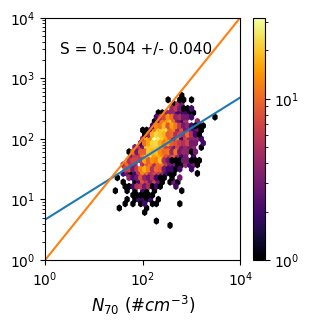

In [174]:
plt.figure(figsize = (8*cm,8*cm))

x =NorESM_ds['TotN70'].isel(lev = z).where(NorESM_ds['Droplets'].isel(lev = z)>0).dropna('time')
y = NorESM_ds['Droplets'].isel(lev = z).dropna('time')
Sus = Susceptibility(x,y)
plt.xlabel('$N_{70}$ ($ cm^{-3}$)',fontsize = 12)
plt.text(2,2500,f'S = {Sus[0]:.3f} +/- {Sus[1]*1.98:.3f}', fontsize = 11)   
NdtoCCNGraph(x,y)

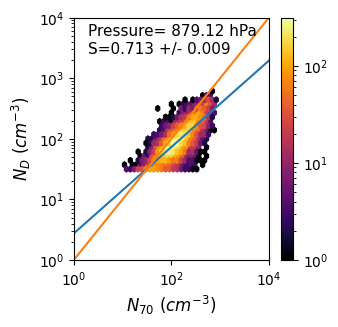

In [205]:
plt.figure(figsize = (8*cm,8*cm))

x =(ECearth_ds['TotN70'].isel(lev = 4).where(ECearth_ds['Droplets'].isel(lev = 4)>0)/1E6).dropna('time')
y = ECearth_ds['Droplets'].isel(lev = 4).dropna('time')
Sus = Susceptibility(x,y)
plt.xlabel('$N_{70}$ ($ cm^{-3}$)',fontsize = 12)
plt.ylabel('$N_{D}$ ($ cm^{-3}$)',fontsize = 12)
plt.text(2,5000,f'Pressure={ECearth_ds.lev.isel(lev =4).values: .2f} hPa', fontsize = 11)   
plt.text(2,2500,f'S={Sus[0]:.3f} +/- {Sus[1]*1.98:.3f}', fontsize = 11)   
NdtoCCNGraph(x,y)

In [194]:
NorESM_ds

<xarray.Dataset> Size: 489MB
Dimensions:                    (time: 8761, lev: 32, D: 200)
Coordinates:
  * time                       (time) datetime64[ns] 70kB 2012-01-02 ... 2015...
    station                    <U6 24B ...
  * lev                        (lev) float64 256B 3.643 7.595 ... 976.3 992.6
  * D                          (D) float64 2kB 0.3162 0.3331 ... 9.493e+03 1e+04
    Dx                         float64 8B ...
    index                      <U19 76B ...
Data variables: (12/35)
    TotaldNdlogD               (time, D) float64 14MB ...
    label                      (time) int32 35kB 3 3 3 3 3 3 3 ... 3 3 3 3 3 3 3
    time_of_day                (time) int64 70kB ...
    day_of_year                (time) int64 70kB ...
    Tot_dis                    (time, lev, D) float64 449MB ...
    Droplets                   (time, lev) float32 1MB ...
    ...                         ...
    Lev1Up2CC                  (time) float64 70kB 595.2 569.6 ... 73.91 72.21
    Lev2Up2CC                  (time) float64 70kB 536.6 514.6 ... 86.02 118.7
    Lev3Up2CC                  (time) float64 70kB 511.2 483.3 ... 51.36 83.02
    Lev1Up3CC                  (time) float64 70kB 770.9 735.8 ... 126.7 123.1
    Lev2Up3CC                  (time) float64 70kB 706.2 675.6 ... 128.7 169.3
    Lev3Up3CC                  (time) float64 70kB 673.4 635.6 ... 71.03 111.5

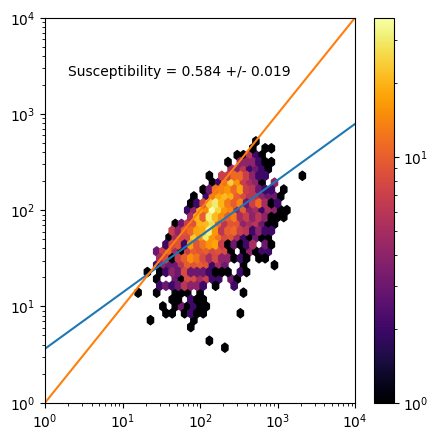

In [176]:
plt.figure(figsize = (5,5))
x =NorESM_ds['Tot_dis'].isel(lev = z).where(NorESM_ds['D']>ListVarNor_[i]).sum('D')*dx[0].where(NorESM_ds['Droplets'].isel(lev = z)>0).dropna('time')
y = NorESM_ds['Droplets'].isel(lev = z).dropna('time')
Sus = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {Sus[0]:.3f} +/- {Sus[1]:.3f}')   
NdtoCCNGraph(x,y)

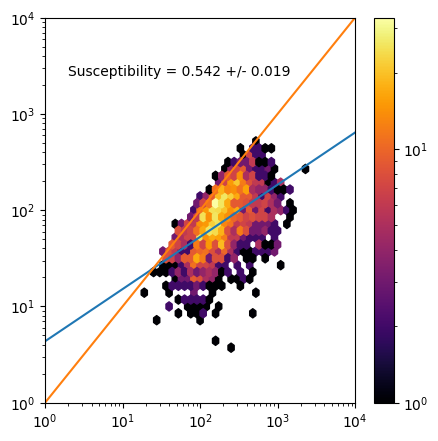

In [173]:
plt.figure(figsize = (5,5))
x =NorESM_ds['Tot_dis'].isel(lev = z).where(NorESM_ds['D']>ListVarNor_[i+3]).sum('D')*dx[0].where(NorESM_ds['DropletsCCUp1'].isel(lev = z)>0).dropna('time')
y = NorESM_ds['DropletsCCUp1'].isel(lev = z).dropna('time')
Sus = Susceptibility(x,y)
plt.text(2,2500,f'Susceptibility = {Sus[0]:.3f} +/- {Sus[1]:.3f}')   
NdtoCCNGraph(x,y)